In [1]:
# Analysis
import pandas as pd
import numpy as np

#Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns

#Extra
import warnings
warnings.filterwarnings(action="ignore")
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option("display.max_rows",1000)

In [2]:
###Importing the application data csv
appdata=pd.read_csv(r"C:\Users\parul\Downloads\Credit EDA Case Study_Parul\application_data.csv")

In [3]:
appdata.shape

(307511, 122)

In [5]:
appdata.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000,307511.000,307511.000,307511.000,307511.000,307499.000,307233.000,307511.000,307511.000,307511.000,...,307511.000,307511.000,307511.000,307511.000,265992.000,265992.000,265992.000,265992.000,265992.000,265992.000
mean,278180.519,0.081,0.417,168797.919,599026.000,27108.574,538396.207,0.021,-16036.995,63815.046,...,0.008,0.001,0.001,0.000,0.006,0.007,0.034,0.267,0.265,1.900
std,102790.175,0.272,0.722,237123.146,402490.777,14493.737,369446.461,0.014,4363.989,141275.767,...,0.090,0.024,0.023,0.018,0.084,0.111,0.205,0.916,0.794,1.869
min,100002.000,0.000,0.000,25650.000,45000.000,1615.500,40500.000,0.000,-25229.000,-17912.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,189145.500,0.000,0.000,112500.000,270000.000,16524.000,238500.000,0.010,-19682.000,-2760.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
50%,278202.000,0.000,0.000,147150.000,513531.000,24903.000,450000.000,0.019,-15750.000,-1213.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000
75%,367142.500,0.000,1.000,202500.000,808650.000,34596.000,679500.000,0.029,-12413.000,-289.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,3.000
max,456255.000,1.000,19.000,117000000.000,4050000.000,258025.500,4050000.000,0.073,-7489.000,365243.000,...,1.000,1.000,1.000,1.000,4.000,9.000,8.000,27.000,261.000,25.000


In [6]:
appdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [7]:
###Checking the unique value in columns in application data
for i in appdata.columns:
    print(i,appdata[i].nunique())

SK_ID_CURR 307511
TARGET 2
NAME_CONTRACT_TYPE 2
CODE_GENDER 3
FLAG_OWN_CAR 2
FLAG_OWN_REALTY 2
CNT_CHILDREN 15
AMT_INCOME_TOTAL 2548
AMT_CREDIT 5603
AMT_ANNUITY 13672
AMT_GOODS_PRICE 1002
NAME_TYPE_SUITE 7
NAME_INCOME_TYPE 8
NAME_EDUCATION_TYPE 5
NAME_FAMILY_STATUS 6
NAME_HOUSING_TYPE 6
REGION_POPULATION_RELATIVE 81
DAYS_BIRTH 17460
DAYS_EMPLOYED 12574
DAYS_REGISTRATION 15688
DAYS_ID_PUBLISH 6168
OWN_CAR_AGE 62
FLAG_MOBIL 2
FLAG_EMP_PHONE 2
FLAG_WORK_PHONE 2
FLAG_CONT_MOBILE 2
FLAG_PHONE 2
FLAG_EMAIL 2
OCCUPATION_TYPE 18
CNT_FAM_MEMBERS 17
REGION_RATING_CLIENT 3
REGION_RATING_CLIENT_W_CITY 3
WEEKDAY_APPR_PROCESS_START 7
HOUR_APPR_PROCESS_START 24
REG_REGION_NOT_LIVE_REGION 2
REG_REGION_NOT_WORK_REGION 2
LIVE_REGION_NOT_WORK_REGION 2
REG_CITY_NOT_LIVE_CITY 2
REG_CITY_NOT_WORK_CITY 2
LIVE_CITY_NOT_WORK_CITY 2
ORGANIZATION_TYPE 58
EXT_SOURCE_1 114584
EXT_SOURCE_2 119831
EXT_SOURCE_3 814
APARTMENTS_AVG 2339
BASEMENTAREA_AVG 3780
YEARS_BEGINEXPLUATATION_AVG 285
YEARS_BUILD_AVG 149
COMMONARE

In [3]:
###Identifying Missing Values Colums
mv=appdata.isnull().mean().reset_index()
# Converting into percentage
mv[0] = mv[0] * 100
mv = mv.rename(columns={"index":"Column Name",0:"% Missing Values"})
mv.sort_values(by="% Missing Values", ascending=False)


,Column Name,% Missing Values
76,COMMONAREA_MEDI,69.872
48,COMMONAREA_AVG,69.872
62,COMMONAREA_MODE,69.872
70,NONLIVINGAPARTMENTS_MODE,69.433
56,NONLIVINGAPARTMENTS_AVG,69.433
84,NONLIVINGAPARTMENTS_MEDI,69.433
86,FONDKAPREMONT_MODE,68.386
68,LIVINGAPARTMENTS_MODE,68.355
54,LIVINGAPARTMENTS_AVG,68.355
82,LIVINGAPARTMENTS_MEDI,68.355


In [4]:
#Dropping Columns having high percentage(>45) of Missing Values
drop_cols=list(mv[mv["% Missing Values"]>45]["Column Name"])
appd1=appdata.drop(drop_cols,axis=1)

In [28]:
#Checking the shape of new dataset
appd1.shape

(307511, 73)

In [10]:
## Taking absolute value for columns having negative values--- days can't be in negative ##
appd1["DAYS_BIRTH"]=appd1["DAYS_BIRTH"].abs()
appd1["DAYS_REGISTRATION"]=appd1["DAYS_REGISTRATION"].abs()
appd1["DAYS_ID_PUBLISH"]=appd1["DAYS_ID_PUBLISH"].abs()
appd1["DAYS_LAST_PHONE_CHANGE"]=appd1["DAYS_LAST_PHONE_CHANGE"].abs()
appd1["DAYS_EMPLOYED"]=appd1["DAYS_EMPLOYED"].abs()

In [56]:
appd1["AGE_BIRTH"]=appd1.DAYS_BIRTH/365

In [57]:
###Checking the unique value in columns in application data
for i in appd1.columns:
    print(i,appd1[i].nunique())

SK_ID_CURR 307511
TARGET 2
NAME_CONTRACT_TYPE 2
CODE_GENDER 3
FLAG_OWN_CAR 2
FLAG_OWN_REALTY 2
CNT_CHILDREN 4
AMT_INCOME_TOTAL 2210
AMT_CREDIT 4969
AMT_ANNUITY 11674
AMT_GOODS_PRICE 781
NAME_TYPE_SUITE 7
NAME_INCOME_TYPE 8
NAME_EDUCATION_TYPE 5
NAME_FAMILY_STATUS 6
NAME_HOUSING_TYPE 6
REGION_POPULATION_RELATIVE 81
DAYS_BIRTH 17460
DAYS_EMPLOYED 11769
DAYS_REGISTRATION 15109
DAYS_ID_PUBLISH 6168
FLAG_MOBIL 2
FLAG_EMP_PHONE 2
FLAG_WORK_PHONE 2
FLAG_CONT_MOBILE 2
FLAG_PHONE 2
FLAG_EMAIL 2
OCCUPATION_TYPE 18
CNT_FAM_MEMBERS 5
REGION_RATING_CLIENT 3
REGION_RATING_CLIENT_W_CITY 3
WEEKDAY_APPR_PROCESS_START 7
HOUR_APPR_PROCESS_START 24
REG_REGION_NOT_LIVE_REGION 2
REG_REGION_NOT_WORK_REGION 2
LIVE_REGION_NOT_WORK_REGION 2
REG_CITY_NOT_LIVE_CITY 2
REG_CITY_NOT_WORK_CITY 2
LIVE_CITY_NOT_WORK_CITY 2
ORGANIZATION_TYPE 58
EXT_SOURCE_2 119831
EXT_SOURCE_3 814
OBS_30_CNT_SOCIAL_CIRCLE 33
DEF_30_CNT_SOCIAL_CIRCLE 10
OBS_60_CNT_SOCIAL_CIRCLE 33
DEF_60_CNT_SOCIAL_CIRCLE 9
DAYS_LAST_PHONE_CHANGE 3510
FL

In [58]:
###Divinding columns between ID category,Continous Column and Categorical Columns
id_cols=["SK_ID_CURR"]
cont_cols=["CNT_CHILDREN","AMT_INCOME_TOTAL","AMT_CREDIT","AMT_ANNUITY","AMT_GOODS_PRICE","REGION_POPULATION_RELATIVE","AGE_BIRTH","DAYS_BIRTH","DAYS_EMPLOYED","DAYS_REGISTRATION","DAYS_ID_PUBLISH","CNT_FAM_MEMBERS","EXT_SOURCE_2","EXT_SOURCE_3","OBS_30_CNT_SOCIAL_CIRCLE","DEF_30_CNT_SOCIAL_CIRCLE","OBS_60_CNT_SOCIAL_CIRCLE","DEF_60_CNT_SOCIAL_CIRCLE","DAYS_LAST_PHONE_CHANGE","AMT_REQ_CREDIT_BUREAU_HOUR","AMT_REQ_CREDIT_BUREAU_DAY","AMT_REQ_CREDIT_BUREAU_WEEK","AMT_REQ_CREDIT_BUREAU_MON","AMT_REQ_CREDIT_BUREAU_QRT","AMT_REQ_CREDIT_BUREAU_YEAR"]
cat_cols=["TARGET","NAME_CONTRACT_TYPE","CODE_GENDER","FLAG_OWN_CAR","FLAG_OWN_REALTY","NAME_TYPE_SUITE","NAME_INCOME_TYPE","NAME_EDUCATION_TYPE","NAME_FAMILY_STATUS","NAME_HOUSING_TYPE","FLAG_MOBIL","FLAG_EMP_PHONE","FLAG_WORK_PHONE","FLAG_CONT_MOBILE","FLAG_PHONE","FLAG_EMAIL","OCCUPATION_TYPE","REGION_RATING_CLIENT","REGION_RATING_CLIENT_W_CITY","WEEKDAY_APPR_PROCESS_START","HOUR_APPR_PROCESS_START","REG_REGION_NOT_LIVE_REGION","REG_REGION_NOT_WORK_REGION","LIVE_REGION_NOT_WORK_REGION","REG_CITY_NOT_LIVE_CITY","REG_CITY_NOT_WORK_CITY","LIVE_CITY_NOT_WORK_CITY","ORGANIZATION_TYPE","FLAG_DOCUMENT_2","FLAG_DOCUMENT_3","FLAG_DOCUMENT_4","FLAG_DOCUMENT_5","FLAG_DOCUMENT_6","FLAG_DOCUMENT_7","FLAG_DOCUMENT_8","FLAG_DOCUMENT_9","FLAG_DOCUMENT_10","FLAG_DOCUMENT_11","FLAG_DOCUMENT_12","FLAG_DOCUMENT_13","FLAG_DOCUMENT_14","FLAG_DOCUMENT_15","FLAG_DOCUMENT_16","FLAG_DOCUMENT_17","FLAG_DOCUMENT_18","FLAG_DOCUMENT_19","FLAG_DOCUMENT_20","FLAG_DOCUMENT_21"]
#Verifying that all columns are covered
len(id_cols)+len(cont_cols)+len(cat_cols)

74

In [14]:
appd1.isnull().sum()

SK_ID_CURR                         0
TARGET                             0
NAME_CONTRACT_TYPE                 0
CODE_GENDER                        0
FLAG_OWN_CAR                       0
FLAG_OWN_REALTY                    0
CNT_CHILDREN                       0
AMT_INCOME_TOTAL                   0
AMT_CREDIT                         0
AMT_ANNUITY                       12
AMT_GOODS_PRICE                  278
NAME_TYPE_SUITE                 1292
NAME_INCOME_TYPE                   0
NAME_EDUCATION_TYPE                0
NAME_FAMILY_STATUS                 0
NAME_HOUSING_TYPE                  0
REGION_POPULATION_RELATIVE         0
DAYS_BIRTH                         0
DAYS_EMPLOYED                      0
DAYS_REGISTRATION                  0
DAYS_ID_PUBLISH                    0
FLAG_MOBIL                         0
FLAG_EMP_PHONE                     0
FLAG_WORK_PHONE                    0
FLAG_CONT_MOBILE                   0
FLAG_PHONE                         0
FLAG_EMAIL                         0
O

In [59]:
#Handling/Imputing Missing Values for Continous Columns
for i in cont_cols:
    if appd1[i].isnull().sum()>0:
        imp_val=appd1[i].median()
        appd1[i]=appd1[i].fillna(imp_val)

In [60]:
#Handling/Imputing Missing Values for Categorical Columns
for i in cat_cols:
    if appd1[i].isnull().sum()>0:
        imp_val=appd1[i].mode()[0]
        appd1[i]=appd1[i].fillna(imp_val)

In [17]:
###Verifying if any Missing/Null values remaining
appd1.isnull().sum()

SK_ID_CURR                     0
TARGET                         0
NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
CNT_CHILDREN                   0
AMT_INCOME_TOTAL               0
AMT_CREDIT                     0
AMT_ANNUITY                    0
AMT_GOODS_PRICE                0
NAME_TYPE_SUITE                0
NAME_INCOME_TYPE               0
NAME_EDUCATION_TYPE            0
NAME_FAMILY_STATUS             0
NAME_HOUSING_TYPE              0
REGION_POPULATION_RELATIVE     0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
DAYS_REGISTRATION              0
DAYS_ID_PUBLISH                0
FLAG_MOBIL                     0
FLAG_EMP_PHONE                 0
FLAG_WORK_PHONE                0
FLAG_CONT_MOBILE               0
FLAG_PHONE                     0
FLAG_EMAIL                     0
OCCUPATION_TYPE                0
CNT_FAM_MEMBERS                0
REGION_RATING_CLIENT           0
REGION_RAT

In [61]:
##Taking Important columns for Analysis
imp_cont_cols=["CNT_CHILDREN","AMT_INCOME_TOTAL","AMT_CREDIT","AMT_ANNUITY","AMT_GOODS_PRICE","REGION_POPULATION_RELATIVE","AGE_BIRTH","DAYS_BIRTH","DAYS_EMPLOYED","DAYS_REGISTRATION","DAYS_ID_PUBLISH","CNT_FAM_MEMBERS","EXT_SOURCE_2","EXT_SOURCE_3","DAYS_LAST_PHONE_CHANGE"]
imp_cat_cols=["TARGET","NAME_CONTRACT_TYPE","CODE_GENDER","FLAG_OWN_CAR","FLAG_OWN_REALTY","NAME_TYPE_SUITE","NAME_INCOME_TYPE","NAME_EDUCATION_TYPE","NAME_FAMILY_STATUS","NAME_HOUSING_TYPE","FLAG_MOBIL","FLAG_EMP_PHONE","FLAG_WORK_PHONE","FLAG_CONT_MOBILE","FLAG_PHONE","FLAG_EMAIL","OCCUPATION_TYPE","REGION_RATING_CLIENT","ORGANIZATION_TYPE"]
#Verifying that count of columns used for Analysis
len(imp_cont_cols)+len(imp_cat_cols)

34

In [42]:
appd1.DAYS_EMPLOYED.value_counts()

365243    55374
200         156
224         152
230         151
199         151
          ...  
13961         1
11827         1
10176         1
9459          1
8694          1
Name: DAYS_EMPLOYED, Length: 12574, dtype: int64

Distribution of  CNT_CHILDREN


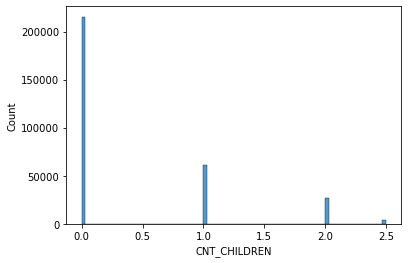

Distribution of  AMT_INCOME_TOTAL


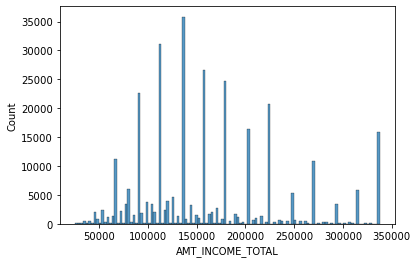

Distribution of  AMT_CREDIT


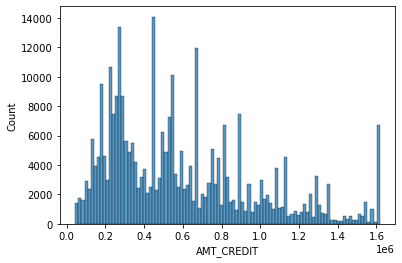

Distribution of  AMT_ANNUITY


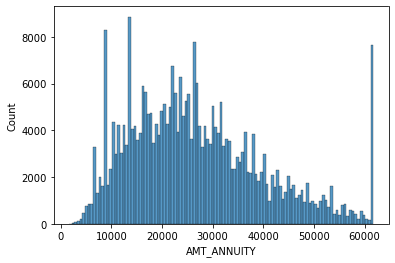

Distribution of  AMT_GOODS_PRICE


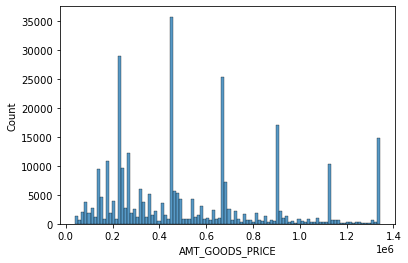

Distribution of  REGION_POPULATION_RELATIVE


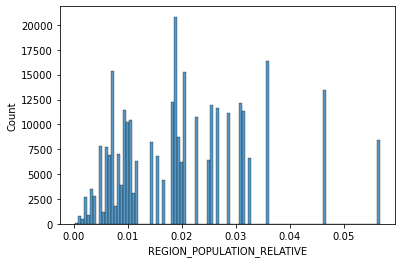

Distribution of  AGE_BIRTH


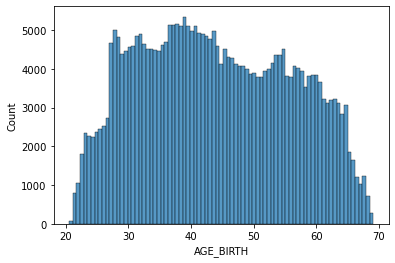

Distribution of  DAYS_BIRTH


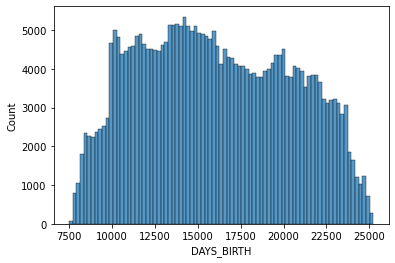

Distribution of  DAYS_EMPLOYED


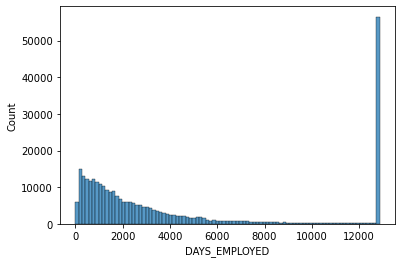

Distribution of  DAYS_REGISTRATION


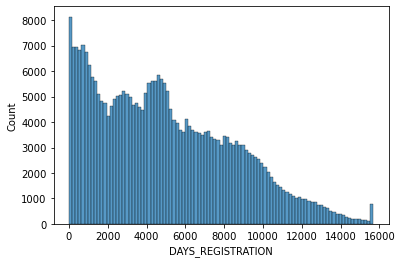

Distribution of  DAYS_ID_PUBLISH


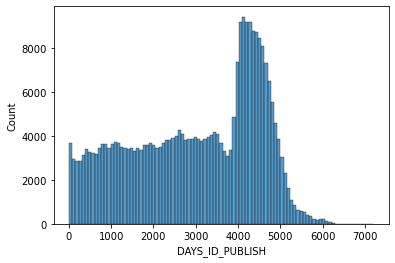

Distribution of  CNT_FAM_MEMBERS


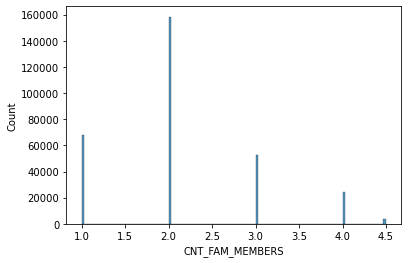

Distribution of  EXT_SOURCE_2


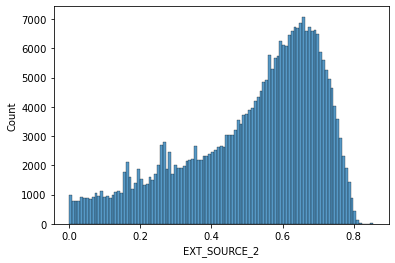

Distribution of  EXT_SOURCE_3


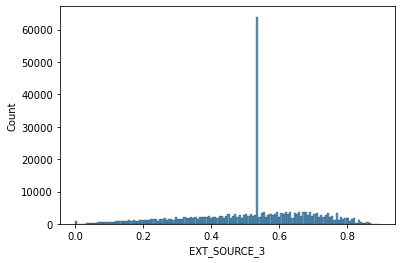

Distribution of  DAYS_LAST_PHONE_CHANGE


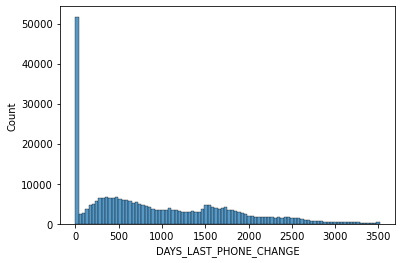

In [63]:
##Univariate Analysis for Continous Columns for Application Data
for i in imp_cont_cols:
    print('Distribution of ',i)
    sns.histplot(appd1[i])
    plt.show()
       

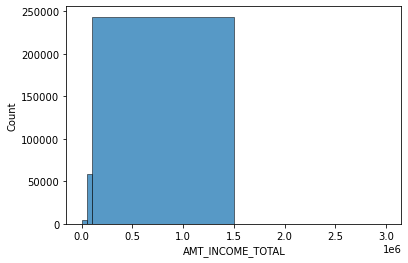

In [12]:
##Analysing Total Income as not getting better scale in loops,so use binning ###
sns.histplot(appd1.AMT_INCOME_TOTAL,bins=[0,50000,100000,1500000,2000000,2500000,3000000])
plt.show()

In [24]:
appd1.AMT_INCOME_TOTAL.value_counts()

135000.000    35750
112500.000    31019
157500.000    26556
180000.000    24719
90000.000     22483
              ...  
117324.000        1
64584.000         1
142897.500        1
109170.000        1
113062.500        1
Name: AMT_INCOME_TOTAL, Length: 2548, dtype: int64

Outlier Analysis for  CNT_CHILDREN
IQR: 1.0  Median: 0.0  lower_bound: -1.5  upper_bound: 2.5


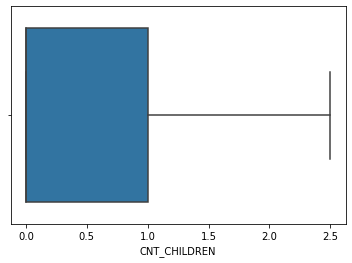

Outlier Analysis for  AMT_INCOME_TOTAL
IQR: 90000.0  Median: 147150.0  lower_bound: -22500.0  upper_bound: 337500.0


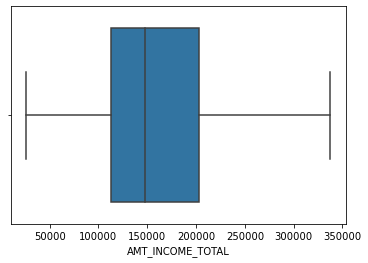

Outlier Analysis for  AMT_CREDIT
IQR: 538650.0  Median: 513531.0  lower_bound: -537975.0  upper_bound: 1616625.0


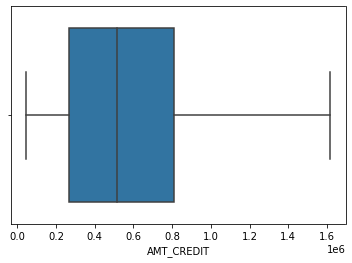

Outlier Analysis for  AMT_ANNUITY
IQR: 18072.0  Median: 24903.0  lower_bound: -10584.0  upper_bound: 61704.0


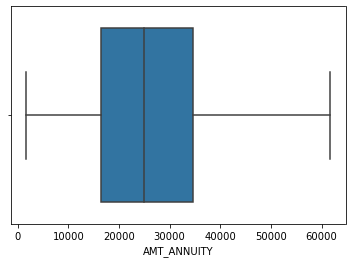

Outlier Analysis for  AMT_GOODS_PRICE
IQR: 441000.0  Median: 450000.0  lower_bound: -423000.0  upper_bound: 1341000.0


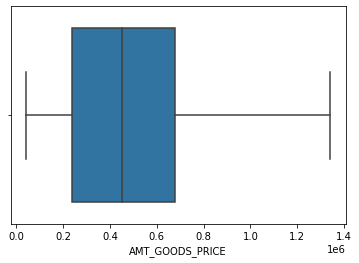

Outlier Analysis for  REGION_POPULATION_RELATIVE
IQR: 0.018657  Median: 0.01885  lower_bound: -0.017979500000000002  upper_bound: 0.056648500000000004


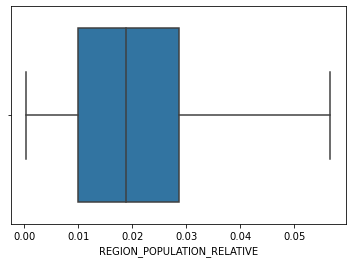

Outlier Analysis for  AGE_BIRTH
IQR: 19.915068493150685  Median: 43.15068493150685  lower_bound: 4.135616438356166  upper_bound: 83.7958904109589


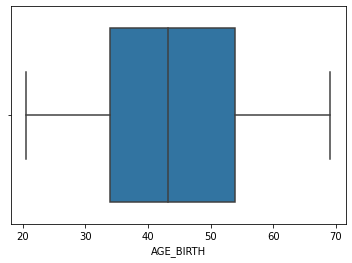

Outlier Analysis for  DAYS_BIRTH
IQR: 7269.0  Median: 15750.0  lower_bound: 1509.5  upper_bound: 30585.5


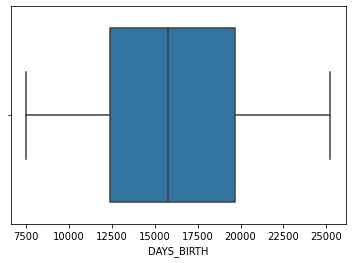

Outlier Analysis for  DAYS_EMPLOYED
IQR: 4774.0  Median: 2219.0  lower_bound: -6228.0  upper_bound: 12868.0


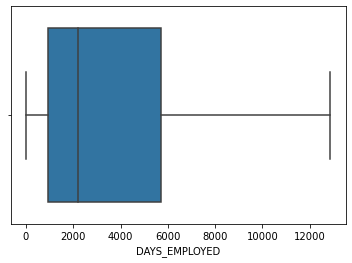

Outlier Analysis for  DAYS_REGISTRATION
IQR: 5469.5  Median: 4504.0  lower_bound: -6194.25  upper_bound: 15683.75


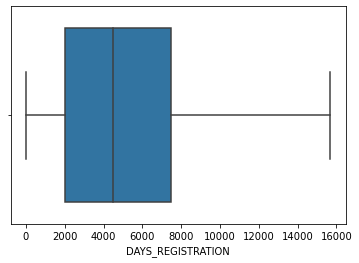

Outlier Analysis for  DAYS_ID_PUBLISH
IQR: 2579.0  Median: 3254.0  lower_bound: -2148.5  upper_bound: 8167.5


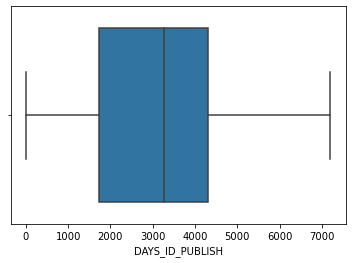

Outlier Analysis for  CNT_FAM_MEMBERS
IQR: 1.0  Median: 2.0  lower_bound: 0.5  upper_bound: 4.5


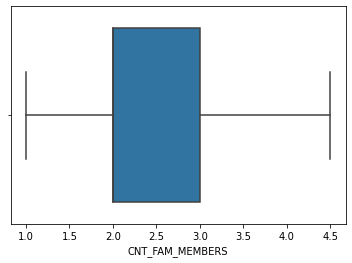

Outlier Analysis for  EXT_SOURCE_2
IQR: 0.27044808127614073  Median: 0.5659614260608526  lower_bound: -0.012698400911027807  upper_bound: 1.069093924193535


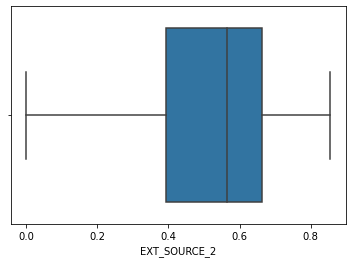

Outlier Analysis for  EXT_SOURCE_3
IQR: 0.21927650283383426  Median: 0.5352762504724826  lower_bound: 0.08818491400145828  upper_bound: 0.9652909253367954


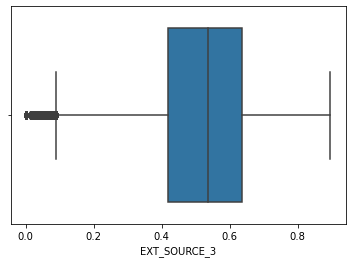

Outlier Analysis for  DAYS_LAST_PHONE_CHANGE
IQR: 1296.0  Median: 757.0  lower_bound: -1670.0  upper_bound: 3514.0


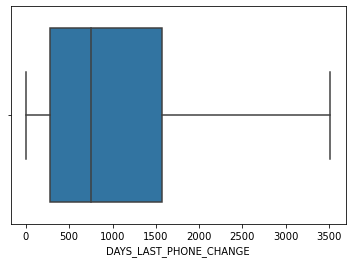

In [62]:
#For Outlier Analysis/Treatment (Boxplot)
for i in imp_cont_cols:
    print("Outlier Analysis for ",i)
    q3,q2, q1 = np.percentile(appd1[i], [75,50,25])
    iqr = q3 - q1
    lower_bound = q1 -1.5*iqr
    upper_bound =q3 + 1.5 *iqr
    print ("IQR:" ,iqr," Median:",q2, " lower_bound:",lower_bound ," upper_bound:",upper_bound)
    sns.boxplot(appd1[i])
    plt.show()
    appd1[i]=np.where(appd1[i]>upper_bound,upper_bound,appd1[i])

<AxesSubplot:xlabel='DAYS_EMPLOYED'>

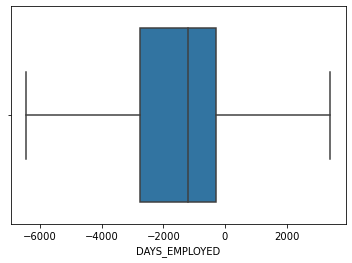

In [18]:
q3, q1 = np.percentile(appd1.DAYS_EMPLOYED, [75 ,25])
iqr = q3 - q1
lower_bound = q1 -1.5*iqr
upper_bound =q3 + 1.5 *iqr
appd1["DAYS_EMPLOYED"]=np.where(appd1["DAYS_EMPLOYED"]<lower_bound,lower_bound,appd1["DAYS_EMPLOYED"])
appd1["DAYS_EMPLOYED"]=np.where(appd1["DAYS_EMPLOYED"]>upper_bound,upper_bound,appd1["DAYS_EMPLOYED"])
sns.boxplot(appd1["DAYS_EMPLOYED"])

In [73]:
appd1.DAYS_LAST_PHONE_CHANGE.describe()

count   307511.000
mean       962.858
std        826.807
min          0.000
25%        274.000
50%        757.000
75%       1570.000
max       4292.000
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [81]:
##Flooring/Capping /IQR value for DAYS_LAST_PHONE_CHANGE ##
q3, q1 = np.percentile(appd1.DAYS_LAST_PHONE_CHANGE, [75 ,25])
iqr = q3 - q1
floor = q1 -1.5*iqr
floor
capping =q3 + 1.5 *iqr
print ("IQR" ,iqr)
print ("Floor" ,floor)
print ("Capping" ,capping)

IQR 1296.0
Floor -1670.0
Capping 3514.0


In [83]:
appd1.AMT_INCOME_TOTAL.describe()

count      307511.000
mean       168797.919
std        237123.146
min         25650.000
25%        112500.000
50%        147150.000
75%        202500.000
max     117000000.000
Name: AMT_INCOME_TOTAL, dtype: float64

In [82]:
##Flooring/Capping /IQR value for AMT_INCOME_TOTAL ###
q3, q1 = np.percentile(appd1.AMT_INCOME_TOTAL, [75 ,25])
iqr = q3 - q1
print ("IQR" ,iqr)
floor = q1 -1.5*iqr
print ("Floor" ,floor)
capping =q3 + 1.5 *iqr
print ("Capping" ,capping)

IQR 90000.0
Floor -22500.0
Capping 337500.0


TARGET CNT_CHILDREN


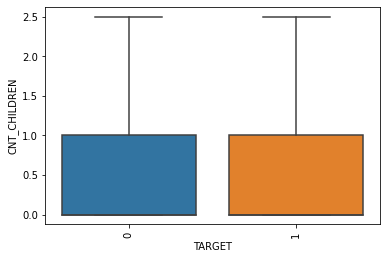

TARGET AMT_INCOME_TOTAL


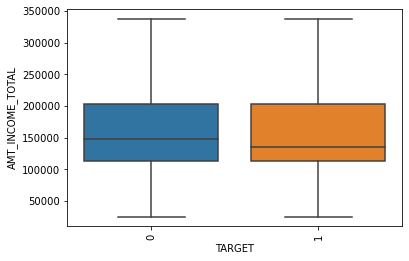

TARGET AMT_CREDIT


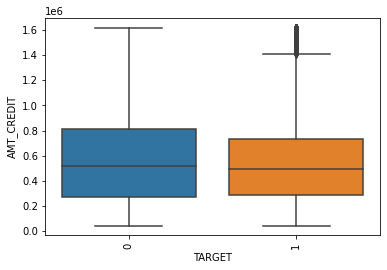

TARGET AMT_ANNUITY


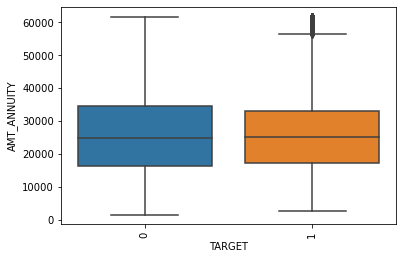

TARGET AMT_GOODS_PRICE


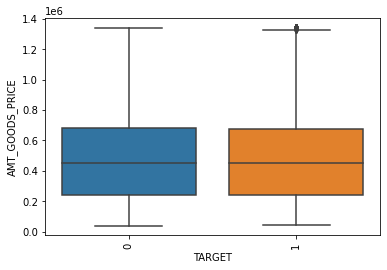

TARGET REGION_POPULATION_RELATIVE


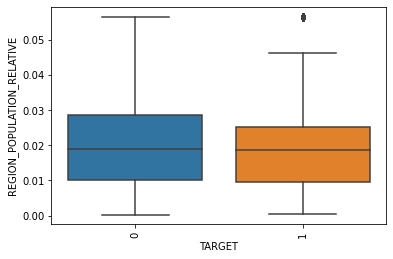

TARGET AGE_BIRTH


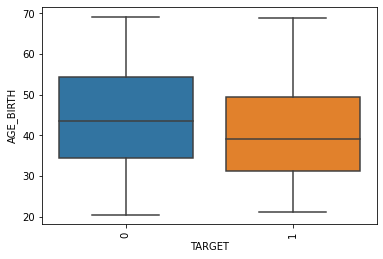

TARGET DAYS_BIRTH


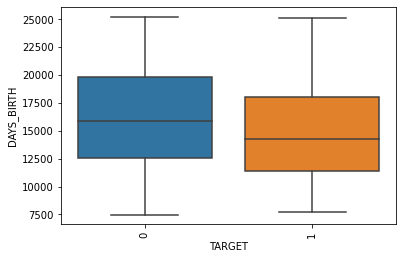

TARGET DAYS_EMPLOYED


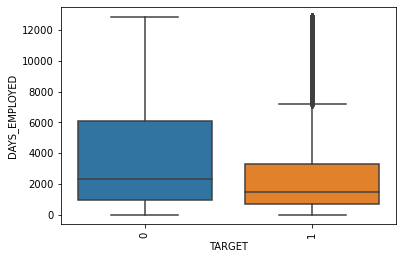

TARGET DAYS_REGISTRATION


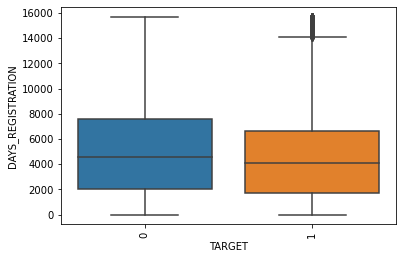

TARGET DAYS_ID_PUBLISH


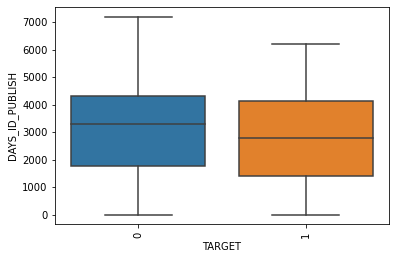

TARGET CNT_FAM_MEMBERS


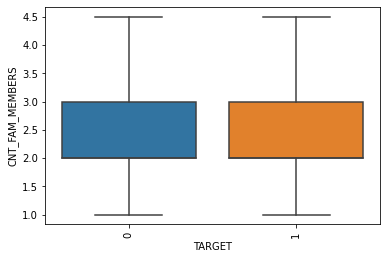

TARGET EXT_SOURCE_2


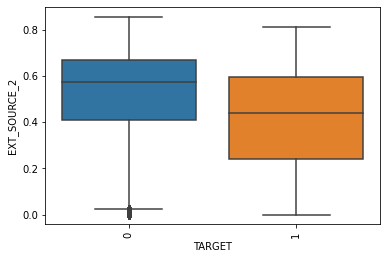

TARGET EXT_SOURCE_3


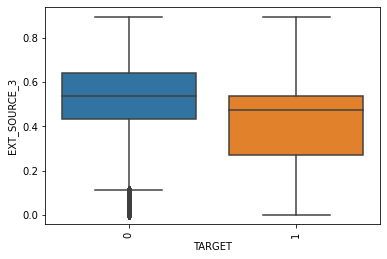

TARGET DAYS_LAST_PHONE_CHANGE


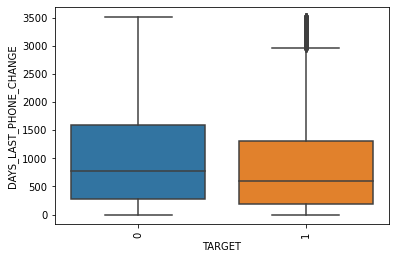

NAME_CONTRACT_TYPE CNT_CHILDREN


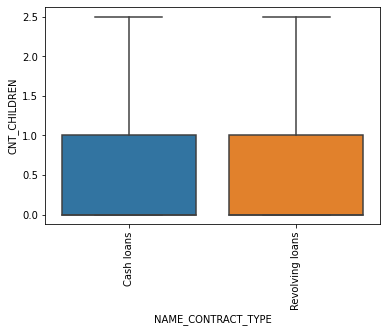

NAME_CONTRACT_TYPE AMT_INCOME_TOTAL


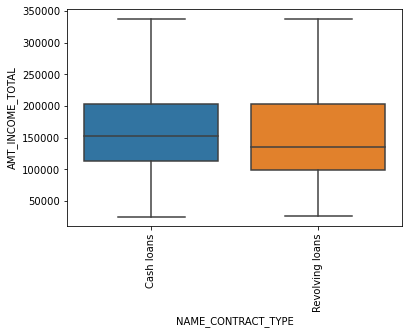

NAME_CONTRACT_TYPE AMT_CREDIT


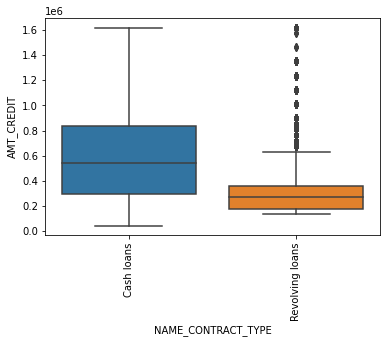

NAME_CONTRACT_TYPE AMT_ANNUITY


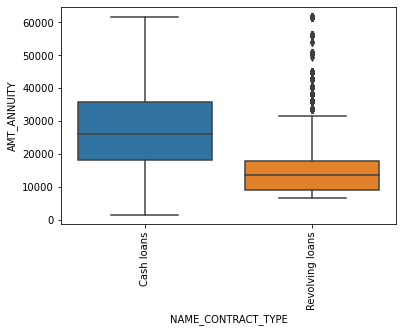

NAME_CONTRACT_TYPE AMT_GOODS_PRICE


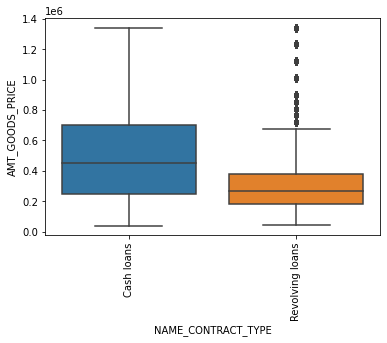

NAME_CONTRACT_TYPE REGION_POPULATION_RELATIVE


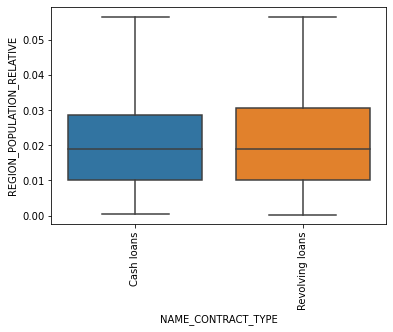

NAME_CONTRACT_TYPE AGE_BIRTH


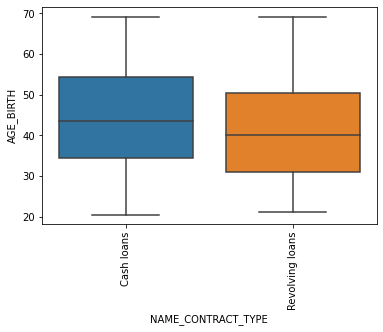

NAME_CONTRACT_TYPE DAYS_BIRTH


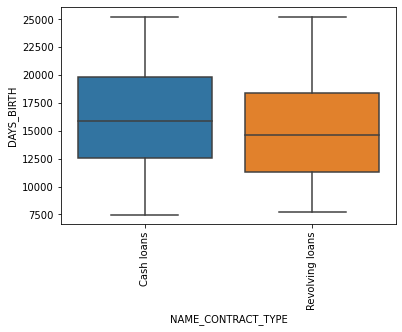

NAME_CONTRACT_TYPE DAYS_EMPLOYED


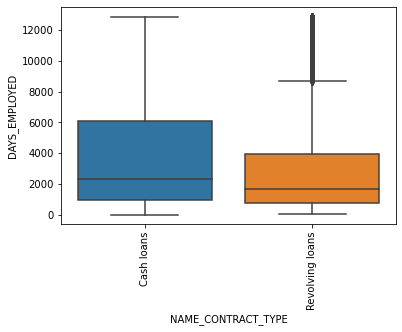

NAME_CONTRACT_TYPE DAYS_REGISTRATION


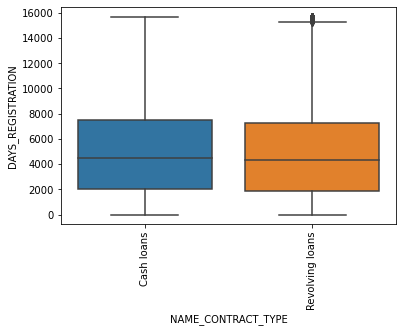

NAME_CONTRACT_TYPE DAYS_ID_PUBLISH


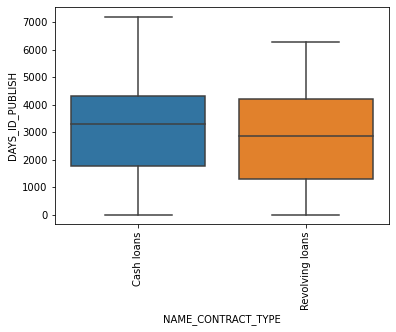

NAME_CONTRACT_TYPE CNT_FAM_MEMBERS


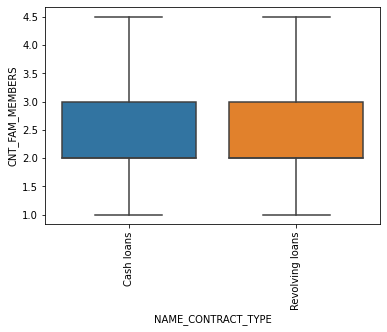

NAME_CONTRACT_TYPE EXT_SOURCE_2


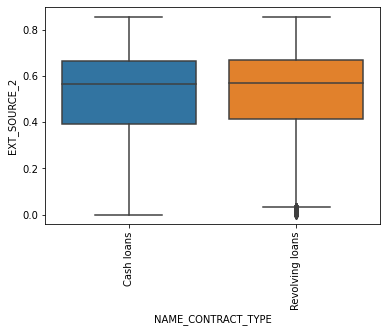

NAME_CONTRACT_TYPE EXT_SOURCE_3


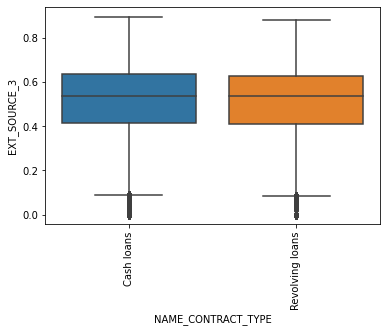

NAME_CONTRACT_TYPE DAYS_LAST_PHONE_CHANGE


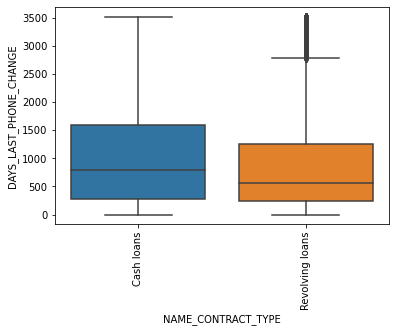

CODE_GENDER CNT_CHILDREN


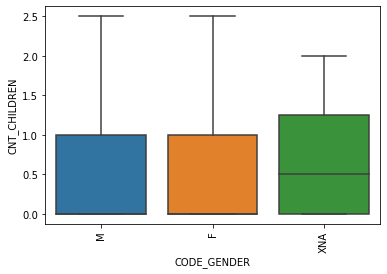

CODE_GENDER AMT_INCOME_TOTAL


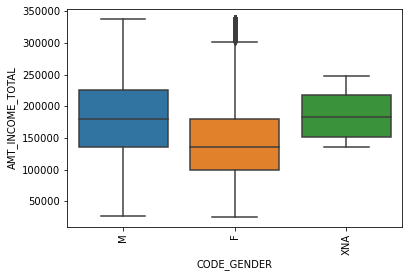

CODE_GENDER AMT_CREDIT


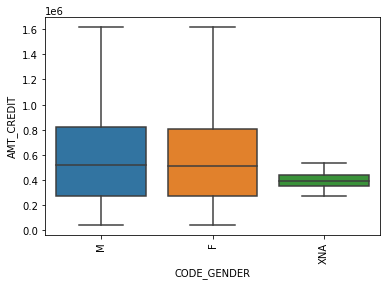

CODE_GENDER AMT_ANNUITY


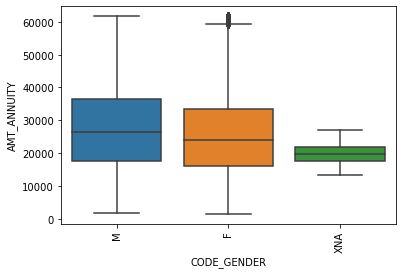

CODE_GENDER AMT_GOODS_PRICE


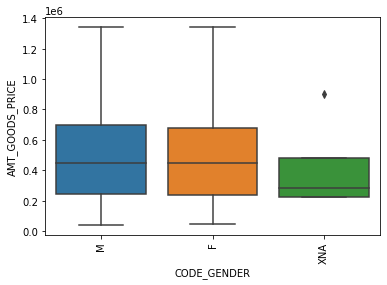

CODE_GENDER REGION_POPULATION_RELATIVE


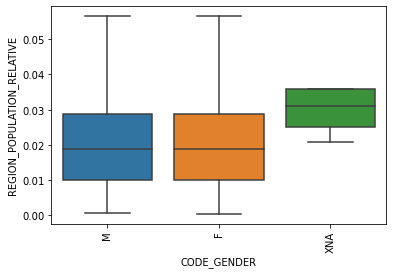

CODE_GENDER AGE_BIRTH


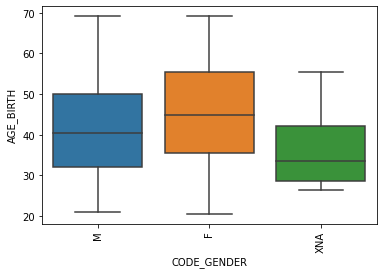

CODE_GENDER DAYS_BIRTH


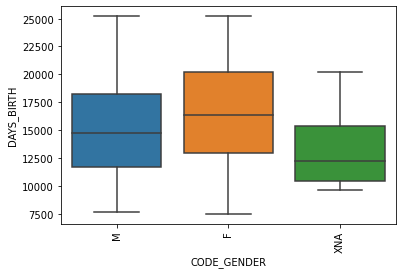

CODE_GENDER DAYS_EMPLOYED


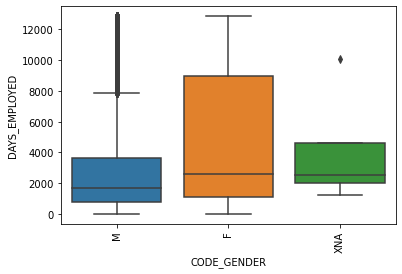

CODE_GENDER DAYS_REGISTRATION


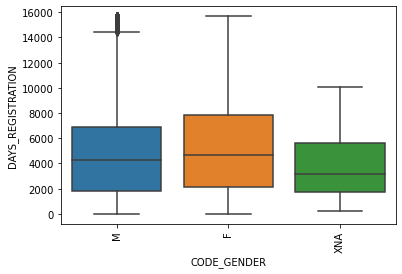

CODE_GENDER DAYS_ID_PUBLISH


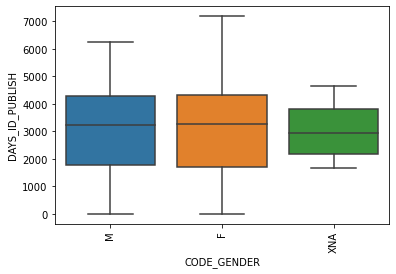

CODE_GENDER CNT_FAM_MEMBERS


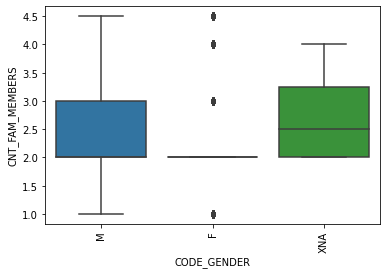

CODE_GENDER EXT_SOURCE_2


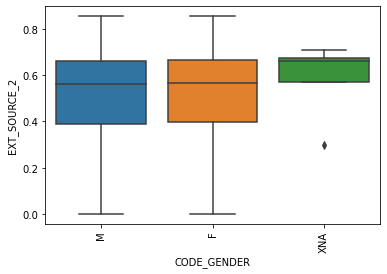

CODE_GENDER EXT_SOURCE_3


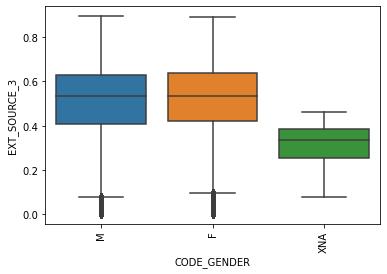

CODE_GENDER DAYS_LAST_PHONE_CHANGE


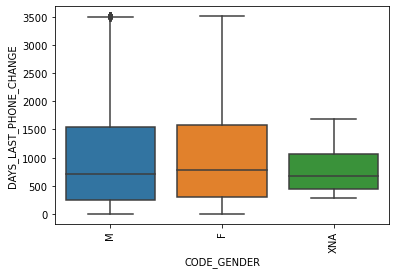

FLAG_OWN_CAR CNT_CHILDREN


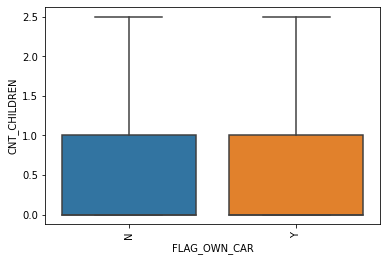

FLAG_OWN_CAR AMT_INCOME_TOTAL


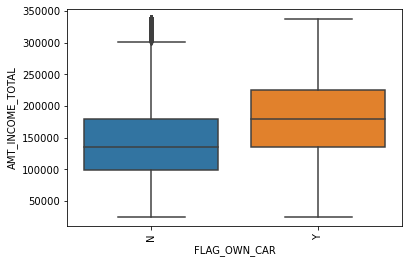

FLAG_OWN_CAR AMT_CREDIT


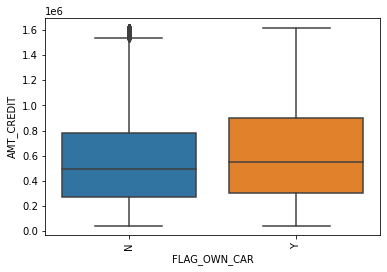

FLAG_OWN_CAR AMT_ANNUITY


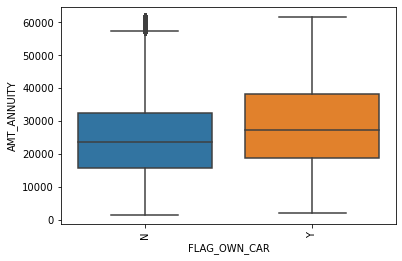

FLAG_OWN_CAR AMT_GOODS_PRICE


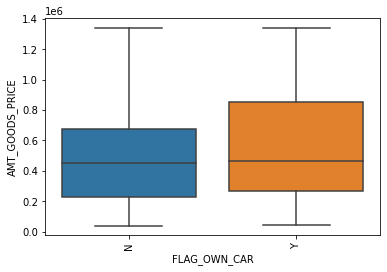

FLAG_OWN_CAR REGION_POPULATION_RELATIVE


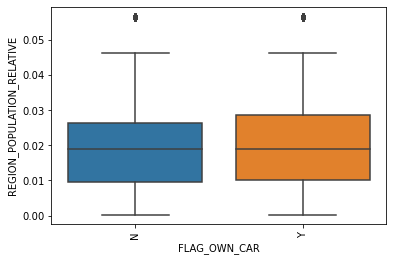

FLAG_OWN_CAR AGE_BIRTH


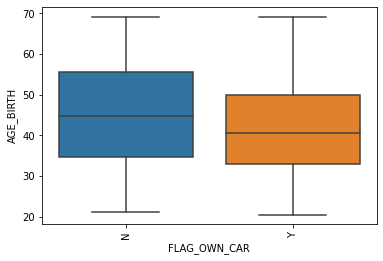

FLAG_OWN_CAR DAYS_BIRTH


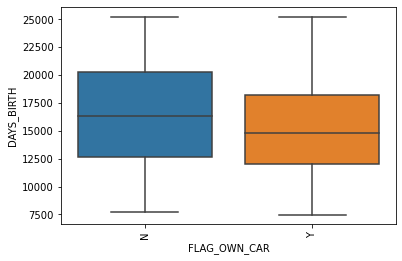

FLAG_OWN_CAR DAYS_EMPLOYED


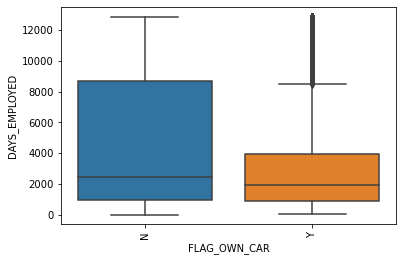

FLAG_OWN_CAR DAYS_REGISTRATION


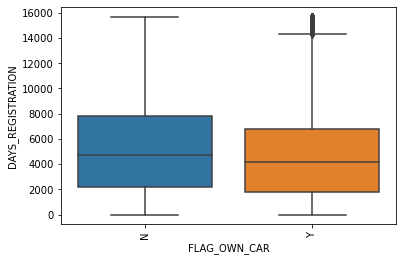

FLAG_OWN_CAR DAYS_ID_PUBLISH


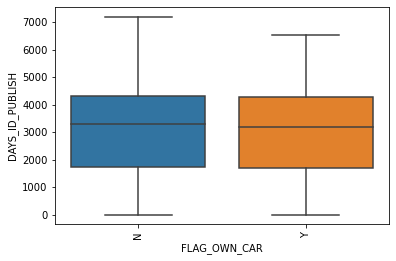

FLAG_OWN_CAR CNT_FAM_MEMBERS


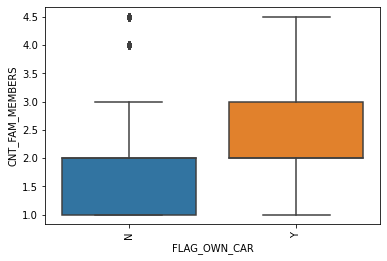

FLAG_OWN_CAR EXT_SOURCE_2


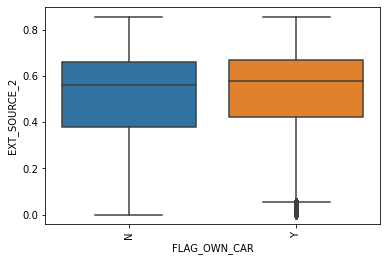

FLAG_OWN_CAR EXT_SOURCE_3


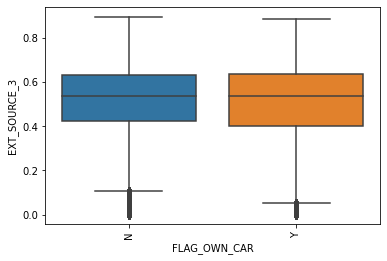

FLAG_OWN_CAR DAYS_LAST_PHONE_CHANGE


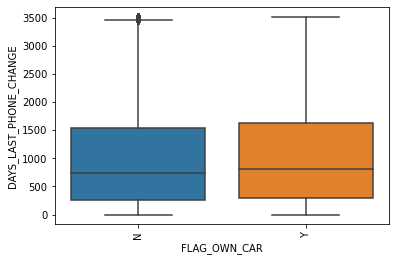

FLAG_OWN_REALTY CNT_CHILDREN


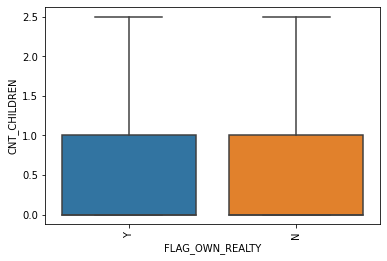

FLAG_OWN_REALTY AMT_INCOME_TOTAL


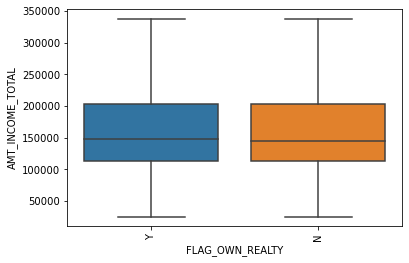

FLAG_OWN_REALTY AMT_CREDIT


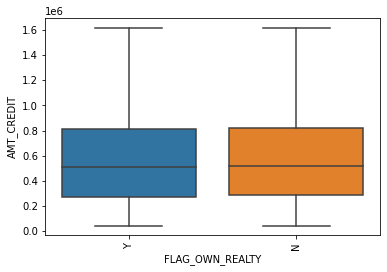

FLAG_OWN_REALTY AMT_ANNUITY


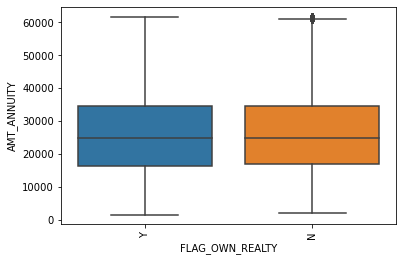

FLAG_OWN_REALTY AMT_GOODS_PRICE


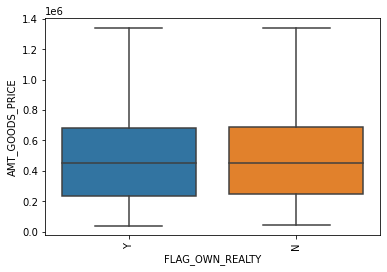

FLAG_OWN_REALTY REGION_POPULATION_RELATIVE


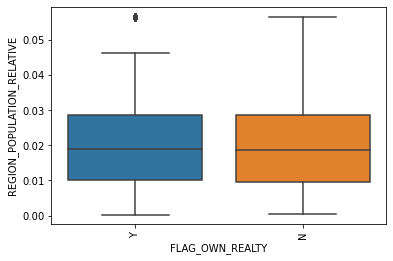

FLAG_OWN_REALTY AGE_BIRTH


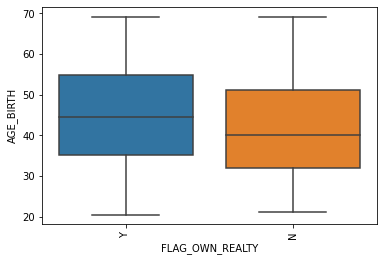

FLAG_OWN_REALTY DAYS_BIRTH


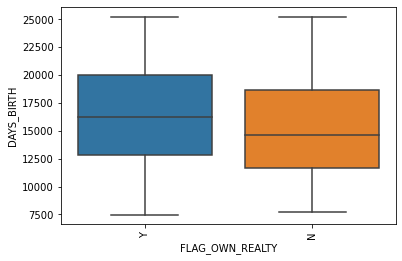

FLAG_OWN_REALTY DAYS_EMPLOYED


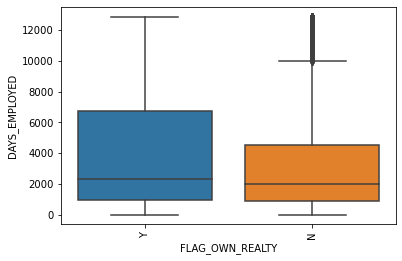

FLAG_OWN_REALTY DAYS_REGISTRATION


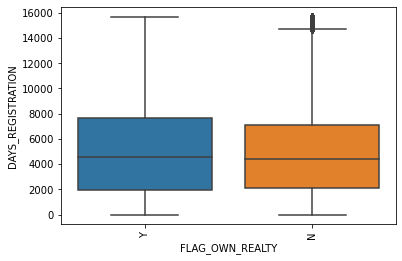

FLAG_OWN_REALTY DAYS_ID_PUBLISH


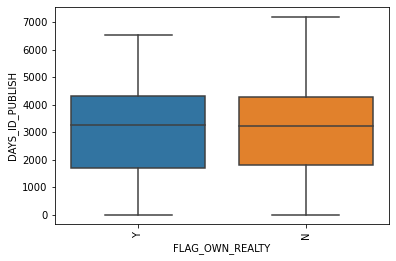

FLAG_OWN_REALTY CNT_FAM_MEMBERS


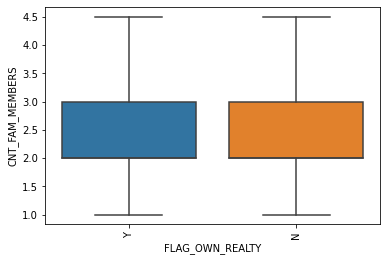

FLAG_OWN_REALTY EXT_SOURCE_2


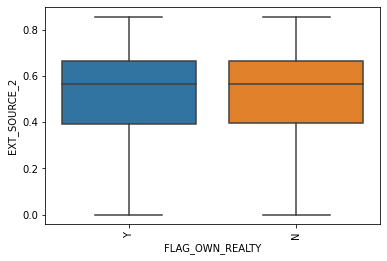

FLAG_OWN_REALTY EXT_SOURCE_3


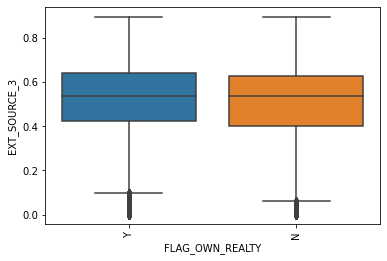

FLAG_OWN_REALTY DAYS_LAST_PHONE_CHANGE


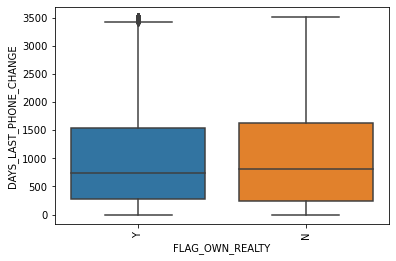

NAME_TYPE_SUITE CNT_CHILDREN


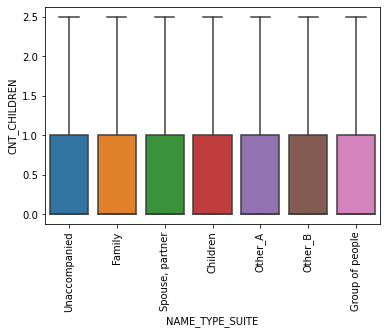

NAME_TYPE_SUITE AMT_INCOME_TOTAL


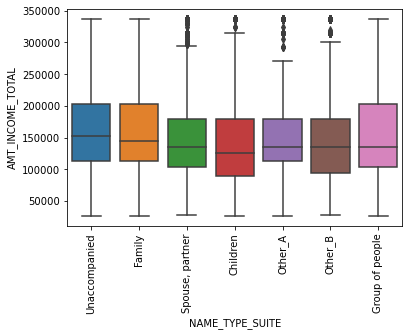

NAME_TYPE_SUITE AMT_CREDIT


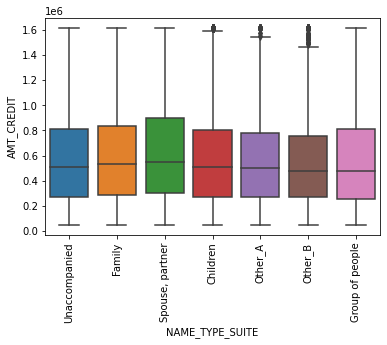

NAME_TYPE_SUITE AMT_ANNUITY


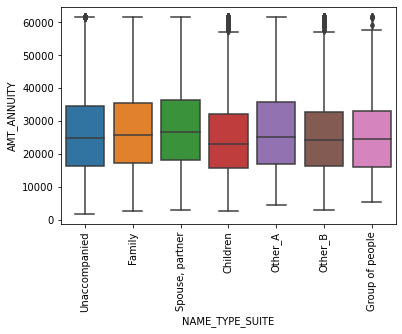

NAME_TYPE_SUITE AMT_GOODS_PRICE


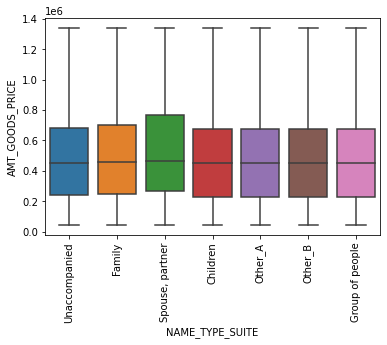

NAME_TYPE_SUITE REGION_POPULATION_RELATIVE


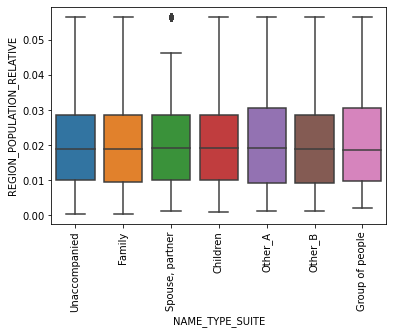

NAME_TYPE_SUITE AGE_BIRTH


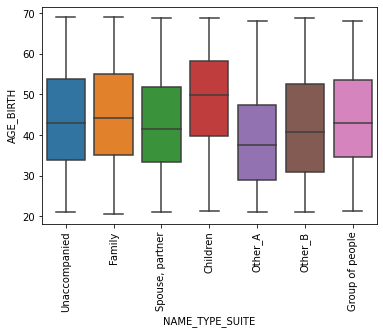

NAME_TYPE_SUITE DAYS_BIRTH


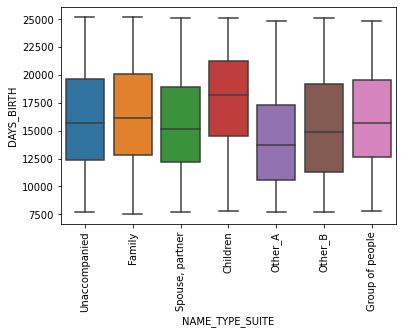

NAME_TYPE_SUITE DAYS_EMPLOYED


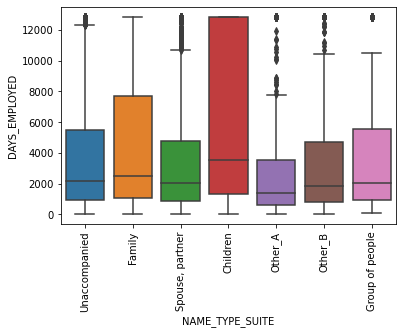

NAME_TYPE_SUITE DAYS_REGISTRATION


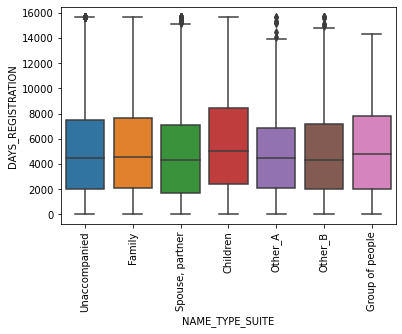

NAME_TYPE_SUITE DAYS_ID_PUBLISH


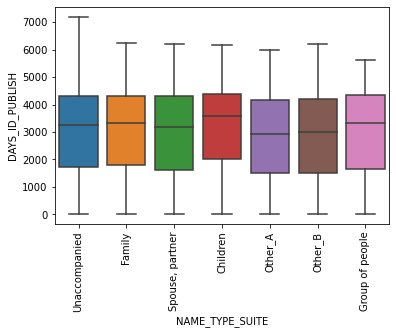

NAME_TYPE_SUITE CNT_FAM_MEMBERS


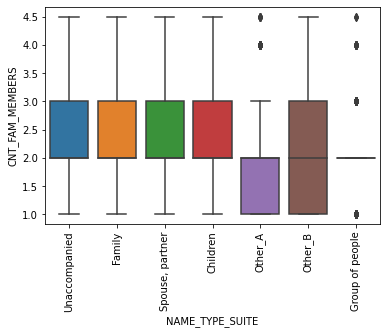

NAME_TYPE_SUITE EXT_SOURCE_2


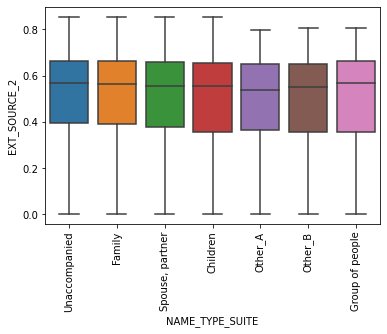

NAME_TYPE_SUITE EXT_SOURCE_3


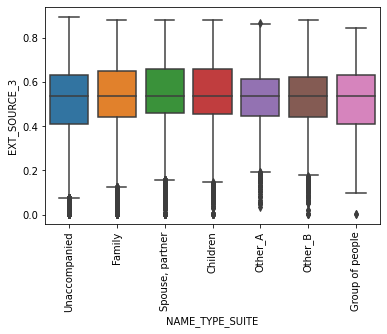

NAME_TYPE_SUITE DAYS_LAST_PHONE_CHANGE


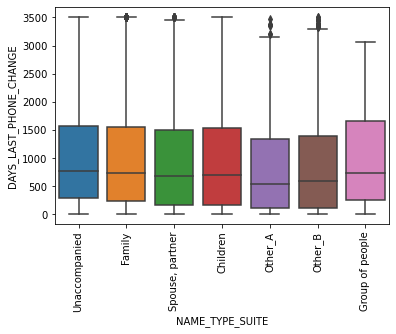

NAME_INCOME_TYPE CNT_CHILDREN


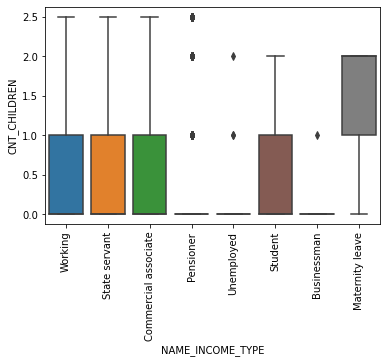

NAME_INCOME_TYPE AMT_INCOME_TOTAL


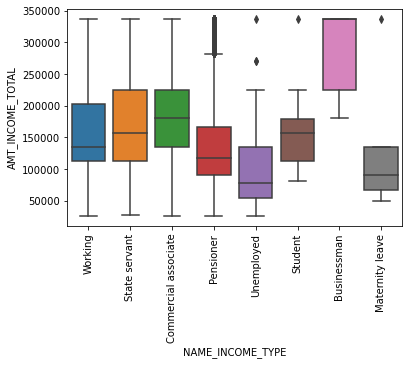

NAME_INCOME_TYPE AMT_CREDIT


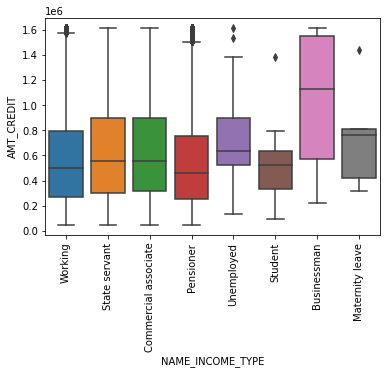

NAME_INCOME_TYPE AMT_ANNUITY


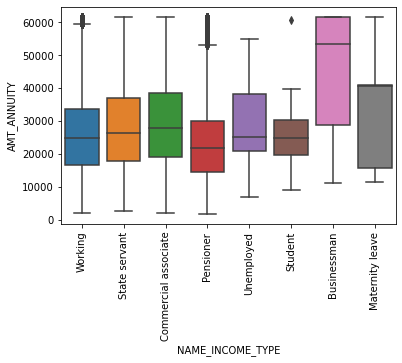

NAME_INCOME_TYPE AMT_GOODS_PRICE


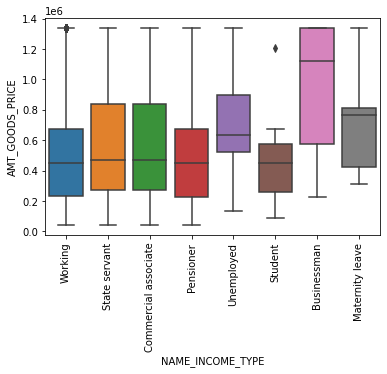

NAME_INCOME_TYPE REGION_POPULATION_RELATIVE


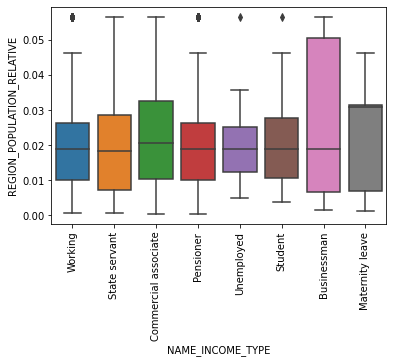

NAME_INCOME_TYPE AGE_BIRTH


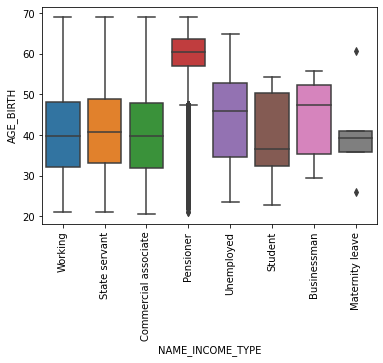

NAME_INCOME_TYPE DAYS_BIRTH


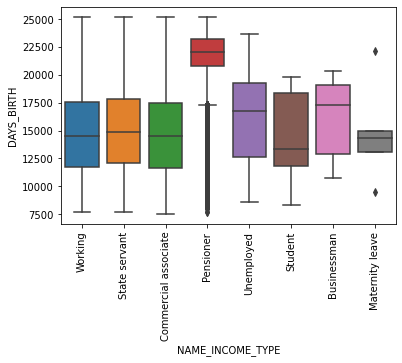

NAME_INCOME_TYPE DAYS_EMPLOYED


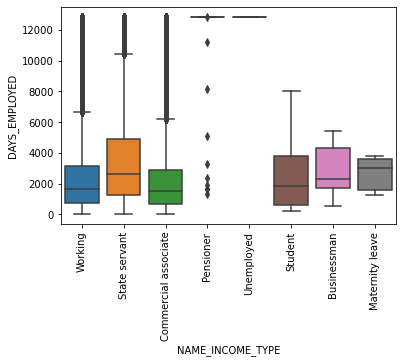

NAME_INCOME_TYPE DAYS_REGISTRATION


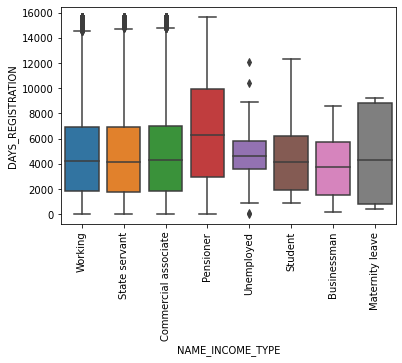

NAME_INCOME_TYPE DAYS_ID_PUBLISH


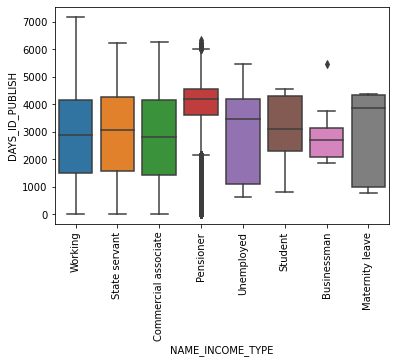

NAME_INCOME_TYPE CNT_FAM_MEMBERS


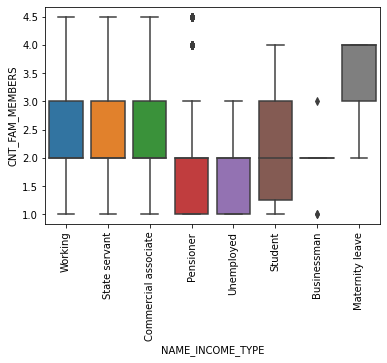

NAME_INCOME_TYPE EXT_SOURCE_2


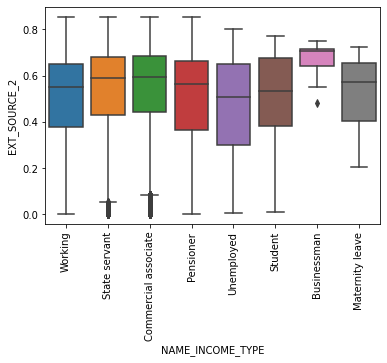

NAME_INCOME_TYPE EXT_SOURCE_3


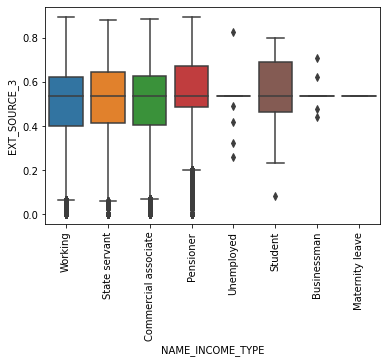

NAME_INCOME_TYPE DAYS_LAST_PHONE_CHANGE


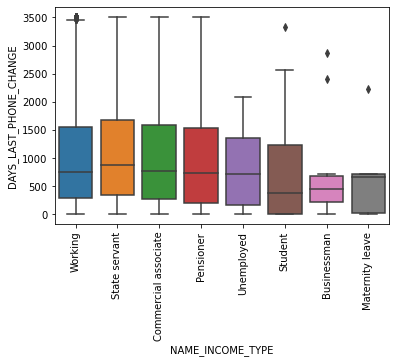

NAME_EDUCATION_TYPE CNT_CHILDREN


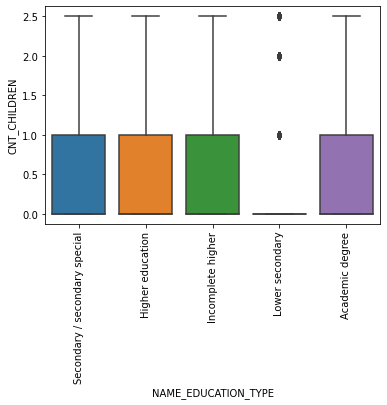

NAME_EDUCATION_TYPE AMT_INCOME_TOTAL


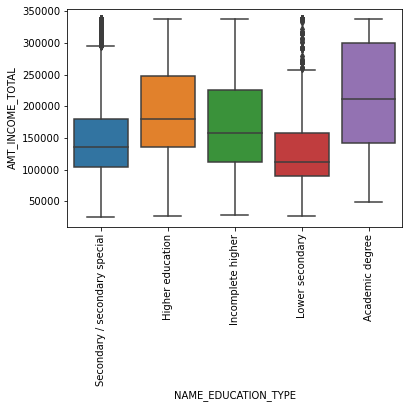

NAME_EDUCATION_TYPE AMT_CREDIT


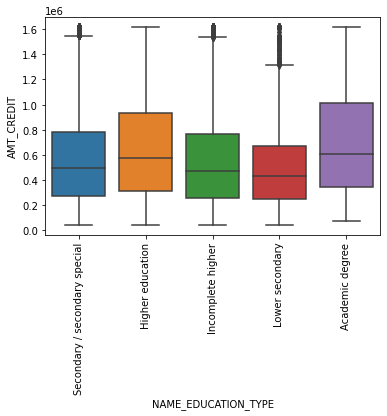

NAME_EDUCATION_TYPE AMT_ANNUITY


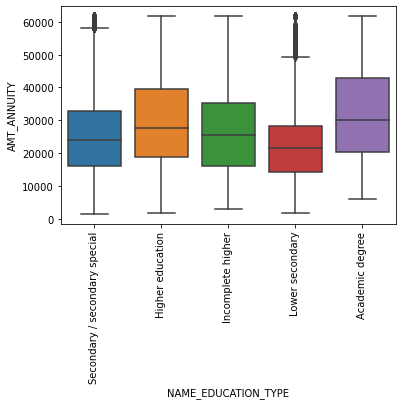

NAME_EDUCATION_TYPE AMT_GOODS_PRICE


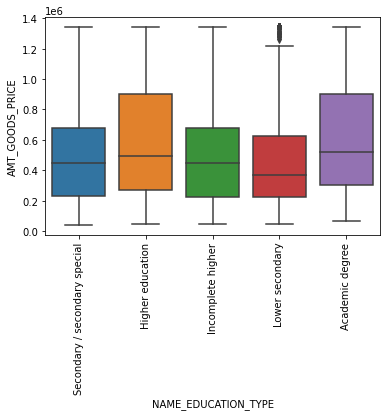

NAME_EDUCATION_TYPE REGION_POPULATION_RELATIVE


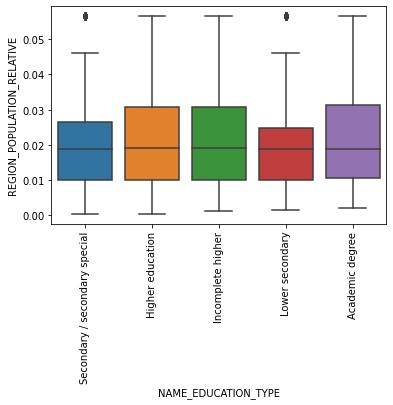

NAME_EDUCATION_TYPE AGE_BIRTH


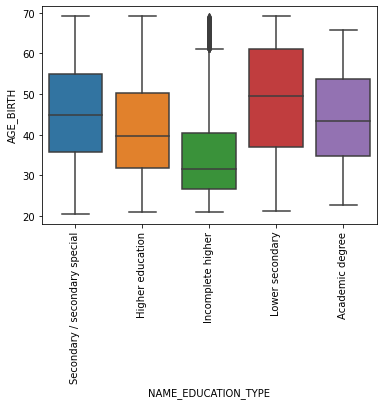

NAME_EDUCATION_TYPE DAYS_BIRTH


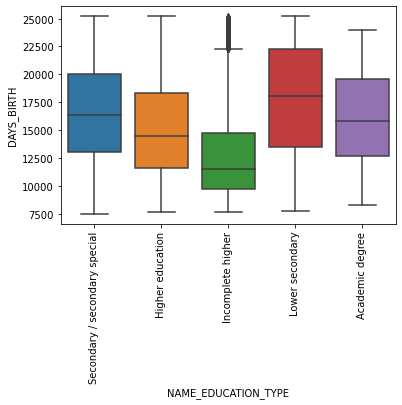

NAME_EDUCATION_TYPE DAYS_EMPLOYED


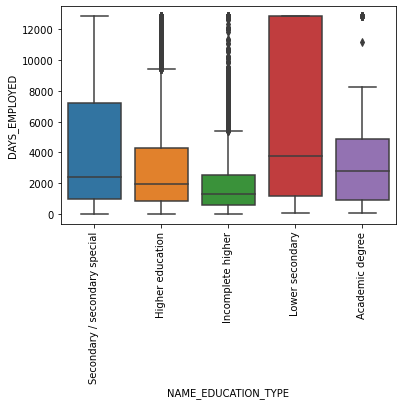

NAME_EDUCATION_TYPE DAYS_REGISTRATION


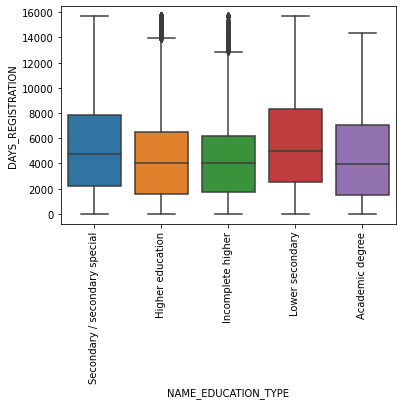

NAME_EDUCATION_TYPE DAYS_ID_PUBLISH


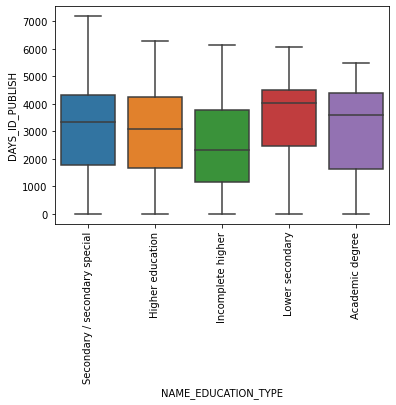

NAME_EDUCATION_TYPE CNT_FAM_MEMBERS


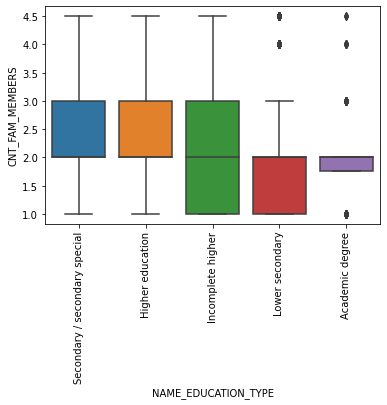

NAME_EDUCATION_TYPE EXT_SOURCE_2


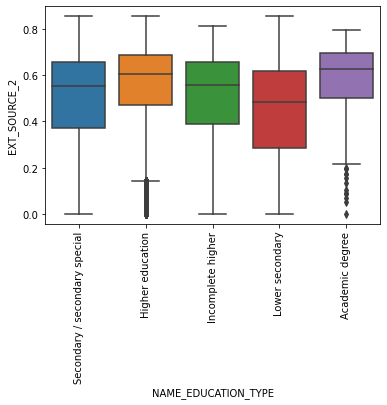

NAME_EDUCATION_TYPE EXT_SOURCE_3


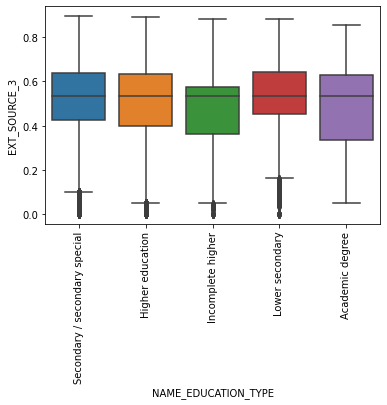

NAME_EDUCATION_TYPE DAYS_LAST_PHONE_CHANGE


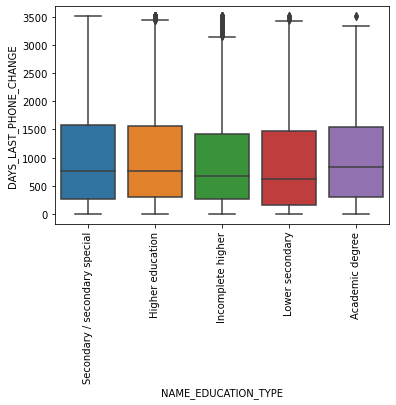

NAME_FAMILY_STATUS CNT_CHILDREN


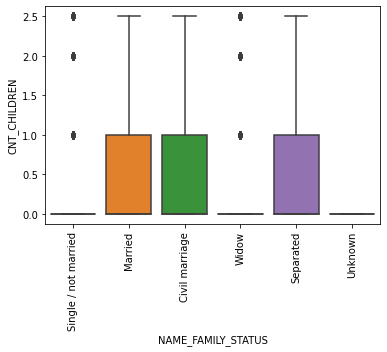

NAME_FAMILY_STATUS AMT_INCOME_TOTAL


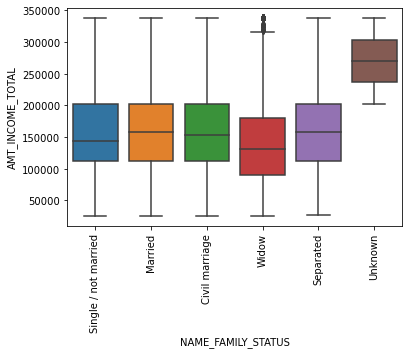

NAME_FAMILY_STATUS AMT_CREDIT


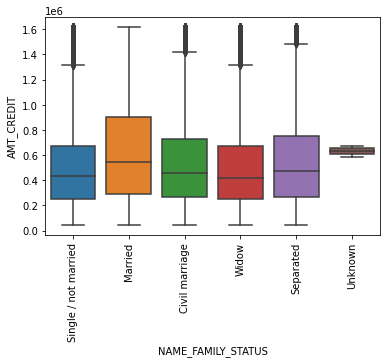

NAME_FAMILY_STATUS AMT_ANNUITY


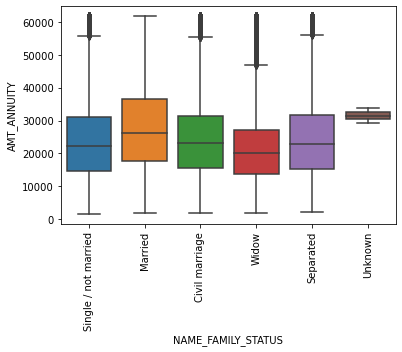

NAME_FAMILY_STATUS AMT_GOODS_PRICE


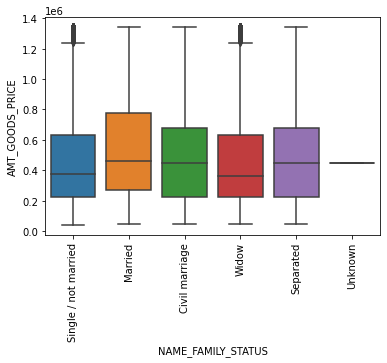

NAME_FAMILY_STATUS REGION_POPULATION_RELATIVE


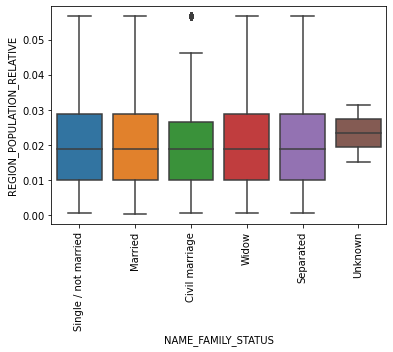

NAME_FAMILY_STATUS AGE_BIRTH


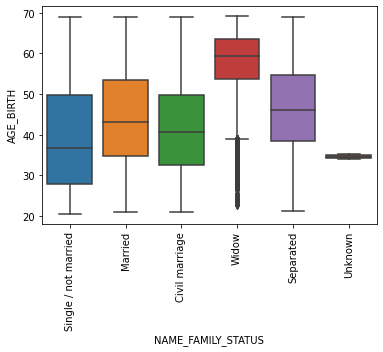

NAME_FAMILY_STATUS DAYS_BIRTH


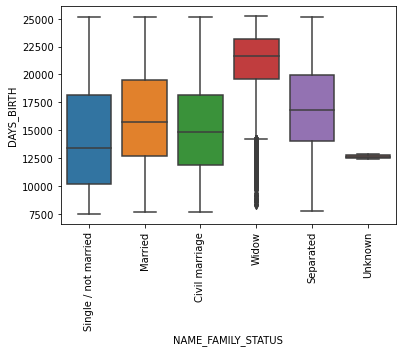

NAME_FAMILY_STATUS DAYS_EMPLOYED


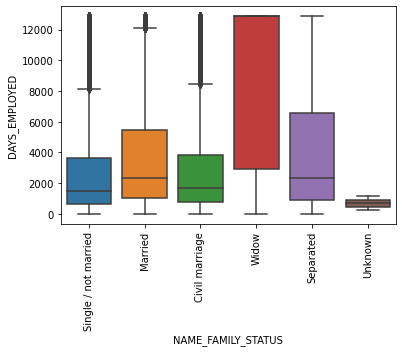

NAME_FAMILY_STATUS DAYS_REGISTRATION


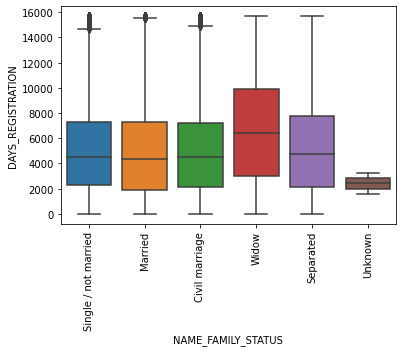

NAME_FAMILY_STATUS DAYS_ID_PUBLISH


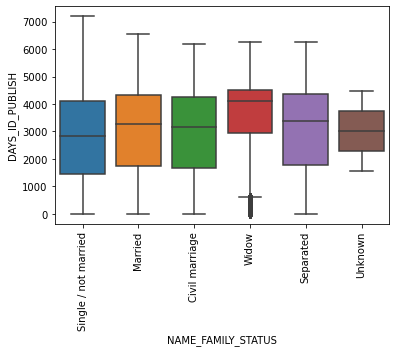

NAME_FAMILY_STATUS CNT_FAM_MEMBERS


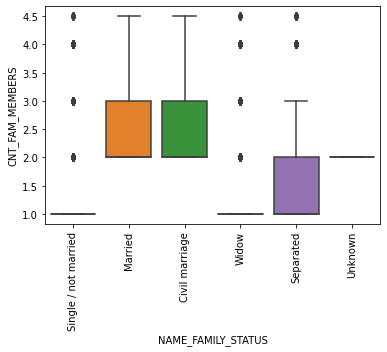

NAME_FAMILY_STATUS EXT_SOURCE_2


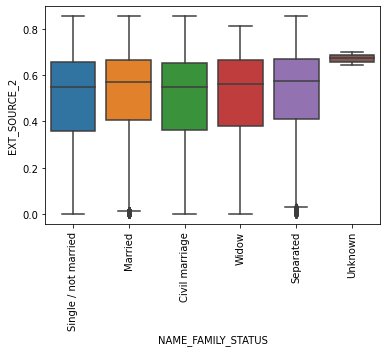

NAME_FAMILY_STATUS EXT_SOURCE_3


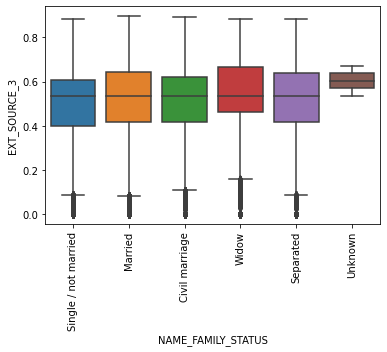

NAME_FAMILY_STATUS DAYS_LAST_PHONE_CHANGE


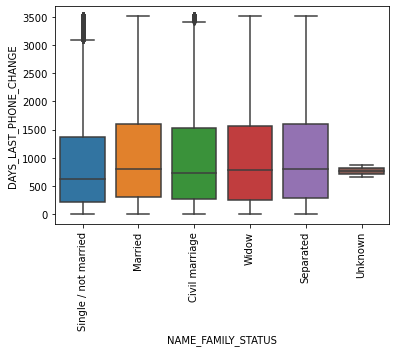

NAME_HOUSING_TYPE CNT_CHILDREN


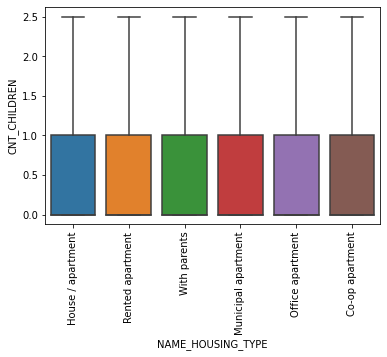

NAME_HOUSING_TYPE AMT_INCOME_TOTAL


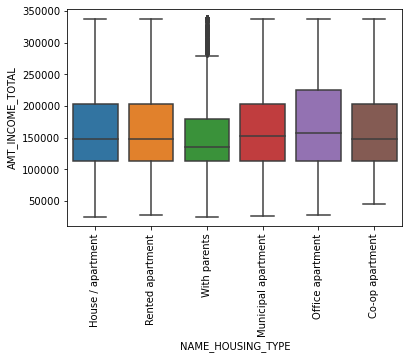

NAME_HOUSING_TYPE AMT_CREDIT


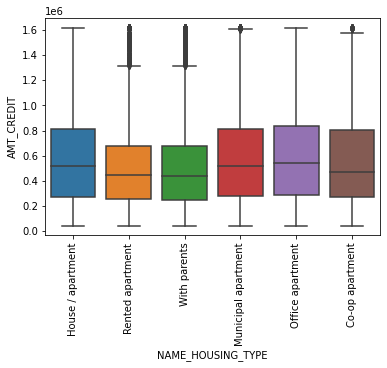

NAME_HOUSING_TYPE AMT_ANNUITY


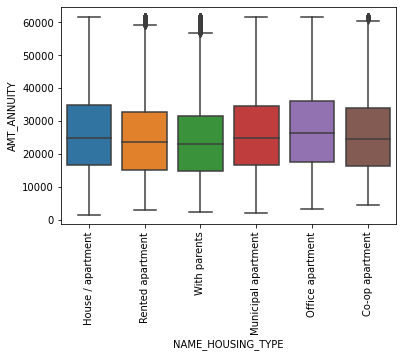

NAME_HOUSING_TYPE AMT_GOODS_PRICE


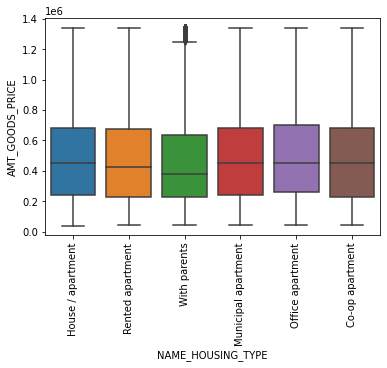

NAME_HOUSING_TYPE REGION_POPULATION_RELATIVE


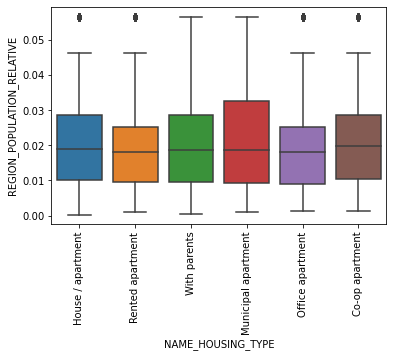

NAME_HOUSING_TYPE AGE_BIRTH


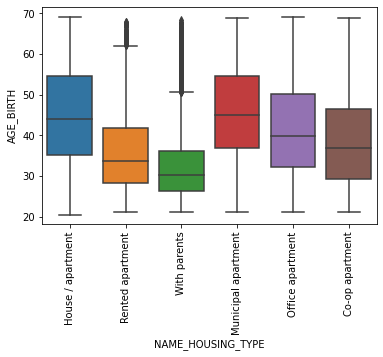

NAME_HOUSING_TYPE DAYS_BIRTH


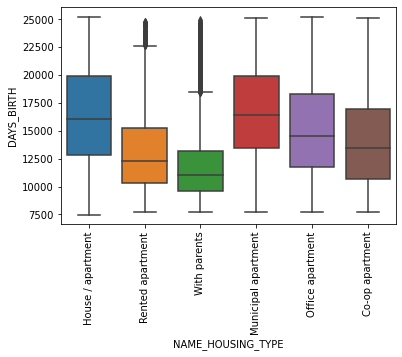

NAME_HOUSING_TYPE DAYS_EMPLOYED


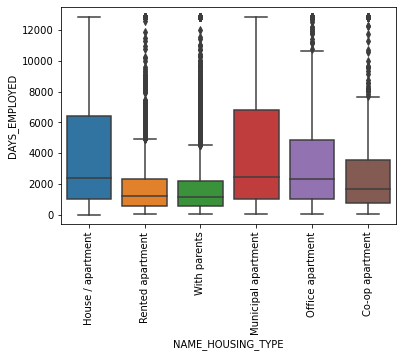

NAME_HOUSING_TYPE DAYS_REGISTRATION


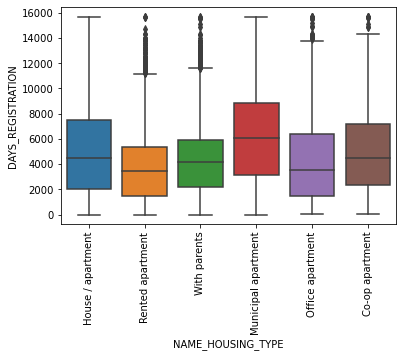

NAME_HOUSING_TYPE DAYS_ID_PUBLISH


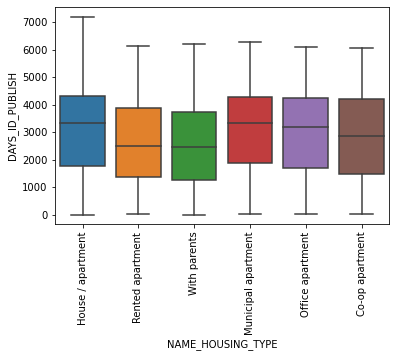

NAME_HOUSING_TYPE CNT_FAM_MEMBERS


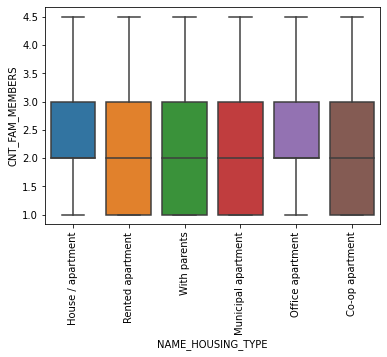

NAME_HOUSING_TYPE EXT_SOURCE_2


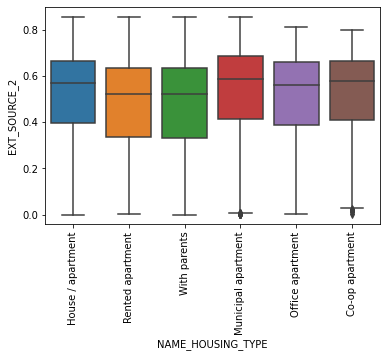

NAME_HOUSING_TYPE EXT_SOURCE_3


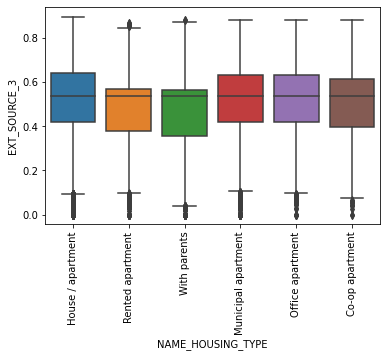

NAME_HOUSING_TYPE DAYS_LAST_PHONE_CHANGE


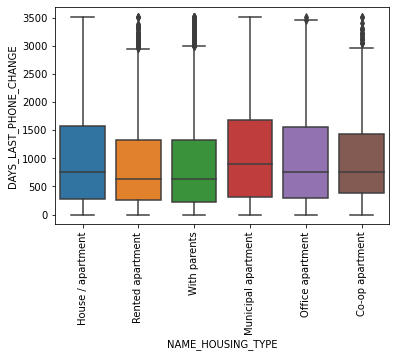

FLAG_MOBIL CNT_CHILDREN


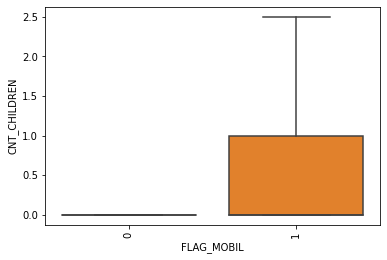

FLAG_MOBIL AMT_INCOME_TOTAL


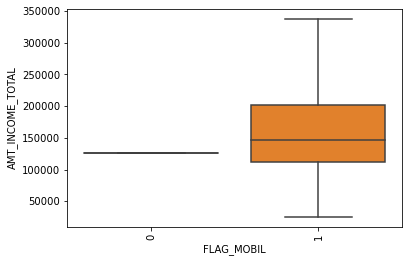

FLAG_MOBIL AMT_CREDIT


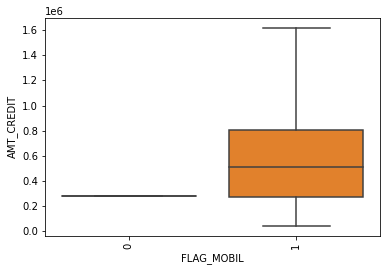

FLAG_MOBIL AMT_ANNUITY


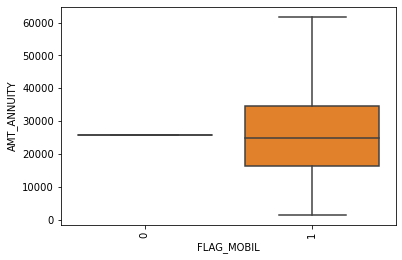

FLAG_MOBIL AMT_GOODS_PRICE


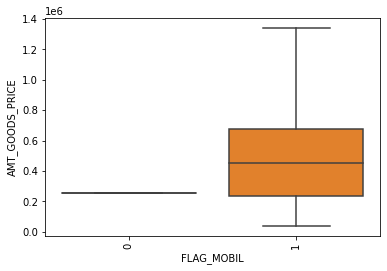

FLAG_MOBIL REGION_POPULATION_RELATIVE


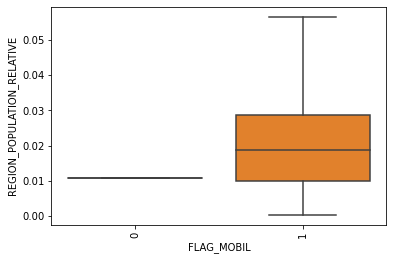

FLAG_MOBIL AGE_BIRTH


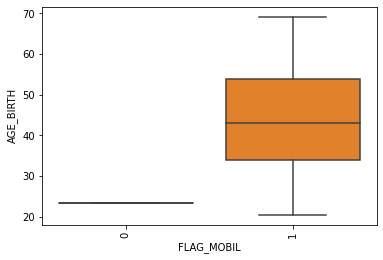

FLAG_MOBIL DAYS_BIRTH


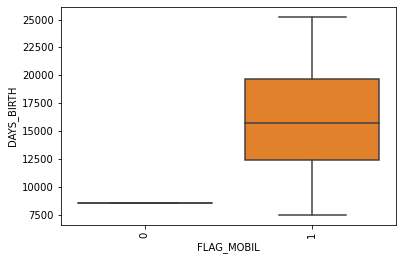

FLAG_MOBIL DAYS_EMPLOYED


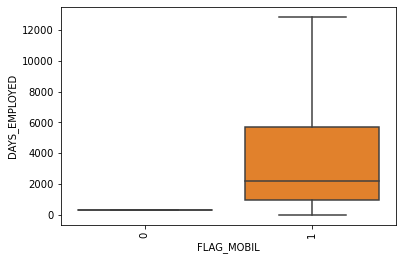

FLAG_MOBIL DAYS_REGISTRATION


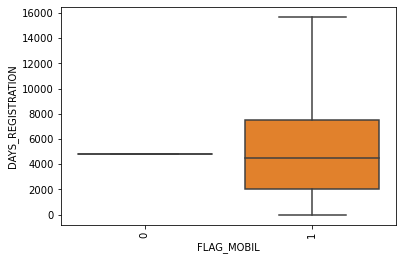

FLAG_MOBIL DAYS_ID_PUBLISH


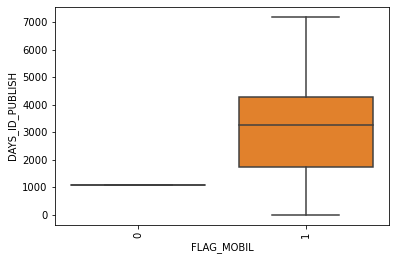

FLAG_MOBIL CNT_FAM_MEMBERS


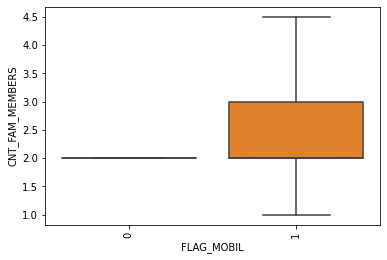

FLAG_MOBIL EXT_SOURCE_2


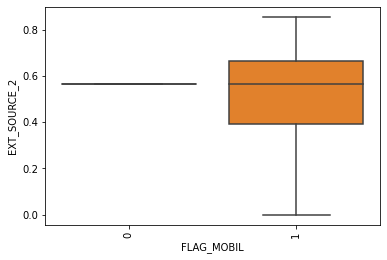

FLAG_MOBIL EXT_SOURCE_3


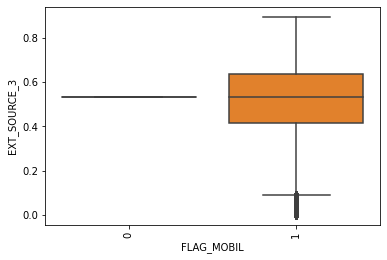

FLAG_MOBIL DAYS_LAST_PHONE_CHANGE


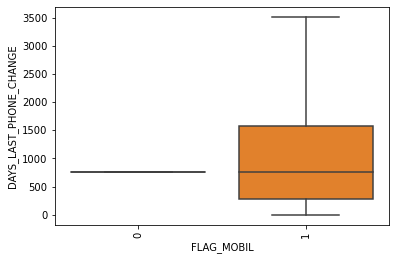

FLAG_EMP_PHONE CNT_CHILDREN


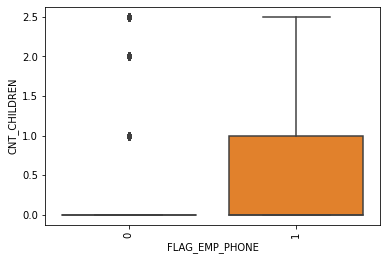

FLAG_EMP_PHONE AMT_INCOME_TOTAL


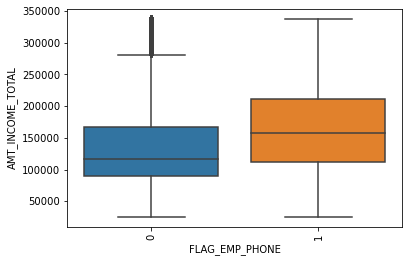

FLAG_EMP_PHONE AMT_CREDIT


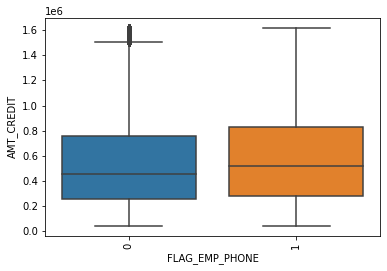

FLAG_EMP_PHONE AMT_ANNUITY


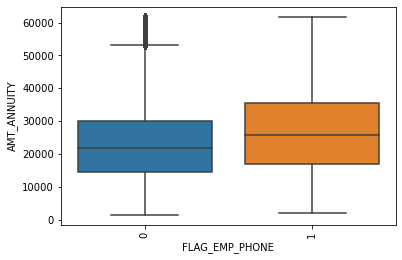

FLAG_EMP_PHONE AMT_GOODS_PRICE


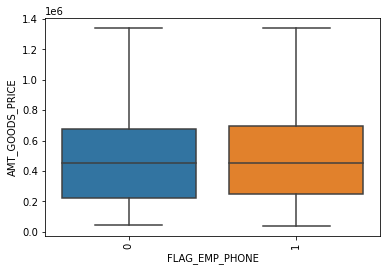

FLAG_EMP_PHONE REGION_POPULATION_RELATIVE


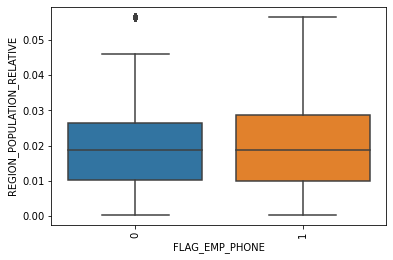

FLAG_EMP_PHONE AGE_BIRTH


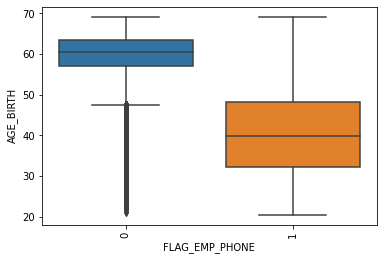

FLAG_EMP_PHONE DAYS_BIRTH


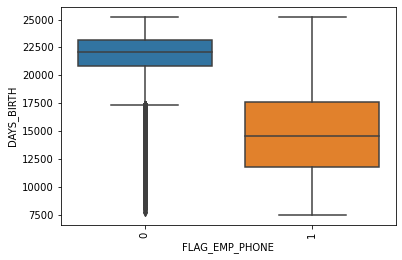

FLAG_EMP_PHONE DAYS_EMPLOYED


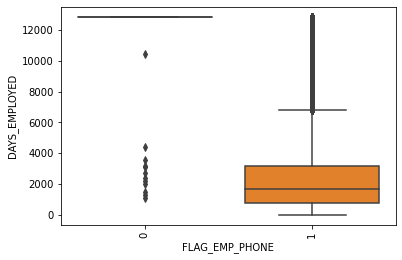

FLAG_EMP_PHONE DAYS_REGISTRATION


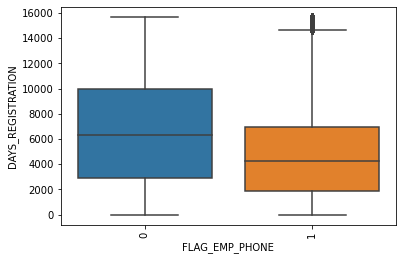

FLAG_EMP_PHONE DAYS_ID_PUBLISH


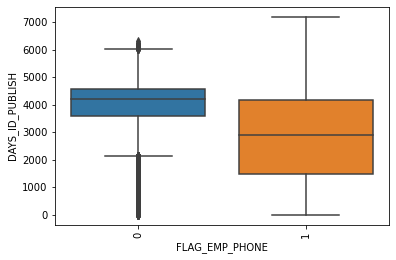

FLAG_EMP_PHONE CNT_FAM_MEMBERS


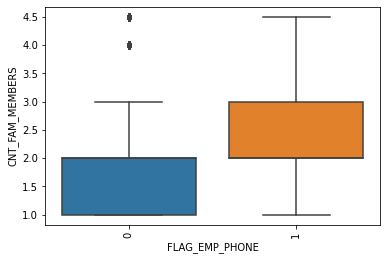

FLAG_EMP_PHONE EXT_SOURCE_2


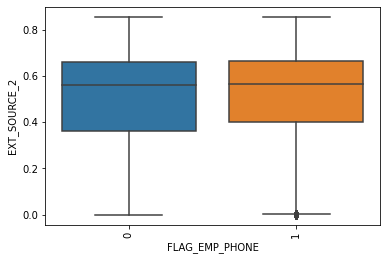

FLAG_EMP_PHONE EXT_SOURCE_3


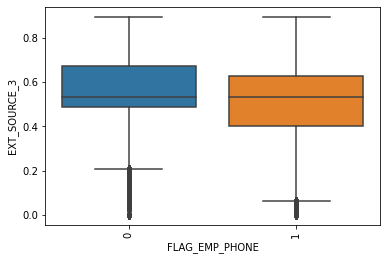

FLAG_EMP_PHONE DAYS_LAST_PHONE_CHANGE


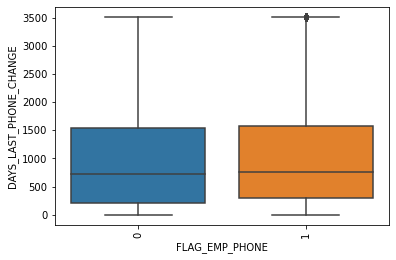

FLAG_WORK_PHONE CNT_CHILDREN


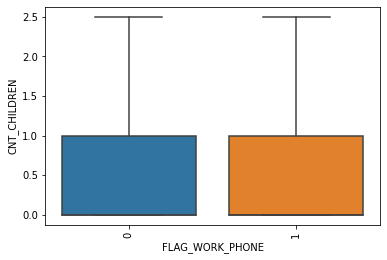

FLAG_WORK_PHONE AMT_INCOME_TOTAL


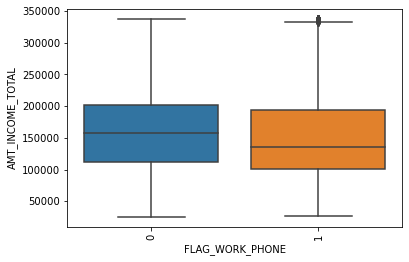

FLAG_WORK_PHONE AMT_CREDIT


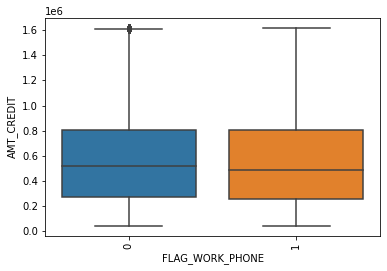

FLAG_WORK_PHONE AMT_ANNUITY


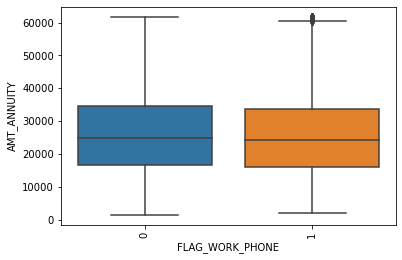

FLAG_WORK_PHONE AMT_GOODS_PRICE


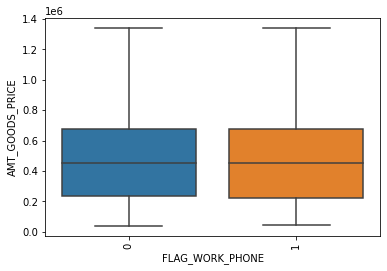

FLAG_WORK_PHONE REGION_POPULATION_RELATIVE


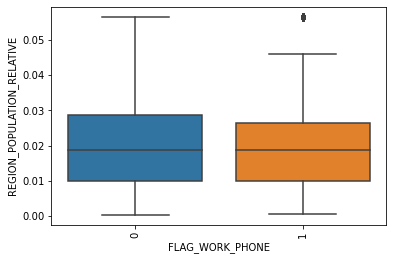

FLAG_WORK_PHONE AGE_BIRTH


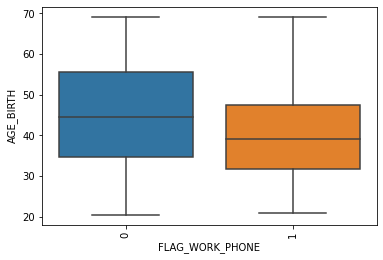

FLAG_WORK_PHONE DAYS_BIRTH


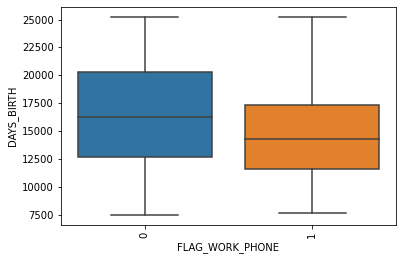

FLAG_WORK_PHONE DAYS_EMPLOYED


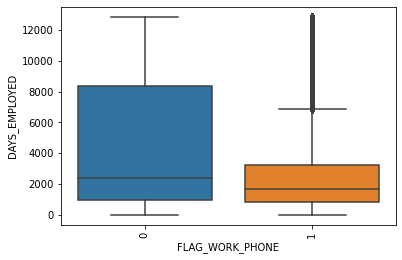

FLAG_WORK_PHONE DAYS_REGISTRATION


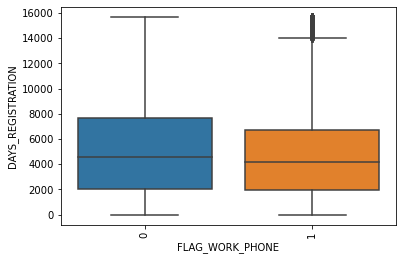

FLAG_WORK_PHONE DAYS_ID_PUBLISH


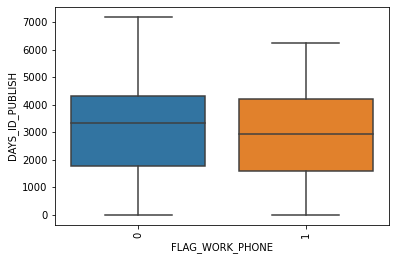

FLAG_WORK_PHONE CNT_FAM_MEMBERS


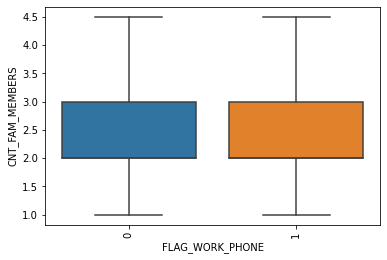

FLAG_WORK_PHONE EXT_SOURCE_2


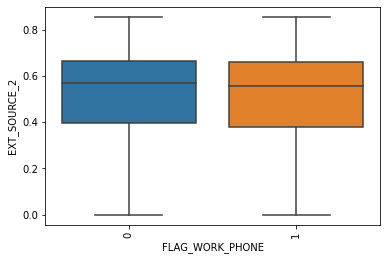

FLAG_WORK_PHONE EXT_SOURCE_3


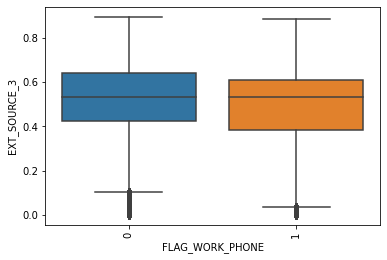

FLAG_WORK_PHONE DAYS_LAST_PHONE_CHANGE


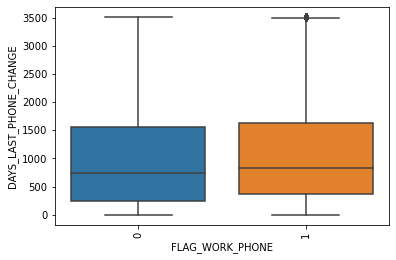

FLAG_CONT_MOBILE CNT_CHILDREN


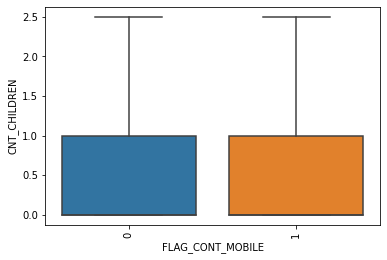

FLAG_CONT_MOBILE AMT_INCOME_TOTAL


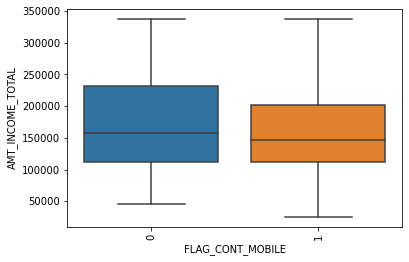

FLAG_CONT_MOBILE AMT_CREDIT


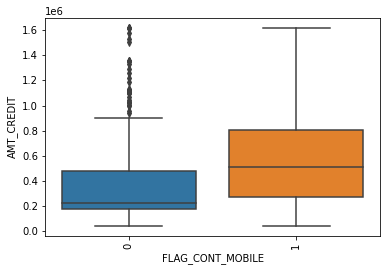

FLAG_CONT_MOBILE AMT_ANNUITY


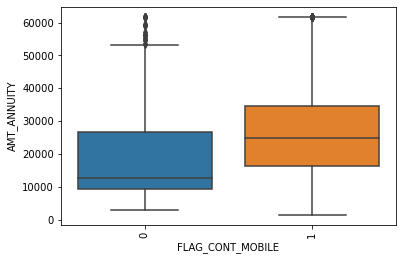

FLAG_CONT_MOBILE AMT_GOODS_PRICE


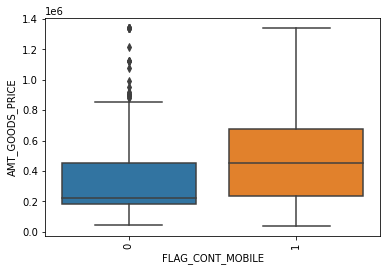

FLAG_CONT_MOBILE REGION_POPULATION_RELATIVE


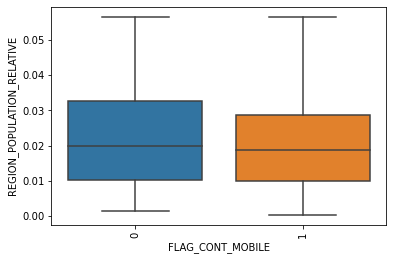

FLAG_CONT_MOBILE AGE_BIRTH


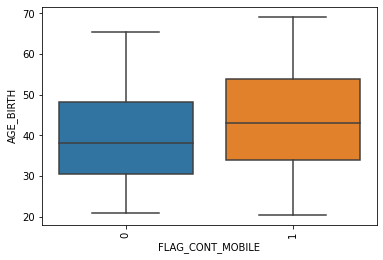

FLAG_CONT_MOBILE DAYS_BIRTH


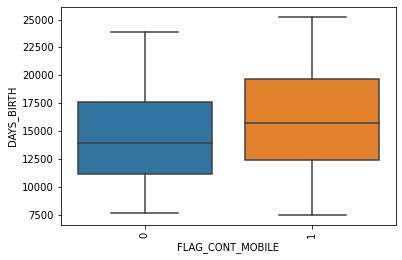

FLAG_CONT_MOBILE DAYS_EMPLOYED


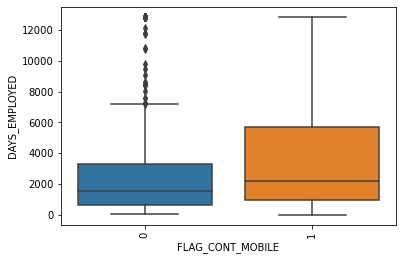

FLAG_CONT_MOBILE DAYS_REGISTRATION


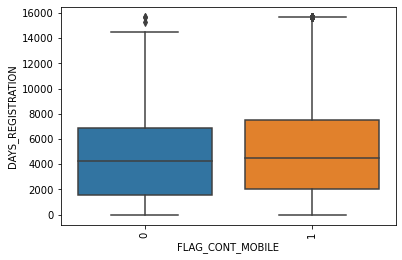

FLAG_CONT_MOBILE DAYS_ID_PUBLISH


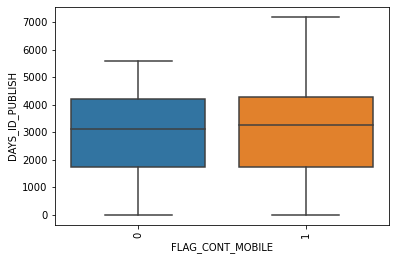

FLAG_CONT_MOBILE CNT_FAM_MEMBERS


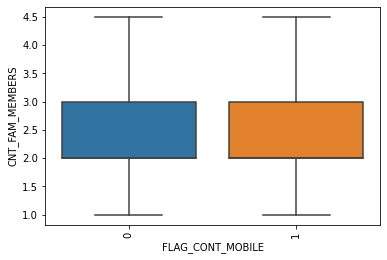

FLAG_CONT_MOBILE EXT_SOURCE_2


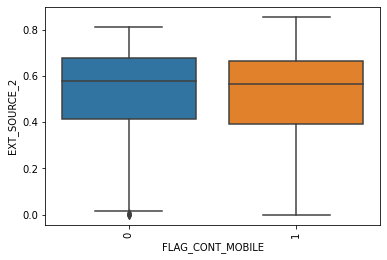

FLAG_CONT_MOBILE EXT_SOURCE_3


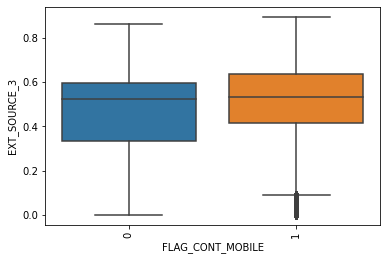

FLAG_CONT_MOBILE DAYS_LAST_PHONE_CHANGE


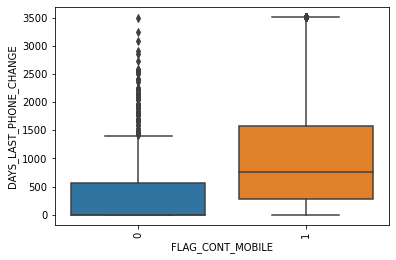

FLAG_PHONE CNT_CHILDREN


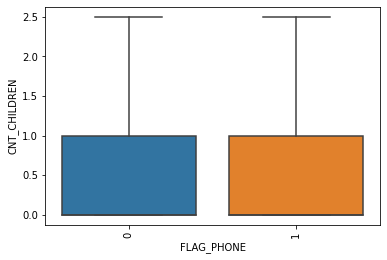

FLAG_PHONE AMT_INCOME_TOTAL


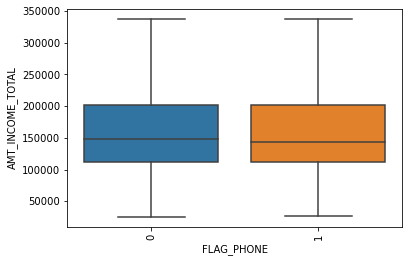

FLAG_PHONE AMT_CREDIT


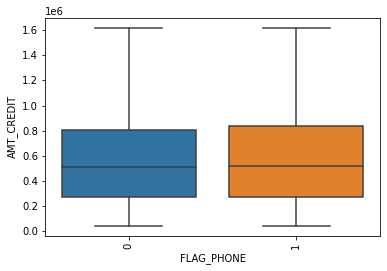

FLAG_PHONE AMT_ANNUITY


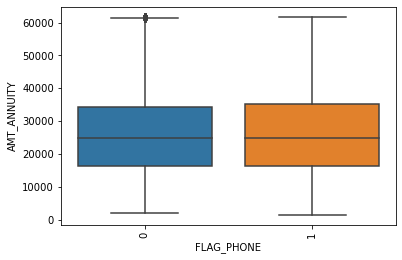

FLAG_PHONE AMT_GOODS_PRICE


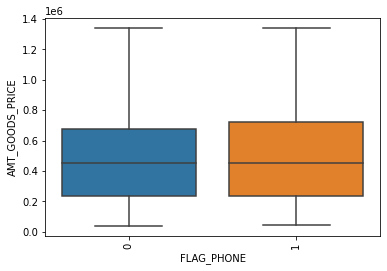

FLAG_PHONE REGION_POPULATION_RELATIVE


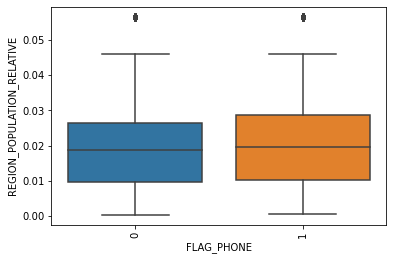

FLAG_PHONE AGE_BIRTH


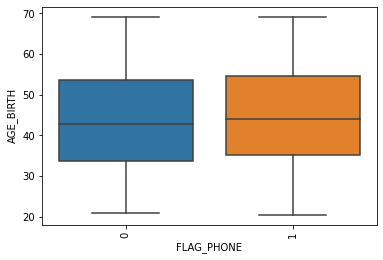

FLAG_PHONE DAYS_BIRTH


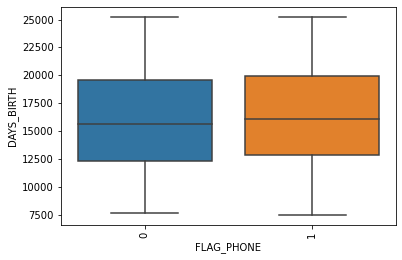

FLAG_PHONE DAYS_EMPLOYED


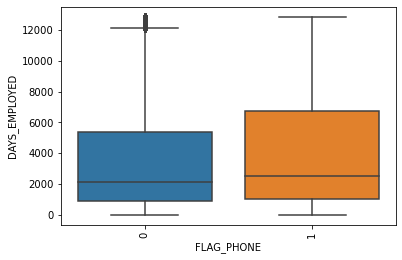

FLAG_PHONE DAYS_REGISTRATION


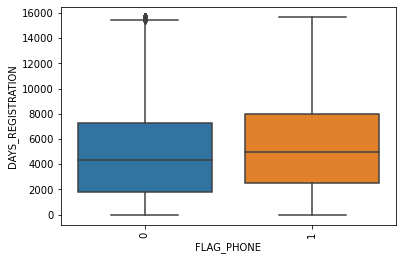

FLAG_PHONE DAYS_ID_PUBLISH


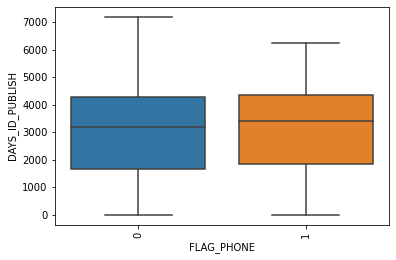

FLAG_PHONE CNT_FAM_MEMBERS


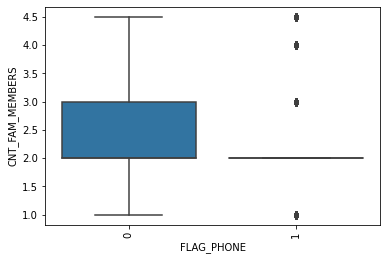

FLAG_PHONE EXT_SOURCE_2


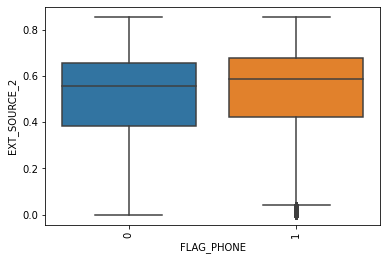

FLAG_PHONE EXT_SOURCE_3


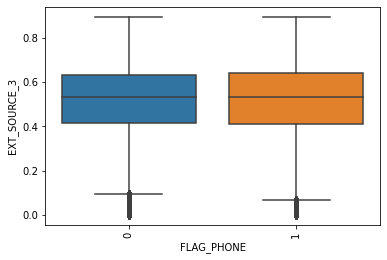

FLAG_PHONE DAYS_LAST_PHONE_CHANGE


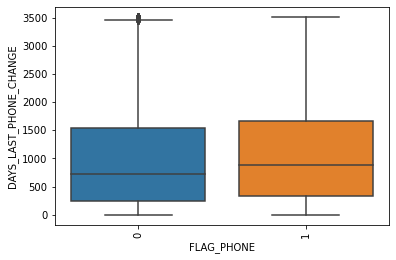

FLAG_EMAIL CNT_CHILDREN


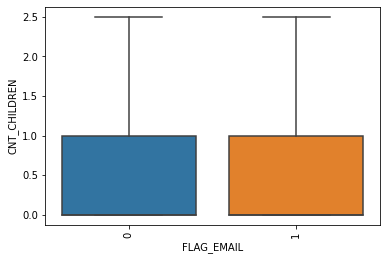

FLAG_EMAIL AMT_INCOME_TOTAL


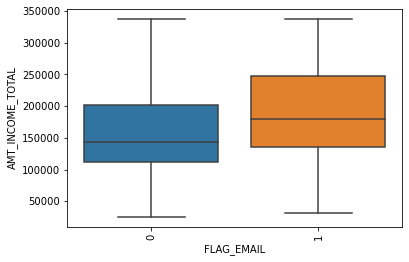

FLAG_EMAIL AMT_CREDIT


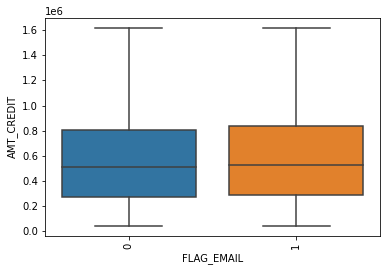

FLAG_EMAIL AMT_ANNUITY


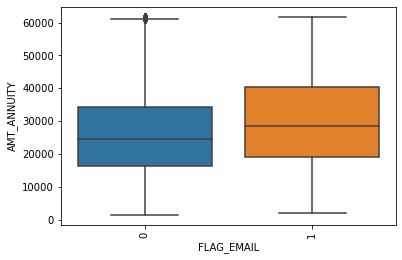

FLAG_EMAIL AMT_GOODS_PRICE


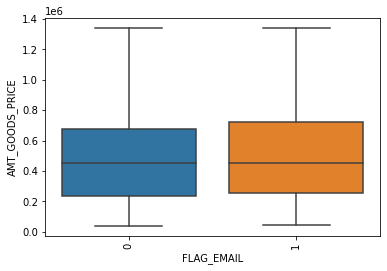

FLAG_EMAIL REGION_POPULATION_RELATIVE


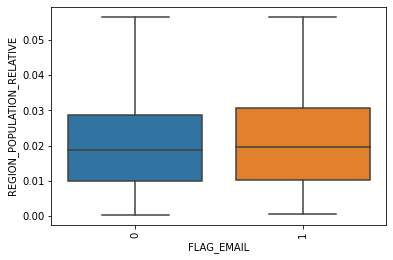

FLAG_EMAIL AGE_BIRTH


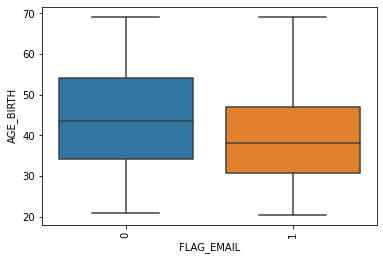

FLAG_EMAIL DAYS_BIRTH


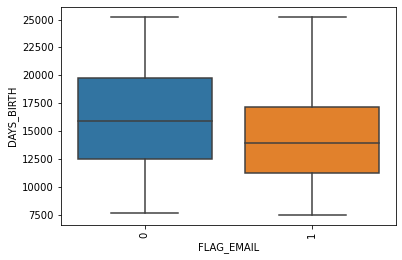

FLAG_EMAIL DAYS_EMPLOYED


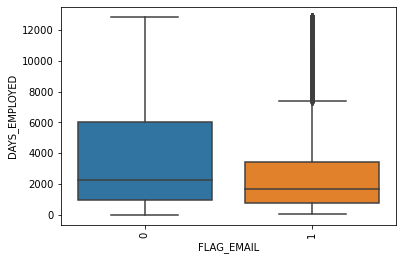

FLAG_EMAIL DAYS_REGISTRATION


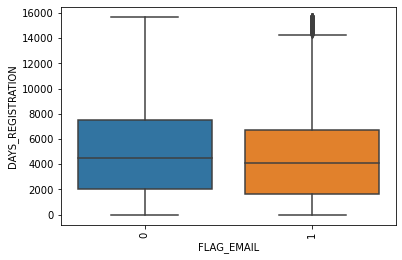

FLAG_EMAIL DAYS_ID_PUBLISH


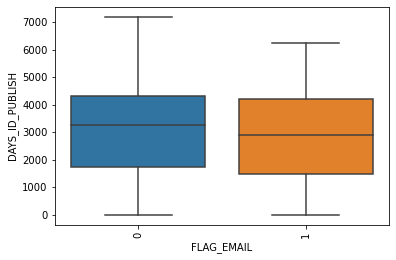

FLAG_EMAIL CNT_FAM_MEMBERS


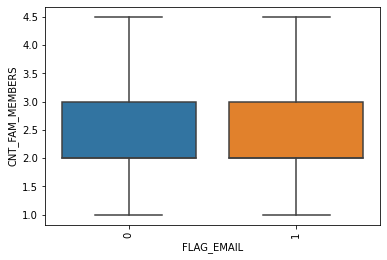

FLAG_EMAIL EXT_SOURCE_2


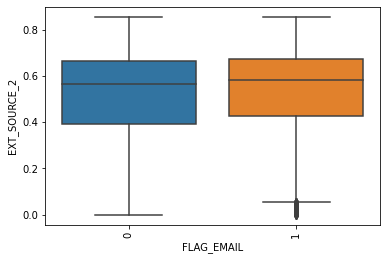

FLAG_EMAIL EXT_SOURCE_3


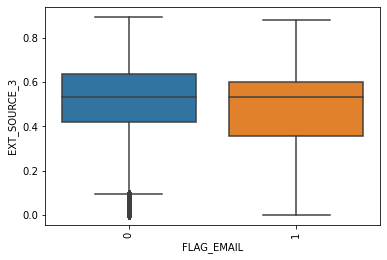

FLAG_EMAIL DAYS_LAST_PHONE_CHANGE


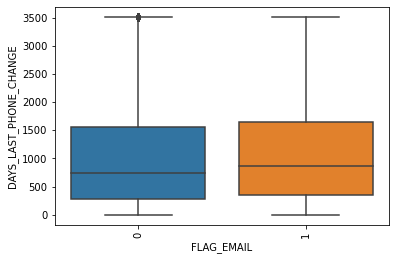

OCCUPATION_TYPE CNT_CHILDREN


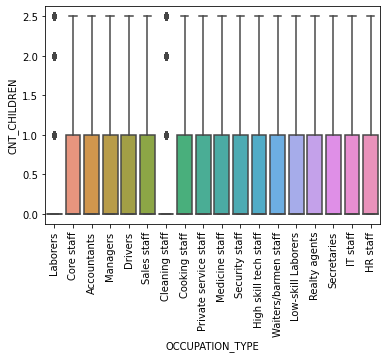

OCCUPATION_TYPE AMT_INCOME_TOTAL


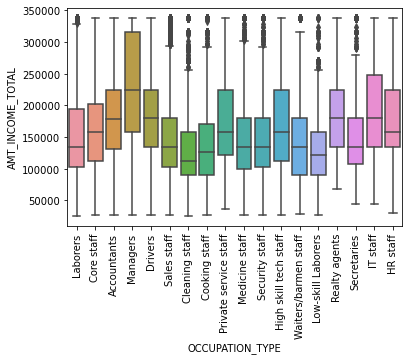

OCCUPATION_TYPE AMT_CREDIT


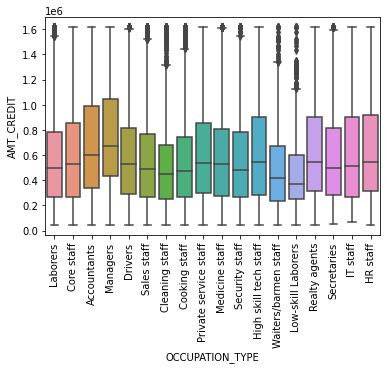

OCCUPATION_TYPE AMT_ANNUITY


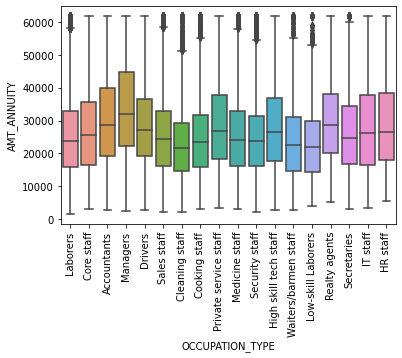

OCCUPATION_TYPE AMT_GOODS_PRICE


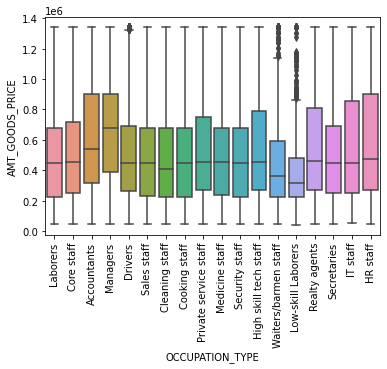

OCCUPATION_TYPE REGION_POPULATION_RELATIVE


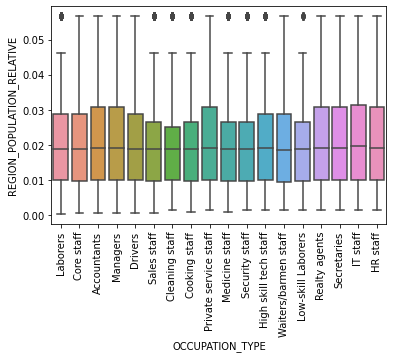

OCCUPATION_TYPE AGE_BIRTH


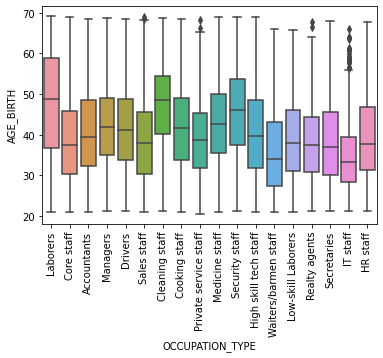

OCCUPATION_TYPE DAYS_BIRTH


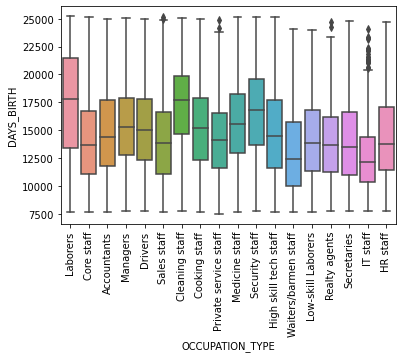

OCCUPATION_TYPE DAYS_EMPLOYED


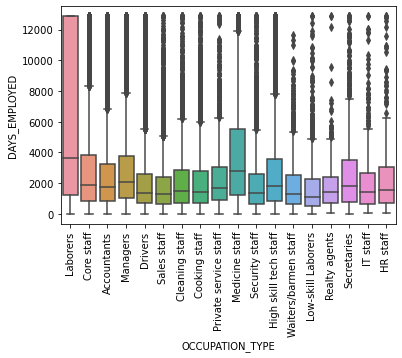

OCCUPATION_TYPE DAYS_REGISTRATION


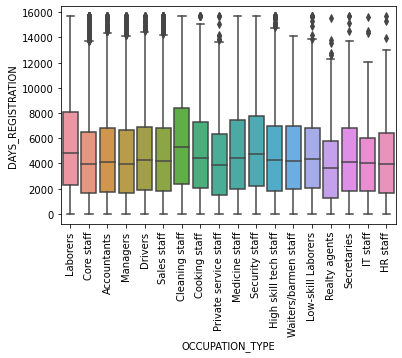

OCCUPATION_TYPE DAYS_ID_PUBLISH


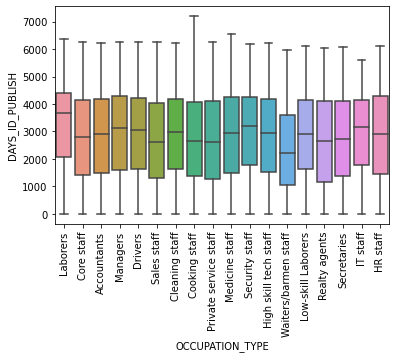

OCCUPATION_TYPE CNT_FAM_MEMBERS


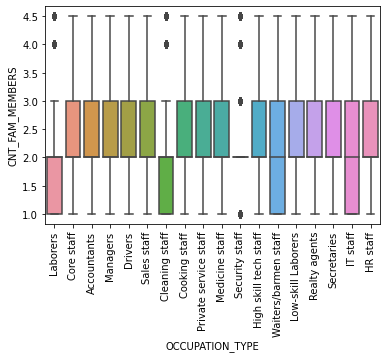

OCCUPATION_TYPE EXT_SOURCE_2


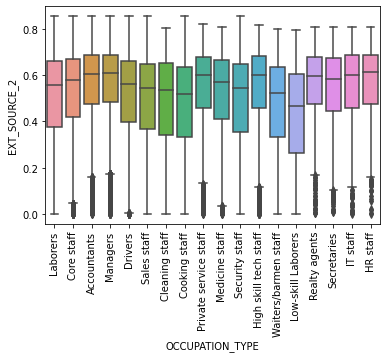

OCCUPATION_TYPE EXT_SOURCE_3


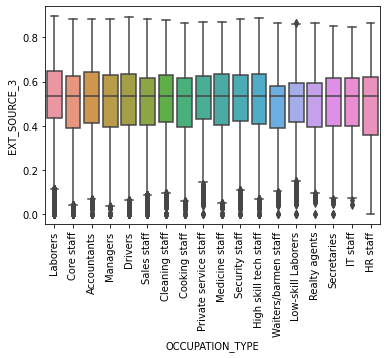

OCCUPATION_TYPE DAYS_LAST_PHONE_CHANGE


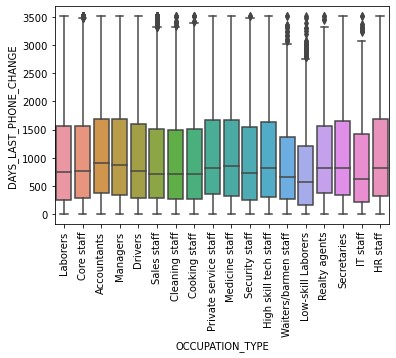

REGION_RATING_CLIENT CNT_CHILDREN


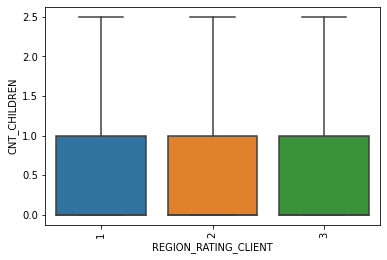

REGION_RATING_CLIENT AMT_INCOME_TOTAL


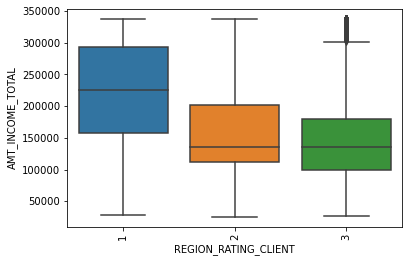

REGION_RATING_CLIENT AMT_CREDIT


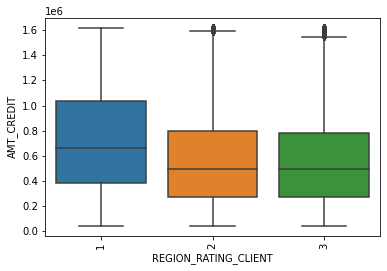

REGION_RATING_CLIENT AMT_ANNUITY


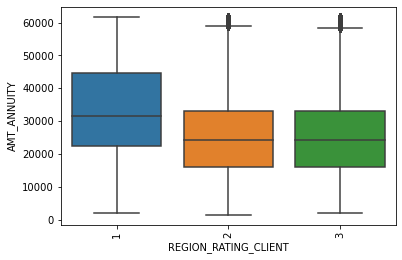

REGION_RATING_CLIENT AMT_GOODS_PRICE


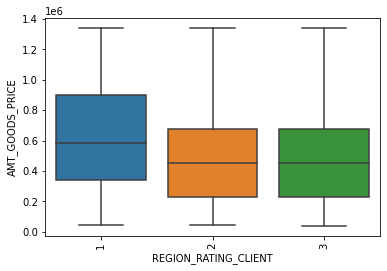

REGION_RATING_CLIENT REGION_POPULATION_RELATIVE


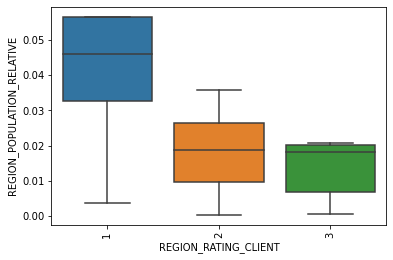

REGION_RATING_CLIENT AGE_BIRTH


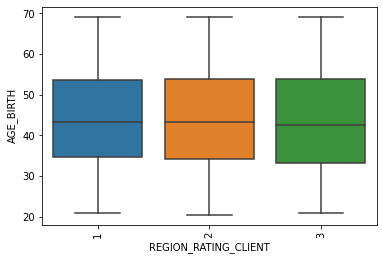

REGION_RATING_CLIENT DAYS_BIRTH


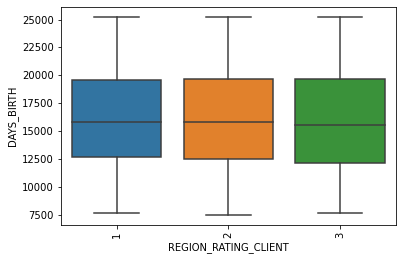

REGION_RATING_CLIENT DAYS_EMPLOYED


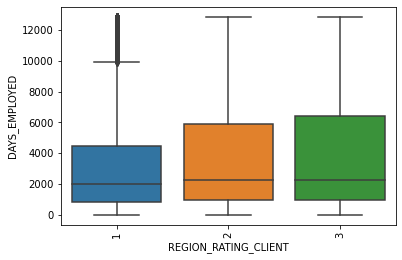

REGION_RATING_CLIENT DAYS_REGISTRATION


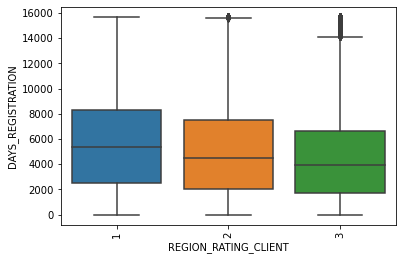

REGION_RATING_CLIENT DAYS_ID_PUBLISH


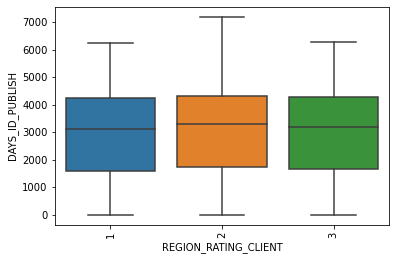

REGION_RATING_CLIENT CNT_FAM_MEMBERS


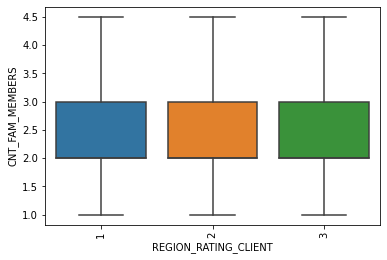

REGION_RATING_CLIENT EXT_SOURCE_2


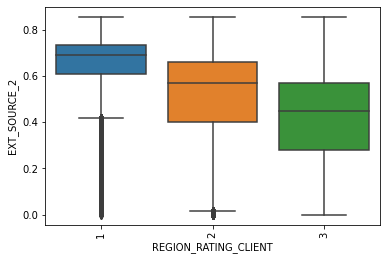

REGION_RATING_CLIENT EXT_SOURCE_3


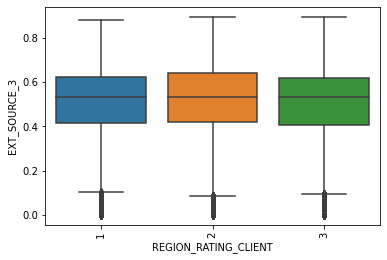

REGION_RATING_CLIENT DAYS_LAST_PHONE_CHANGE


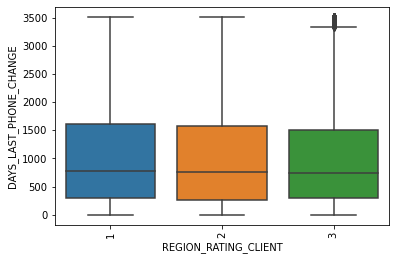

ORGANIZATION_TYPE CNT_CHILDREN


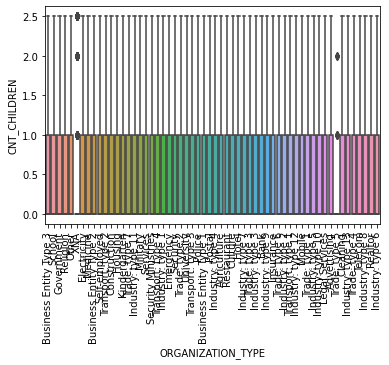

ORGANIZATION_TYPE AMT_INCOME_TOTAL


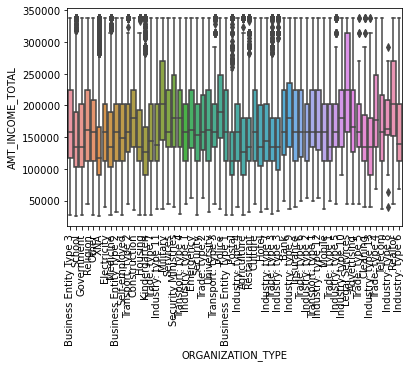

ORGANIZATION_TYPE AMT_CREDIT


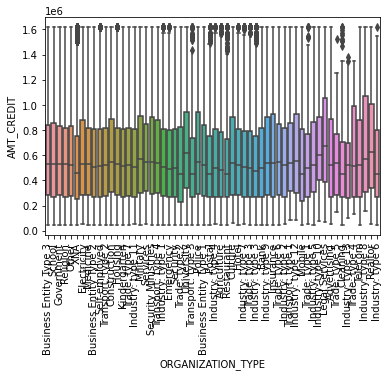

ORGANIZATION_TYPE AMT_ANNUITY


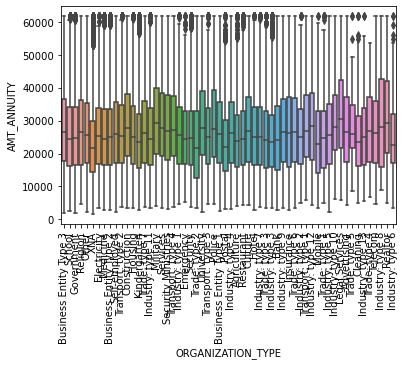

ORGANIZATION_TYPE AMT_GOODS_PRICE


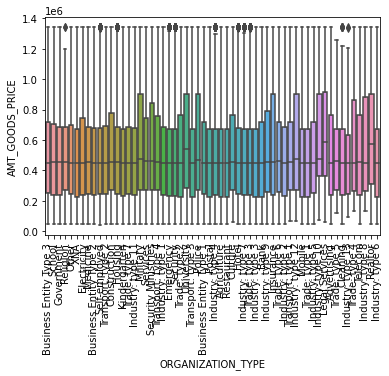

ORGANIZATION_TYPE REGION_POPULATION_RELATIVE


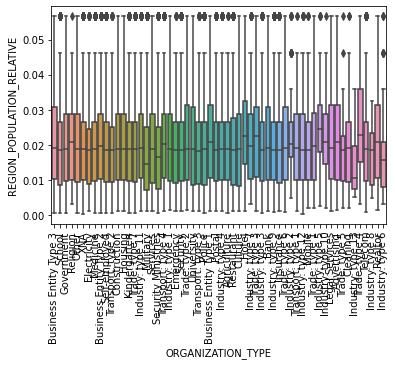

ORGANIZATION_TYPE AGE_BIRTH


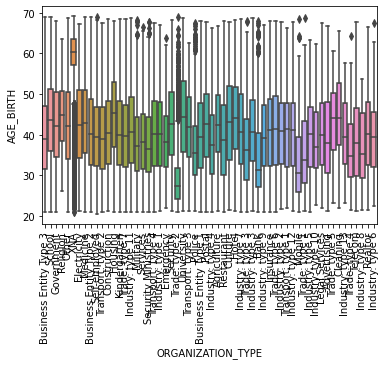

ORGANIZATION_TYPE DAYS_BIRTH


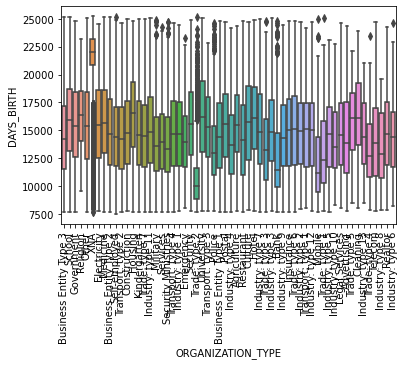

ORGANIZATION_TYPE DAYS_EMPLOYED


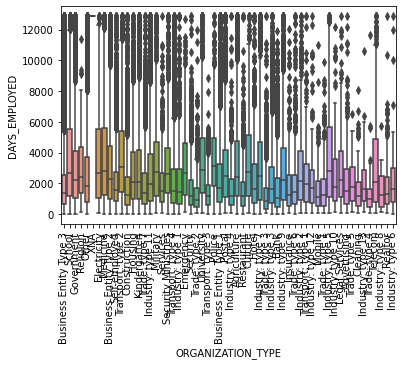

ORGANIZATION_TYPE DAYS_REGISTRATION


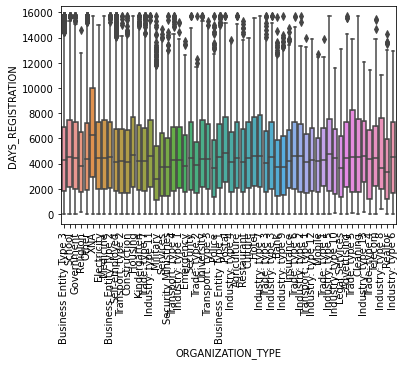

ORGANIZATION_TYPE DAYS_ID_PUBLISH


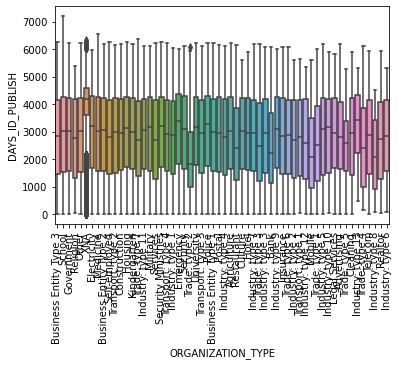

ORGANIZATION_TYPE CNT_FAM_MEMBERS


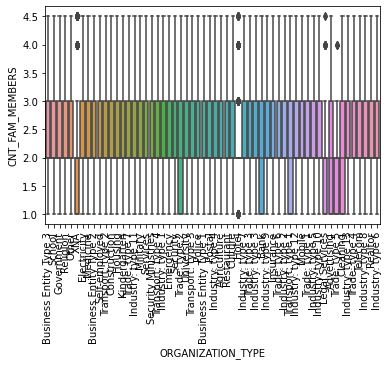

ORGANIZATION_TYPE EXT_SOURCE_2


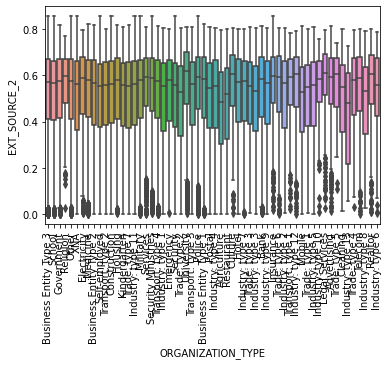

ORGANIZATION_TYPE EXT_SOURCE_3


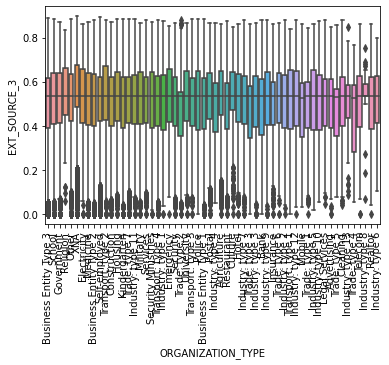

ORGANIZATION_TYPE DAYS_LAST_PHONE_CHANGE


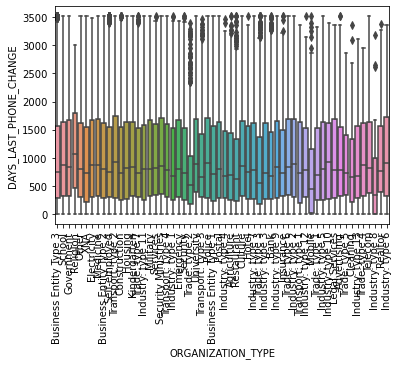

In [64]:
#####Bivariate Analysis for Continous Vs Categorical Data #########
for i in imp_cat_cols:
    for j in imp_cont_cols:
        print(i,j)
        plt.xticks(rotation=90)
        sns.boxplot(x=appd1[i],y=appd1[j])
        plt.show()

In [15]:
###Data Imbalance Analysis,to convert into percentage(*100)
appd1.TARGET.value_counts(normalize='TRUE') *100

0   91.927
1    8.073
Name: TARGET, dtype: float64

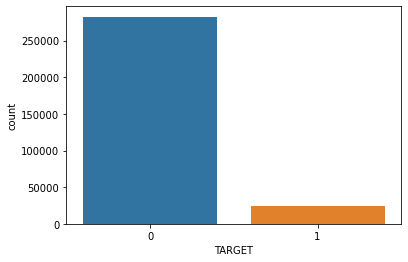

In [16]:
sns.countplot(appd1.TARGET)
plt.show()

TARGET


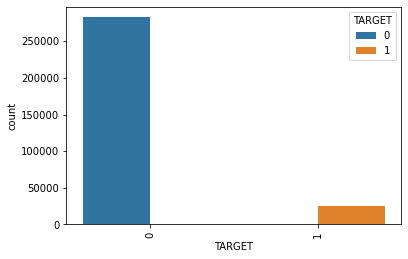

NAME_CONTRACT_TYPE


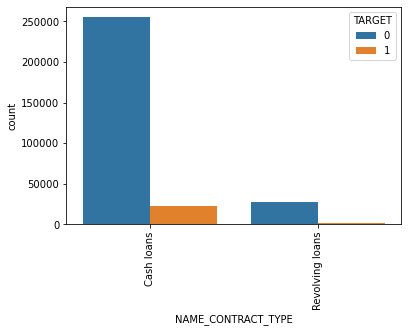

CODE_GENDER


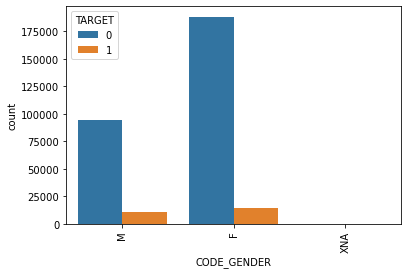

FLAG_OWN_CAR


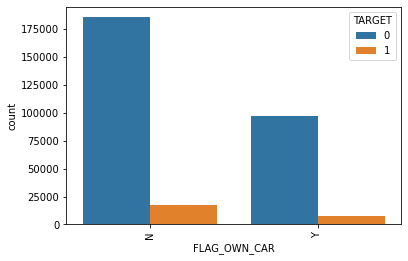

FLAG_OWN_REALTY


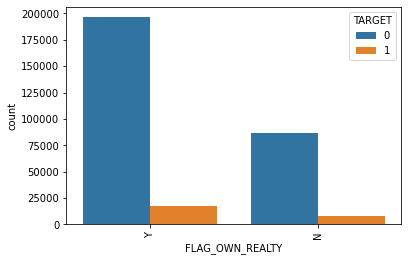

NAME_TYPE_SUITE


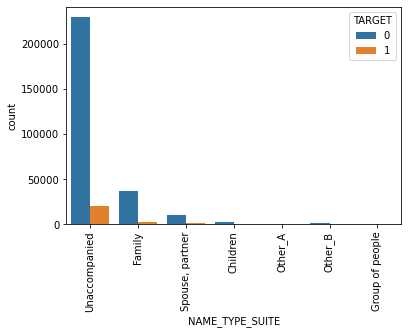

NAME_INCOME_TYPE


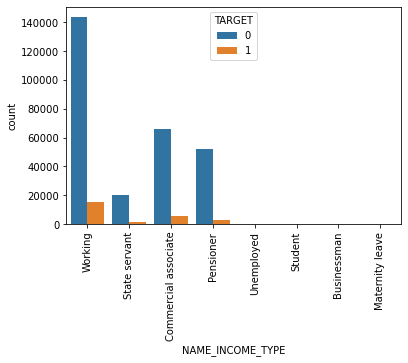

NAME_EDUCATION_TYPE


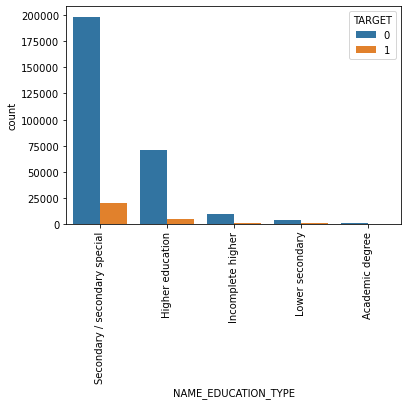

NAME_FAMILY_STATUS


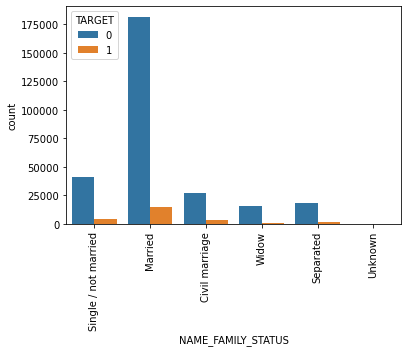

NAME_HOUSING_TYPE


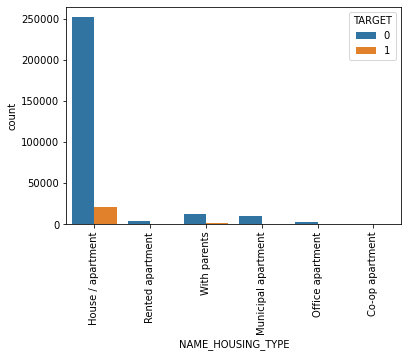

FLAG_MOBIL


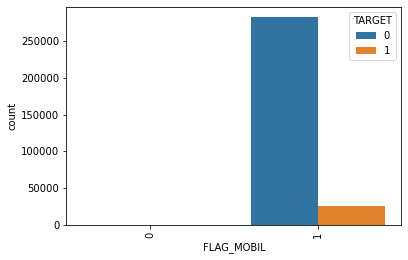

FLAG_EMP_PHONE


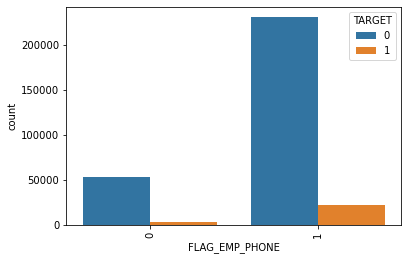

FLAG_WORK_PHONE


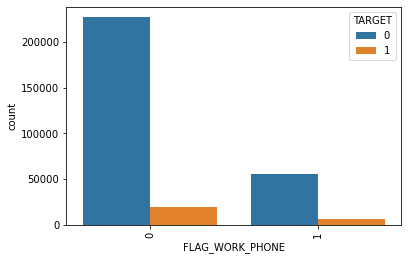

FLAG_CONT_MOBILE


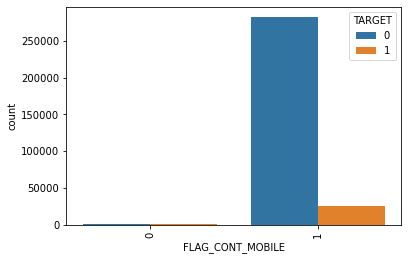

FLAG_PHONE


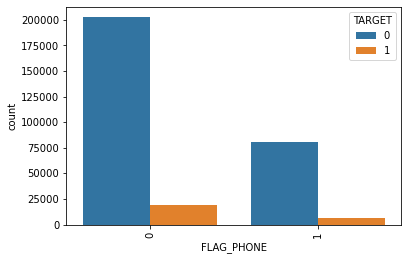

FLAG_EMAIL


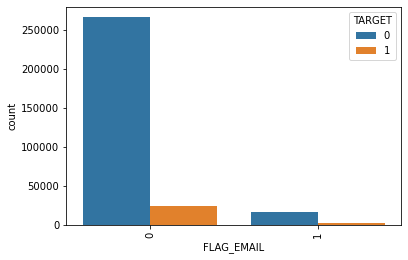

OCCUPATION_TYPE


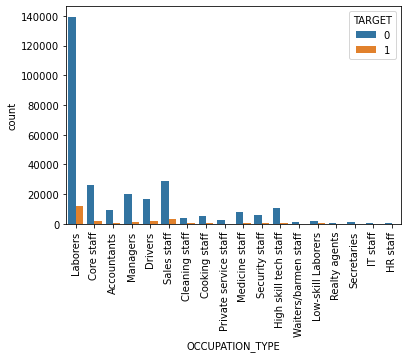

REGION_RATING_CLIENT


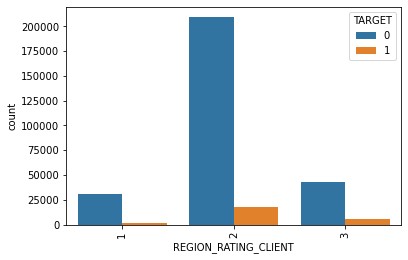

ORGANIZATION_TYPE


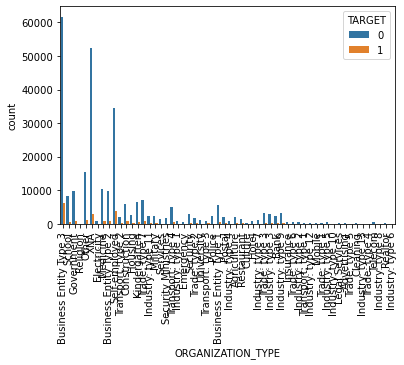

In [17]:
###Bivariate Analysis for Categorical Columns wrt TARGET
for i in imp_cat_cols:
    print(i)
    plt.xticks(rotation=90)
    sns.countplot(appd1[i],hue=appd1.TARGET)
    plt.show()

In [18]:
##Creating Dataset for Segmented Analysis Defaulters(TARGET==1),Non Defaulters(TARGET ==0)
appdef=appd1[appd1.TARGET==1]
appnondef =appd1[appd1.TARGET==0]

In [31]:
appdef.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.000,406597.500,24700.500,...,0,0,0,0,0.000,0.000,0.000,0.000,0.000,1.000
26,100031,1,Cash loans,F,N,Y,0,112500.000,979992.000,27076.500,...,0,0,0,0,0.000,0.000,0.000,0.000,2.000,2.000
40,100047,1,Cash loans,M,N,Y,0,202500.000,1193580.000,35028.000,...,0,0,0,0,0.000,0.000,0.000,2.000,0.000,4.000
42,100049,1,Cash loans,F,N,N,0,135000.000,288873.000,16258.500,...,0,0,0,0,0.000,0.000,0.000,0.000,0.000,2.000
81,100096,1,Cash loans,F,N,Y,0,81000.000,252000.000,14593.500,...,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.000


In [32]:
appnondef.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
1,100003,0,Cash loans,F,N,N,0,270000.000,1293502.500,35698.500,...,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.000
2,100004,0,Revolving loans,M,Y,Y,0,67500.000,135000.000,6750.000,...,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.000
3,100006,0,Cash loans,F,N,Y,0,135000.000,312682.500,29686.500,...,0,0,0,0,0.000,0.000,0.000,0.000,0.000,1.000
4,100007,0,Cash loans,M,N,Y,0,121500.000,513000.000,21865.500,...,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.000
5,100008,0,Cash loans,M,N,Y,0,99000.000,490495.500,27517.500,...,0,0,0,0,0.000,0.000,0.000,0.000,1.000,1.000


Upper bound for Defaulters of  CNT_CHILDREN : 1.0


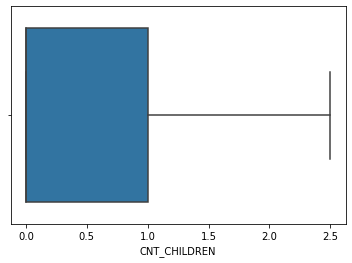

Upper bound for Non-Defaulters of  CNT_CHILDREN : 1.0


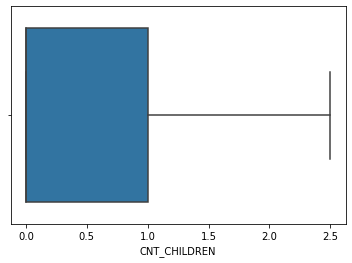

Upper bound for Defaulters of  AMT_INCOME_TOTAL : 202500.0


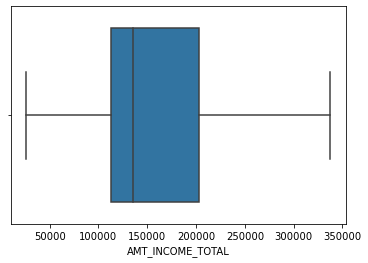

Upper bound for Non-Defaulters of  AMT_INCOME_TOTAL : 202500.0


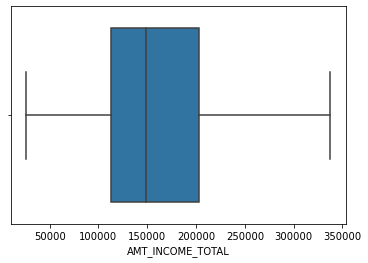

Upper bound for Defaulters of  AMT_CREDIT : 733315.5


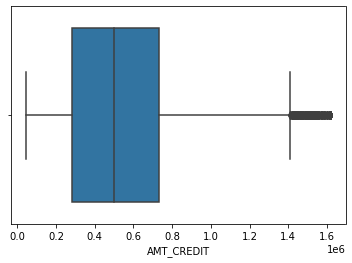

Upper bound for Non-Defaulters of  AMT_CREDIT : 810000.0


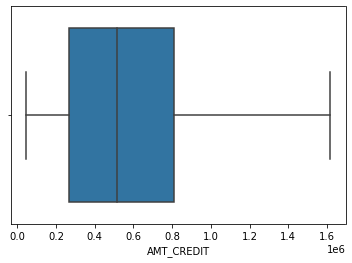

Upper bound for Defaulters of  AMT_ANNUITY : 32976.0


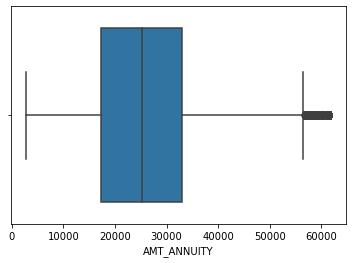

Upper bound for Non-Defaulters of  AMT_ANNUITY : 34749.0


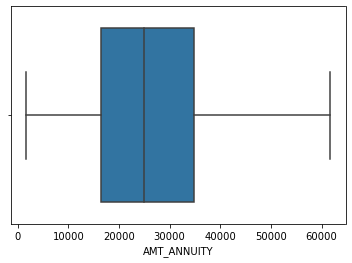

Upper bound for Defaulters of  AMT_GOODS_PRICE : 675000.0


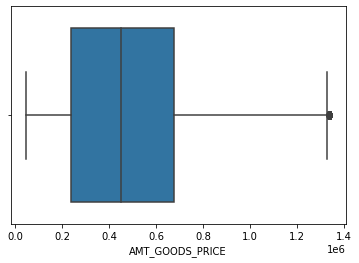

Upper bound for Non-Defaulters of  AMT_GOODS_PRICE : 685002.375


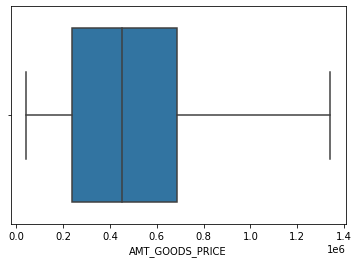

Upper bound for Defaulters of  REGION_POPULATION_RELATIVE : 0.025164


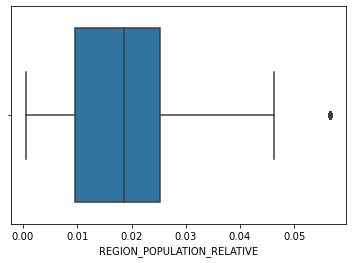

Upper bound for Non-Defaulters of  REGION_POPULATION_RELATIVE : 0.028663


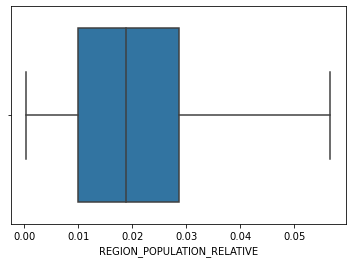

Upper bound for Defaulters of  DAYS_BIRTH : 18037.0


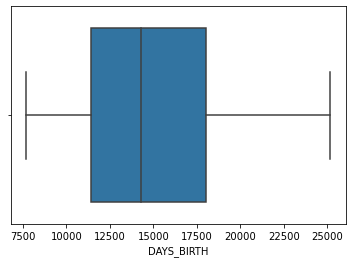

Upper bound for Non-Defaulters of  DAYS_BIRTH : 19793.75


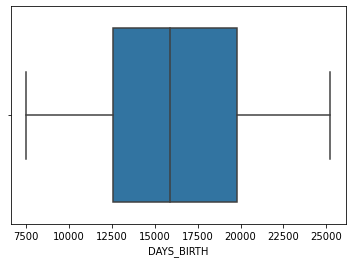

Upper bound for Defaulters of  DAYS_EMPLOYED : 3280.0


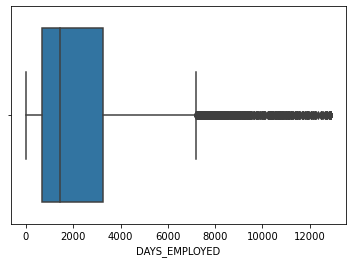

Upper bound for Non-Defaulters of  DAYS_EMPLOYED : 6074.0


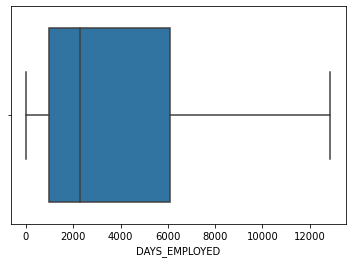

Upper bound for Defaulters of  DAYS_REGISTRATION : 6646.0


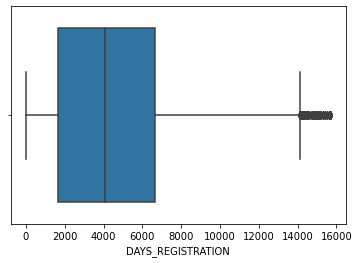

Upper bound for Non-Defaulters of  DAYS_REGISTRATION : 7550.0


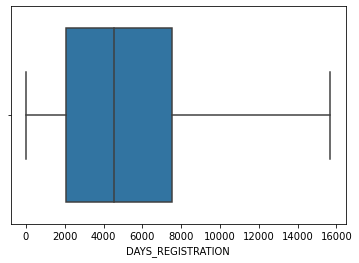

Upper bound for Defaulters of  DAYS_ID_PUBLISH : 4119.0


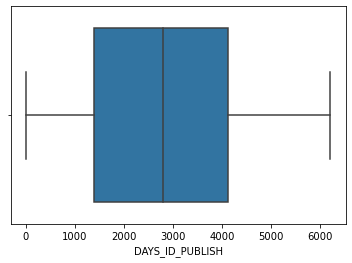

Upper bound for Non-Defaulters of  DAYS_ID_PUBLISH : 4313.0


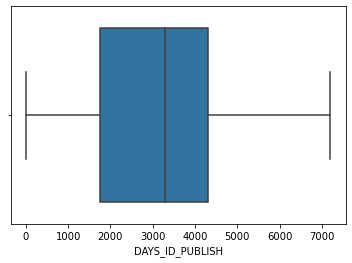

Upper bound for Defaulters of  CNT_FAM_MEMBERS : 3.0


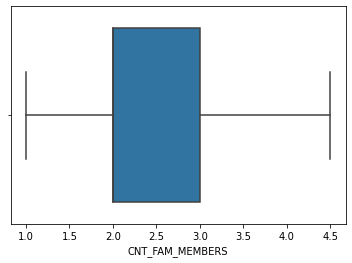

Upper bound for Non-Defaulters of  CNT_FAM_MEMBERS : 3.0


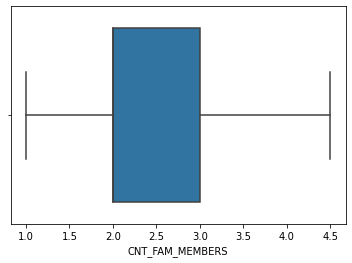

Upper bound for Defaulters of  EXT_SOURCE_2 : 0.5939365154573119


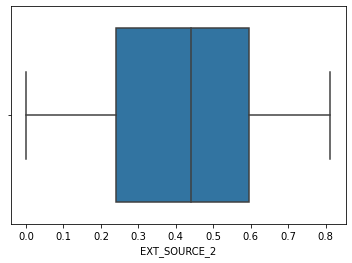

Upper bound for Non-Defaulters of  EXT_SOURCE_2 : 0.6675207418773126


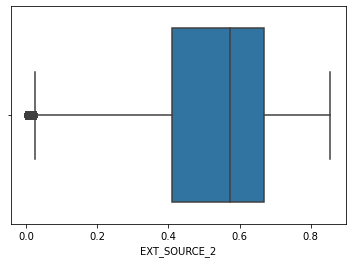

Upper bound for Defaulters of  EXT_SOURCE_3 : 0.5352762504724826


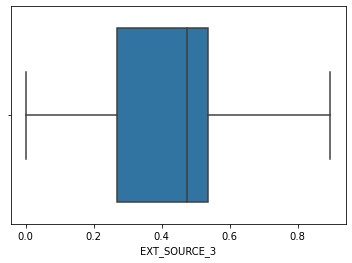

Upper bound for Non-Defaulters of  EXT_SOURCE_3 : 0.6430255641096323


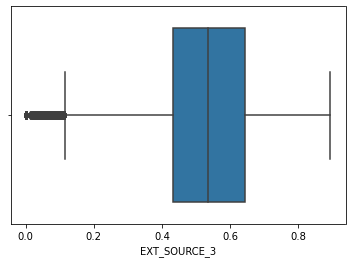

Upper bound for Defaulters of  DAYS_LAST_PHONE_CHANGE : 1301.0


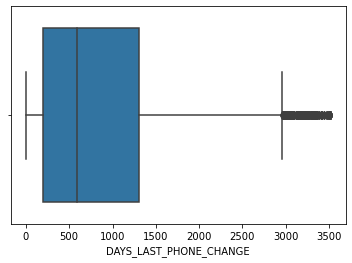

Upper bound for Non-Defaulters of  DAYS_LAST_PHONE_CHANGE : 1586.0


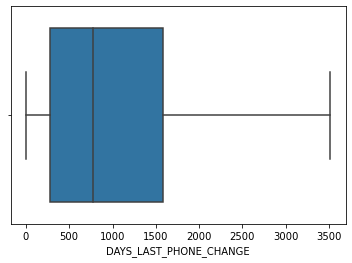

In [19]:
### Segmented Univariate Analysis for Numerical data for Defaulters
for i in imp_cont_cols:
    q3d,q1d = np.percentile(appdef[i], [75 ,25])
    print('Upper bound for Defaulters of ',i,":",q3d)
    sns.boxplot(appdef[i])
    plt.show()
    q3nd,q1nd = np.percentile(appnondef[i], [75 ,25])
    print('Upper bound for Non-Defaulters of ',i,":",q3nd)
    sns.boxplot(appnondef[i])
    plt.show()

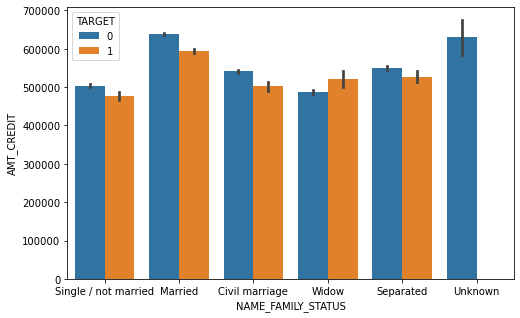

In [71]:
fig, ax = plt.subplots(figsize=(8,5))
sns.barplot(y=appd1.AMT_CREDIT,x=appd1.NAME_FAMILY_STATUS,hue=appd1.TARGET)
plt.show()

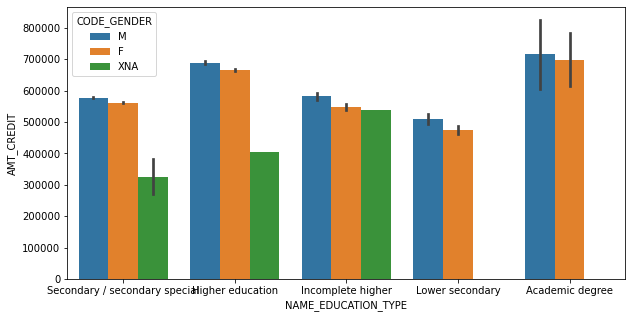

In [73]:
fig, ax = plt.subplots(figsize=(10,5))
sns.barplot(y=appd1.AMT_CREDIT,x=appd1.NAME_EDUCATION_TYPE,hue=appd1.CODE_GENDER)
plt.show()

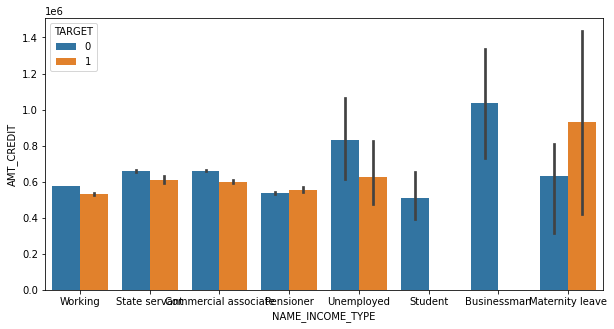

In [75]:
fig, ax = plt.subplots(figsize=(10,5))
sns.barplot(y=appd1.AMT_CREDIT,x=appd1.NAME_INCOME_TYPE,hue=appd1.TARGET)
plt.show()

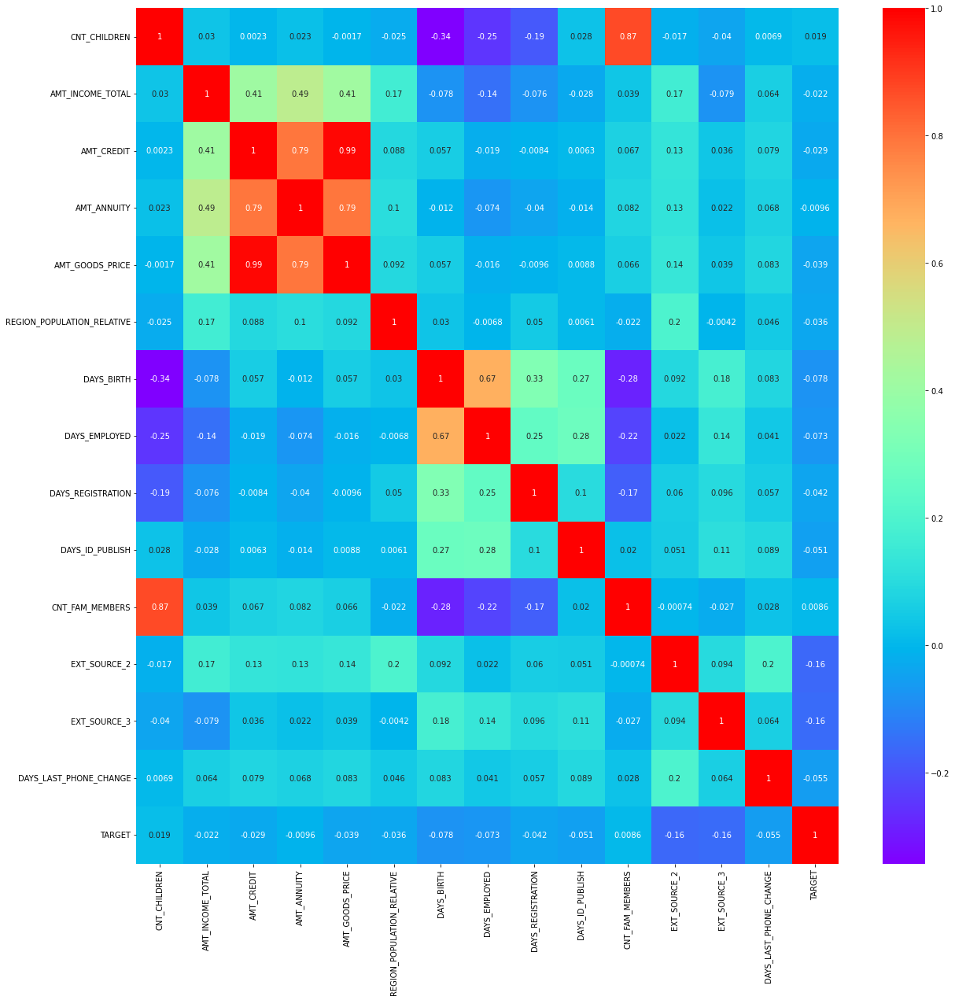

In [20]:
### Multivariate Analysis for Continous Columns ####
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(appd1[imp_cont_cols +['TARGET']].corr(),annot=True ,cmap='rainbow')
plt.show()

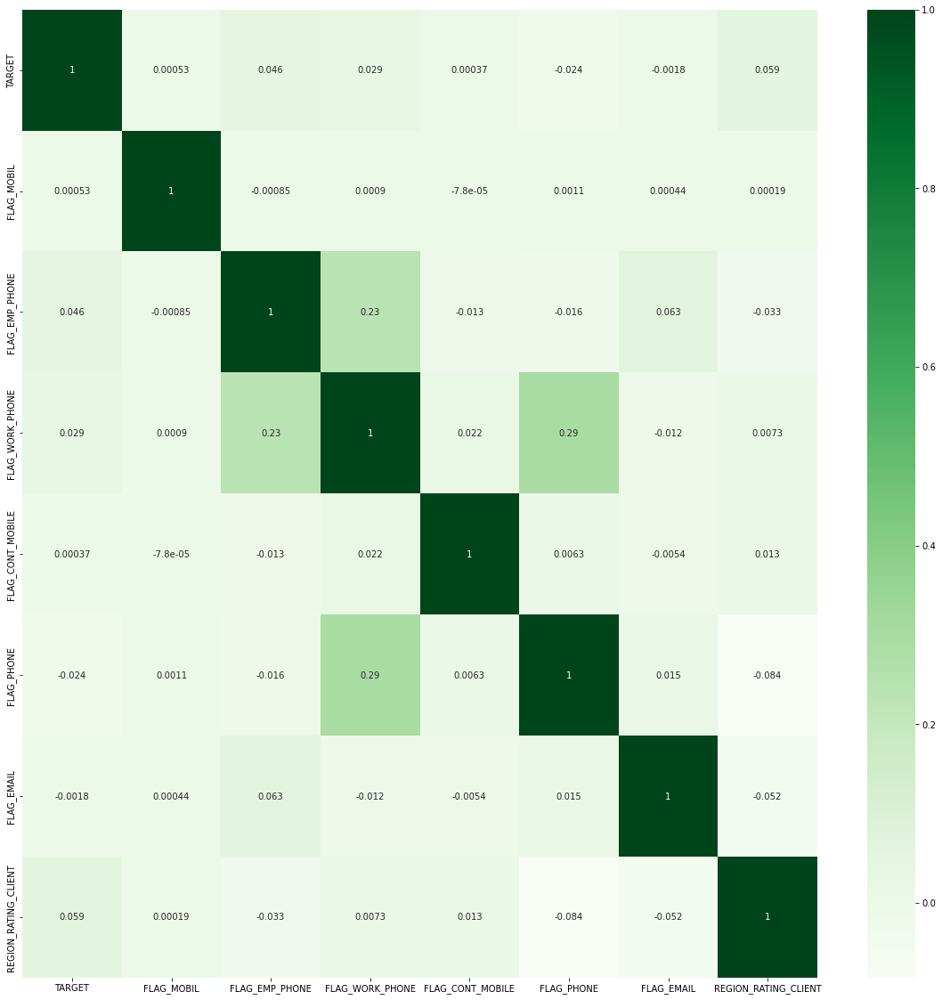

In [21]:
### Multivariate Analysis for Categorical Columns ####
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(appd1[imp_cat_cols].corr(),annot=True,cmap='Greens')
plt.show()

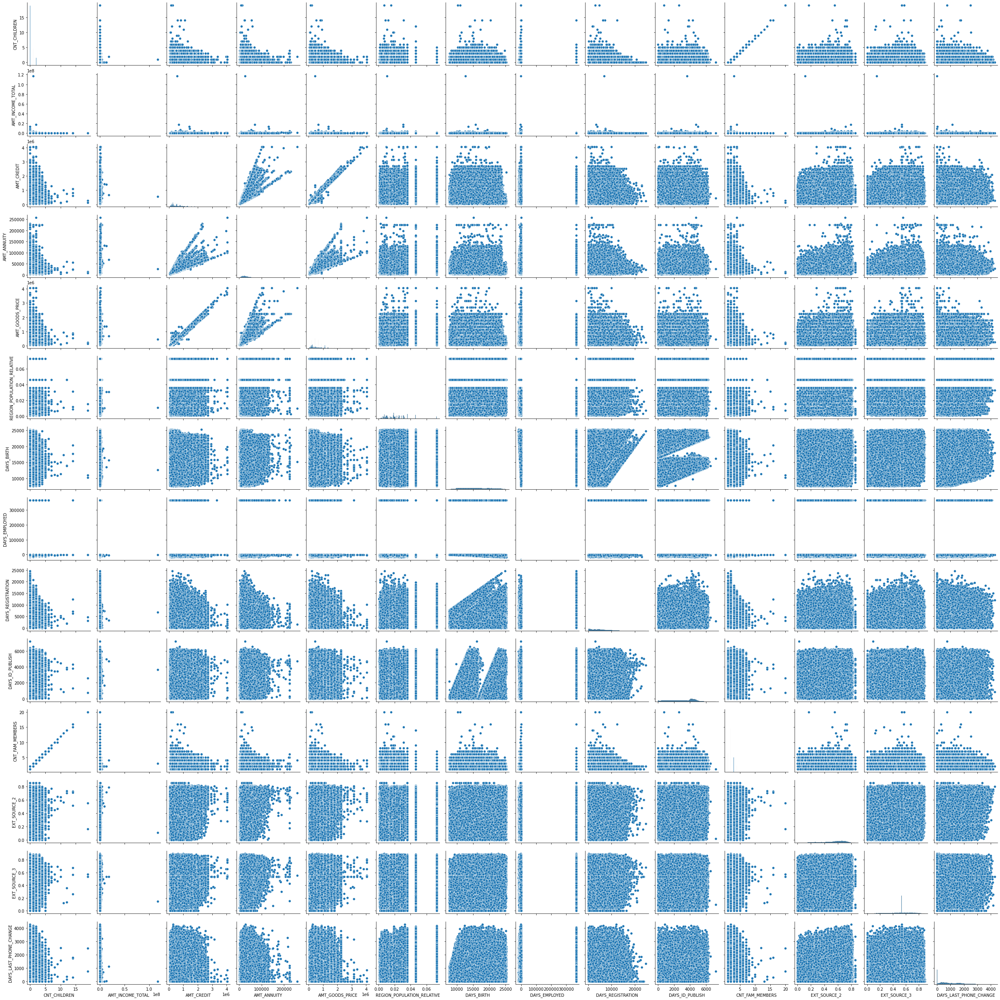

In [40]:
##Multivariate Analysis -Pair plot###
sns.pairplot(appd1[imp_cont_cols])
plt.show()

# ANALYSING PREVIOUS APPLICATION DATASET #


In [22]:
###Importing the previous application csv
prevdata=pd.read_csv(r"C:\Users\parul\Downloads\Credit EDA Case Study_Parul\previous_application.csv")

In [42]:
prevdata.shape

(1670214, 37)

In [56]:
prevdata.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1670214.000,1670214.000,1297979.000,1670214.000,1670213.000,774370.000,1284699.000,1670214.000,1670214.000,774370.000,...,5951.000,1670214.000,1670214.000,1297984.000,997149.000,997149.000,997149.000,997149.000,997149.000,997149.000
mean,1923089.135,278357.174,15955.121,175233.860,196114.021,6697.402,227847.279,12.484,0.996,0.080,...,0.774,-880.680,313.951,16.054,342209.855,13826.269,33767.774,76582.403,81992.344,0.333
std,532597.959,102814.824,14782.137,292779.762,318574.617,20921.495,315396.558,3.334,0.059,0.108,...,0.101,779.100,7127.443,14.567,88916.116,72444.870,106857.035,149647.415,153303.517,0.471
min,1000001.000,100001.000,0.000,0.000,0.000,-0.900,0.000,0.000,0.000,-0.000,...,0.373,-2922.000,-1.000,0.000,-2922.000,-2892.000,-2801.000,-2889.000,-2874.000,0.000
25%,1461857.250,189329.000,6321.780,18720.000,24160.500,0.000,50841.000,10.000,1.000,0.000,...,0.716,-1300.000,-1.000,6.000,365243.000,-1628.000,-1242.000,-1314.000,-1270.000,0.000
50%,1923110.500,278714.500,11250.000,71046.000,80541.000,1638.000,112320.000,12.000,1.000,0.052,...,0.835,-581.000,3.000,12.000,365243.000,-831.000,-361.000,-537.000,-499.000,0.000
75%,2384279.750,367514.000,20658.420,180360.000,216418.500,7740.000,234000.000,15.000,1.000,0.109,...,0.853,-280.000,82.000,24.000,365243.000,-411.000,129.000,-74.000,-44.000,1.000
max,2845382.000,456255.000,418058.145,6905160.000,6905160.000,3060045.000,6905160.000,23.000,1.000,1.000,...,1.000,-1.000,4000000.000,84.000,365243.000,365243.000,365243.000,365243.000,365243.000,1.000


In [44]:
prevdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [45]:
prevdata.isnull().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [23]:
###Identifying Missing Values Colums
pdmv=prevdata.isnull().mean().reset_index()
# Converting into percentage
pdmv[0] = pdmv[0] * 100
pdmv = pdmv.rename(columns={"index":"Column Name",0:"% Missing Values"})
pdmv.sort_values(by="% Missing Values", ascending=False)

,Column Name,% Missing Values
14,RATE_INTEREST_PRIVILEGED,99.644
13,RATE_INTEREST_PRIMARY,99.644
6,AMT_DOWN_PAYMENT,53.636
12,RATE_DOWN_PAYMENT,53.636
20,NAME_TYPE_SUITE,49.120
36,NFLAG_INSURED_ON_APPROVAL,40.298
35,DAYS_TERMINATION,40.298
34,DAYS_LAST_DUE,40.298
33,DAYS_LAST_DUE_1ST_VERSION,40.298
32,DAYS_FIRST_DUE,40.298


In [24]:
#Dropping Columns having high percentage(>40) of Missing Values
prev_drop_cols=list(pdmv[pdmv["% Missing Values"]>40]["Column Name"])
pd1=prevdata.drop(prev_drop_cols,axis=1)

In [49]:
##Checking if any null values
pd1.isnull().sum()

SK_ID_PREV                          0
SK_ID_CURR                          0
NAME_CONTRACT_TYPE                  0
AMT_ANNUITY                    372235
AMT_APPLICATION                     0
AMT_CREDIT                          1
AMT_GOODS_PRICE                385515
WEEKDAY_APPR_PROCESS_START          0
HOUR_APPR_PROCESS_START             0
FLAG_LAST_APPL_PER_CONTRACT         0
NFLAG_LAST_APPL_IN_DAY              0
NAME_CASH_LOAN_PURPOSE              0
NAME_CONTRACT_STATUS                0
DAYS_DECISION                       0
NAME_PAYMENT_TYPE                   0
CODE_REJECT_REASON                  0
NAME_CLIENT_TYPE                    0
NAME_GOODS_CATEGORY                 0
NAME_PORTFOLIO                      0
NAME_PRODUCT_TYPE                   0
CHANNEL_TYPE                        0
SELLERPLACE_AREA                    0
NAME_SELLER_INDUSTRY                0
CNT_PAYMENT                    372230
NAME_YIELD_GROUP                    0
PRODUCT_COMBINATION               346
dtype: int64

In [50]:
pd1.shape

(1670214, 26)

In [51]:
###Checking the unique value in columns in previous data
for i in pd1.columns:
    print(i,pd1[i].nunique())

SK_ID_PREV 1670214
SK_ID_CURR 338857
NAME_CONTRACT_TYPE 4
AMT_ANNUITY 357959
AMT_APPLICATION 93885
AMT_CREDIT 86803
AMT_GOODS_PRICE 93885
WEEKDAY_APPR_PROCESS_START 7
HOUR_APPR_PROCESS_START 24
FLAG_LAST_APPL_PER_CONTRACT 2
NFLAG_LAST_APPL_IN_DAY 2
NAME_CASH_LOAN_PURPOSE 25
NAME_CONTRACT_STATUS 4
DAYS_DECISION 2922
NAME_PAYMENT_TYPE 4
CODE_REJECT_REASON 9
NAME_CLIENT_TYPE 4
NAME_GOODS_CATEGORY 28
NAME_PORTFOLIO 5
NAME_PRODUCT_TYPE 3
CHANNEL_TYPE 8
SELLERPLACE_AREA 2097
NAME_SELLER_INDUSTRY 11
CNT_PAYMENT 49
NAME_YIELD_GROUP 5
PRODUCT_COMBINATION 17


In [26]:
###Identifying columns between ID category,Continous Column and Categorical Columns for Analysis
id_pdcols=["SK_ID_CURR","SK_ID_PREV"]
cont_pdcols=["AMT_ANNUITY","AMT_APPLICATION","AMT_CREDIT","AMT_GOODS_PRICE",]
cat_pdcols=["NAME_CASH_LOAN_PURPOSE","NAME_CONTRACT_STATUS","NAME_PAYMENT_TYPE","CODE_REJECT_REASON","NAME_CLIENT_TYPE"]


In [27]:
#Handling/Imputing Missing Values for Continous Columns
for i in cont_pdcols:
    if pd1[i].isnull().sum()>0:
        imp_val=pd1[i].median()
        pd1[i]=pd1[i].fillna(imp_val)


In [28]:
#Handling/Imputing Missing Values for Categorical Columns
for i in cat_pdcols:
    if pd1[i].isnull().sum()>0:
        imp_val=pd1[i].mode()[0]
        pd1[i]=pd1[i].fillna(imp_val)

In [55]:
##Verifying if any null value
pd1.isnull().sum()

SK_ID_PREV                          0
SK_ID_CURR                          0
NAME_CONTRACT_TYPE                  0
AMT_ANNUITY                         0
AMT_APPLICATION                     0
AMT_CREDIT                          0
AMT_GOODS_PRICE                     0
WEEKDAY_APPR_PROCESS_START          0
HOUR_APPR_PROCESS_START             0
FLAG_LAST_APPL_PER_CONTRACT         0
NFLAG_LAST_APPL_IN_DAY              0
NAME_CASH_LOAN_PURPOSE              0
NAME_CONTRACT_STATUS                0
DAYS_DECISION                       0
NAME_PAYMENT_TYPE                   0
CODE_REJECT_REASON                  0
NAME_CLIENT_TYPE                    0
NAME_GOODS_CATEGORY                 0
NAME_PORTFOLIO                      0
NAME_PRODUCT_TYPE                   0
CHANNEL_TYPE                        0
SELLERPLACE_AREA                    0
NAME_SELLER_INDUSTRY                0
CNT_PAYMENT                    372230
NAME_YIELD_GROUP                    0
PRODUCT_COMBINATION               346
dtype: int64

AMT_ANNUITY


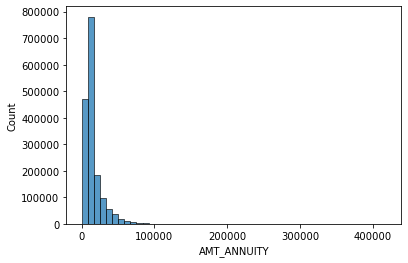

AMT_APPLICATION


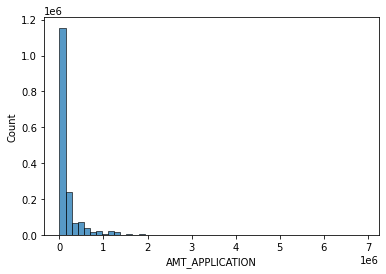

AMT_CREDIT


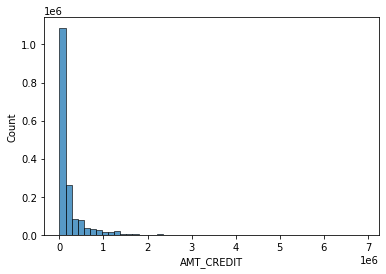

AMT_GOODS_PRICE


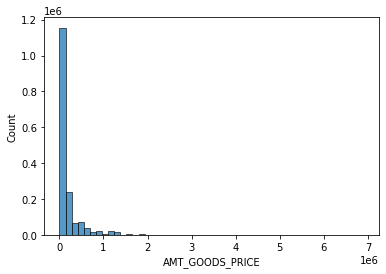

In [30]:
##Univariate Analysis for Continous Columns 
for i in cont_pdcols:
    print(i)
    sns.histplot(pd1[i],bins=50)
    plt.show()

Outliers for  AMT_ANNUITY
IQR = 9276.930000000002 : Floor = -6368.298750000004 : Capping = 30739.421250000007


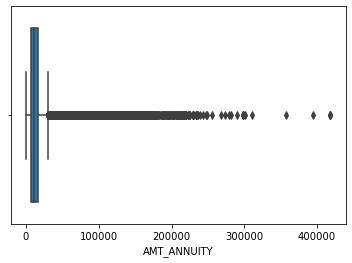

Outliers for  AMT_APPLICATION
IQR = 161640.0 : Floor = -223740.0 : Capping = 422820.0


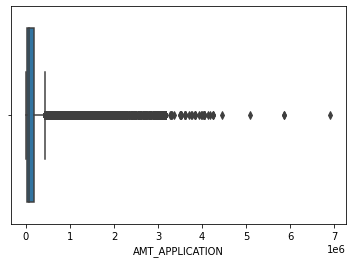

Outliers for  AMT_CREDIT
IQR = 192258.0 : Floor = -264226.5 : Capping = 504805.5


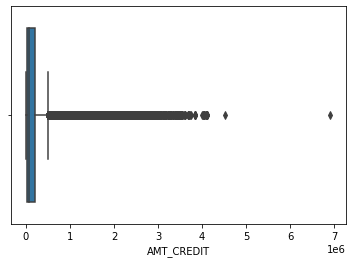

Outliers for  AMT_GOODS_PRICE
IQR = 112905.0 : Floor = -101857.5 : Capping = 349762.5


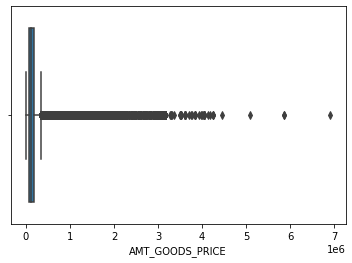

In [31]:
#For Outlier Analysis (Boxplot)
for i in cont_pdcols:
    print("Outliers for " ,i)
    q3, q1 = np.percentile(pd1[i], [75 ,25])
    iqr = q3 - q1
    floor = q1 -1.5*iqr
    capping =q3 + 1.5 *iqr
    print ("IQR =",iqr ,": Floor =" ,floor ,": Capping =" ,capping)
    sns.boxplot(pd1[i])
    plt.show()

NAME_CASH_LOAN_PURPOSE AMT_ANNUITY


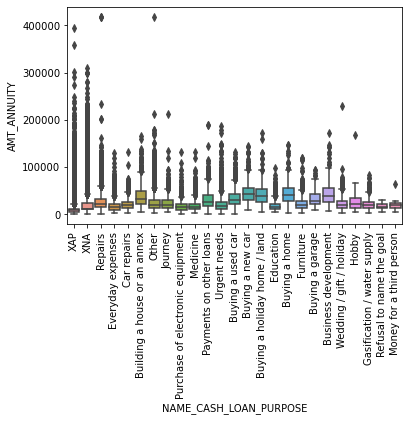

NAME_CASH_LOAN_PURPOSE AMT_APPLICATION


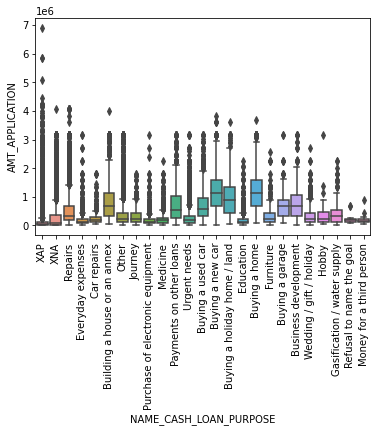

NAME_CASH_LOAN_PURPOSE AMT_CREDIT


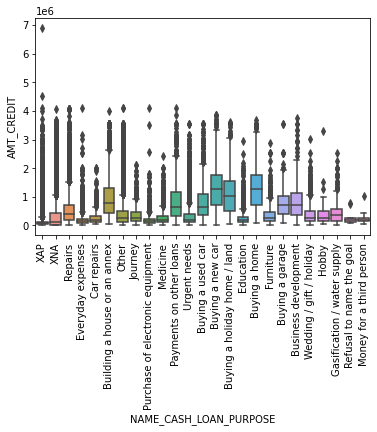

NAME_CASH_LOAN_PURPOSE AMT_GOODS_PRICE


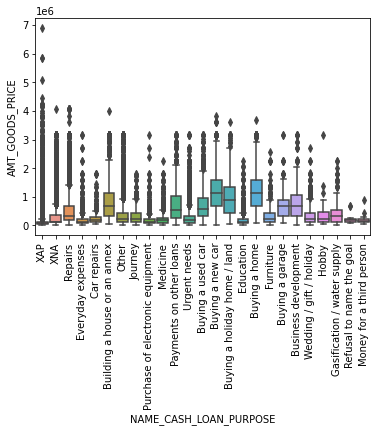

NAME_CONTRACT_STATUS AMT_ANNUITY


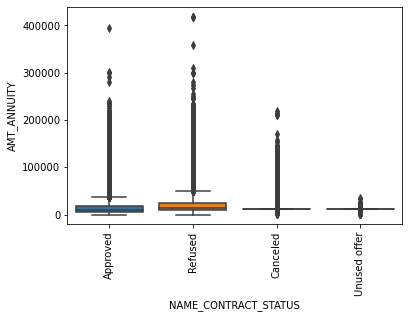

NAME_CONTRACT_STATUS AMT_APPLICATION


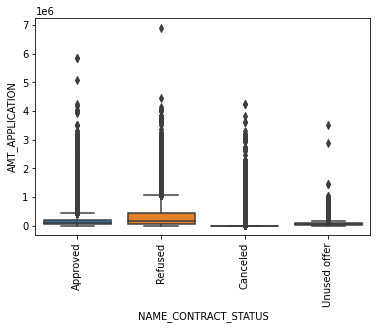

NAME_CONTRACT_STATUS AMT_CREDIT


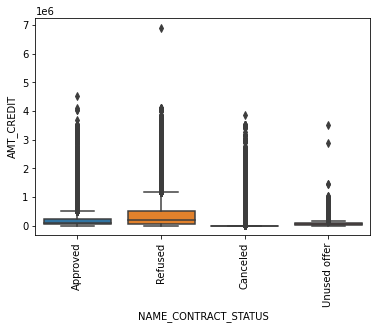

NAME_CONTRACT_STATUS AMT_GOODS_PRICE


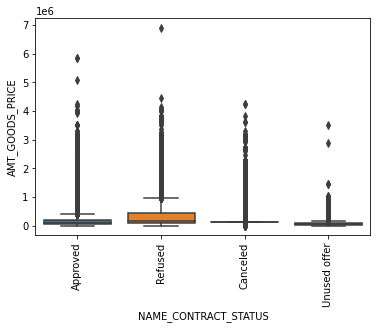

NAME_PAYMENT_TYPE AMT_ANNUITY


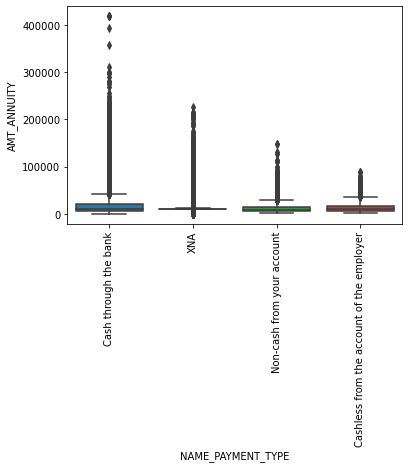

NAME_PAYMENT_TYPE AMT_APPLICATION


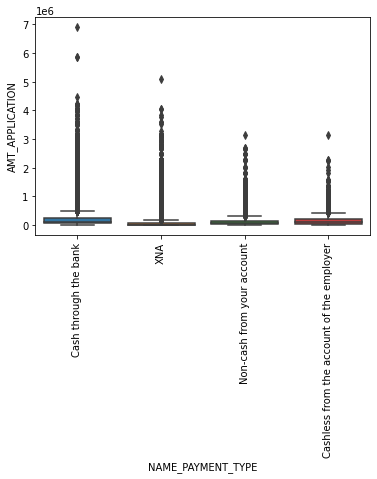

NAME_PAYMENT_TYPE AMT_CREDIT


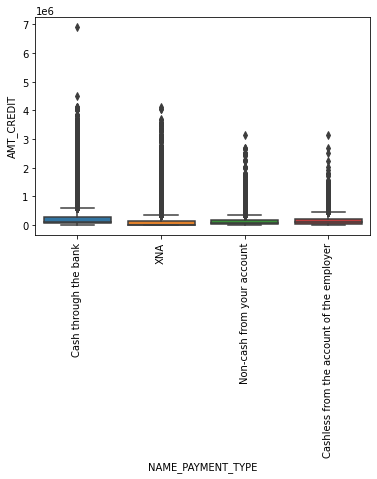

NAME_PAYMENT_TYPE AMT_GOODS_PRICE


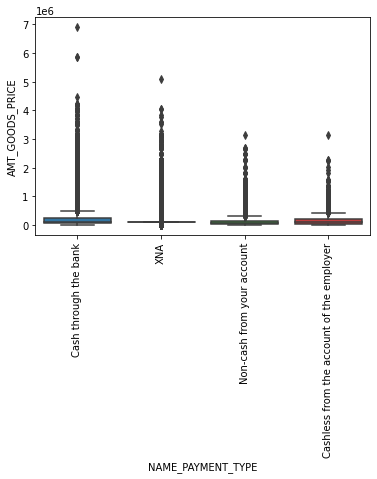

CODE_REJECT_REASON AMT_ANNUITY


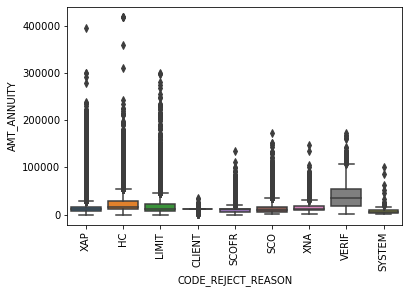

CODE_REJECT_REASON AMT_APPLICATION


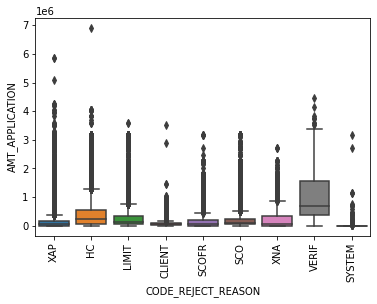

CODE_REJECT_REASON AMT_CREDIT


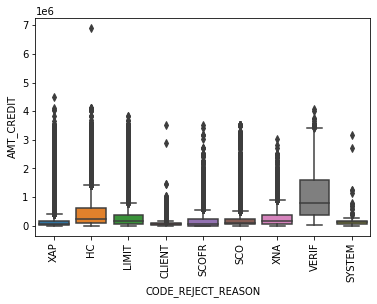

CODE_REJECT_REASON AMT_GOODS_PRICE


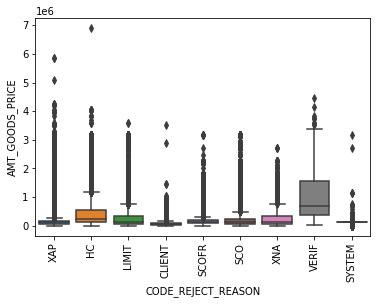

NAME_CLIENT_TYPE AMT_ANNUITY


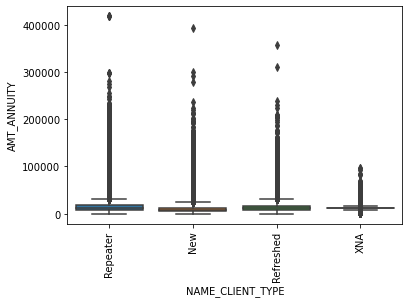

NAME_CLIENT_TYPE AMT_APPLICATION


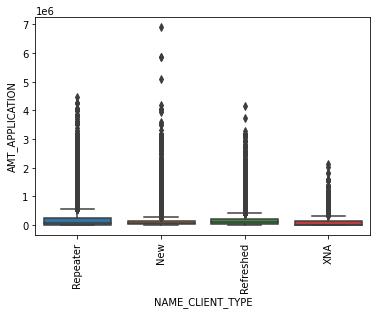

NAME_CLIENT_TYPE AMT_CREDIT


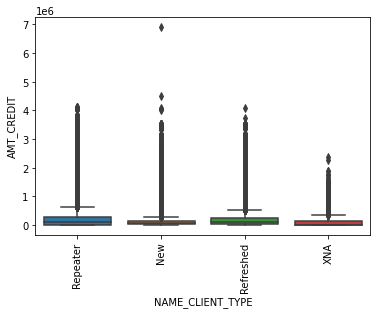

NAME_CLIENT_TYPE AMT_GOODS_PRICE


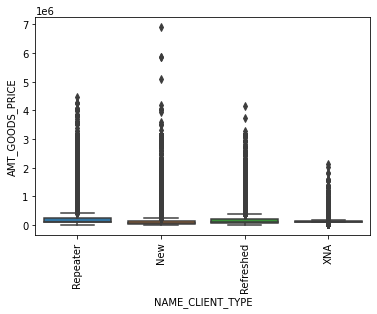

In [32]:
### Bivariate Analysis###
for i in cat_pdcols:
    for j in cont_pdcols:
        print(i,j)
        plt.xticks(rotation=90)
        sns.boxplot(x=pd1[i],y=pd1[j])
        plt.show()

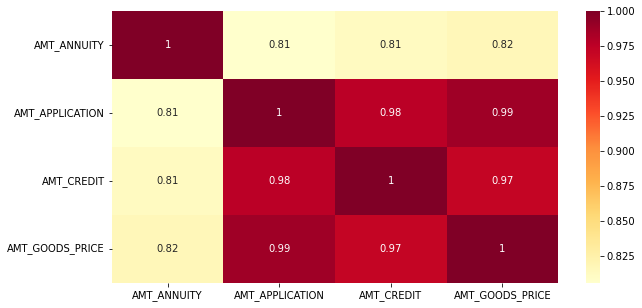

In [76]:
### Multivariate Analysis -- Heatmaps for Continous ####
fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(pd1[cont_pdcols].corr(),annot=True, cmap='YlOrRd')
plt.show()

# Analysis for Merged Dataset #

In [34]:
appd1.shape

(307511, 73)

In [35]:
pd1.shape

(1670214, 26)

In [36]:
###Merging the two dataset for analysing
mdata= pd.merge(appd1,pd1, how='inner', on='SK_ID_CURR')

In [37]:
mdata.shape

(1413701, 98)

In [38]:
mdata.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,...,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,100002,1,Cash loans,M,N,Y,0.000,202500.000,406597.500,24700.500,...,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.000,low_normal,POS other with interest
1,100003,0,Cash loans,F,N,N,0.000,270000.000,1293502.500,35698.500,...,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.000,low_normal,Cash X-Sell: low
2,100003,0,Cash loans,F,N,N,0.000,270000.000,1293502.500,35698.500,...,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.000,middle,POS industry with interest
3,100003,0,Cash loans,F,N,N,0.000,270000.000,1293502.500,35698.500,...,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200,Consumer electronics,12.000,middle,POS household with interest
4,100004,0,Revolving loans,M,Y,Y,0.000,67500.000,135000.000,6750.000,...,New,Mobile,POS,XNA,Regional / Local,30,Connectivity,4.000,middle,POS mobile without interest


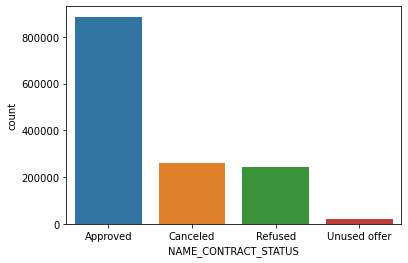

In [39]:
##Univariate Analysis##
sns.countplot(mdata.NAME_CONTRACT_STATUS)
plt.show()


In [67]:
mdata.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,...,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,100002,1,Cash loans,M,N,Y,0,202500.000,406597.500,24700.500,...,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.000,low_normal,POS other with interest
1,100003,0,Cash loans,F,N,N,0,270000.000,1293502.500,35698.500,...,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.000,low_normal,Cash X-Sell: low
2,100003,0,Cash loans,F,N,N,0,270000.000,1293502.500,35698.500,...,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.000,middle,POS industry with interest
3,100003,0,Cash loans,F,N,N,0,270000.000,1293502.500,35698.500,...,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200,Consumer electronics,12.000,middle,POS household with interest
4,100004,0,Revolving loans,M,Y,Y,0,67500.000,135000.000,6750.000,...,New,Mobile,POS,XNA,Regional / Local,30,Connectivity,4.000,middle,POS mobile without interest


In [50]:
mdata['AGE_BIRTH']=mdata.DAYS_BIRTH/365

In [52]:
mdata.AGE_BIRTH.value_counts()

40.795    235
48.967    228
32.852    227
45.811    222
36.932    219
         ... 
21.449      1
21.737      1
21.636      1
21.189      1
67.192      1
Name: AGE_BIRTH, Length: 17448, dtype: int64

In [51]:
mdata.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_x', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_x', 'AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START_x', 'HOUR_APPR_PROCESS_START_x',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE

In [53]:
cont_mdcols=["AMT_ANNUITY_x","AMT_CREDIT_x","AMT_GOODS_PRICE_x","DAYS_EMPLOYED","DAYS_BIRTH","AGE_BIRTH"]
cat_mdcols=["TARGET","NAME_CONTRACT_STATUS","NAME_CLIENT_TYPE","CODE_GENDER","NAME_EDUCATION_TYPE","NAME_FAMILY_STATUS","CHANNEL_TYPE","NAME_CONTRACT_TYPE_x"]


TARGET


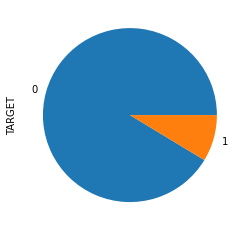

NAME_CONTRACT_STATUS


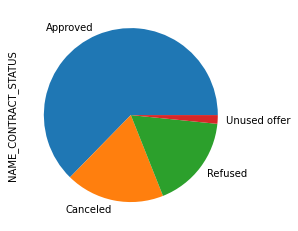

NAME_CLIENT_TYPE


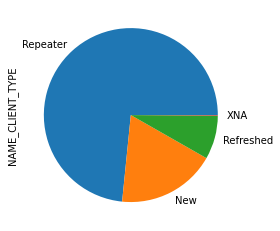

CODE_GENDER


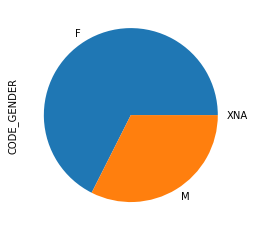

NAME_EDUCATION_TYPE


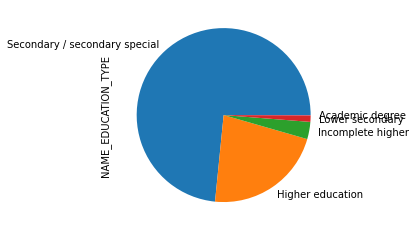

NAME_FAMILY_STATUS


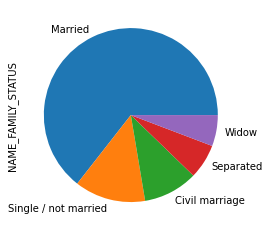

CHANNEL_TYPE


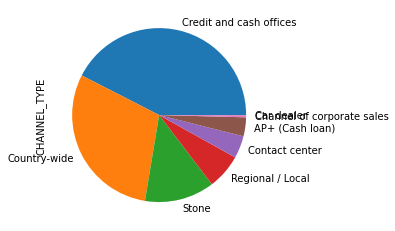

NAME_CONTRACT_TYPE_x


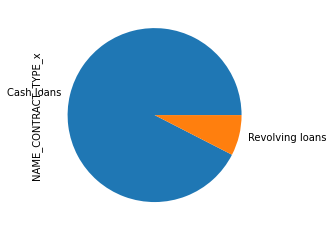

In [42]:
##Univariate Analysis for Merged Dataset #
for i in cat_mdcols:
    print(i)
    mdata[i].value_counts().plot.pie()
    plt.show()

AMT_ANNUITY_x


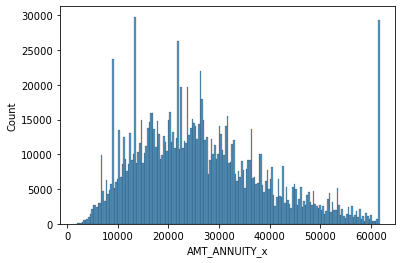

AMT_CREDIT_x


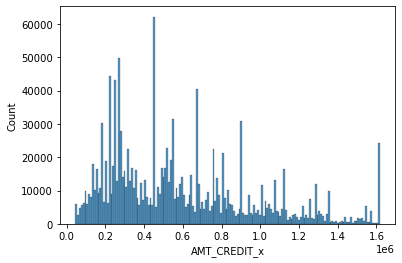

AMT_GOODS_PRICE_x


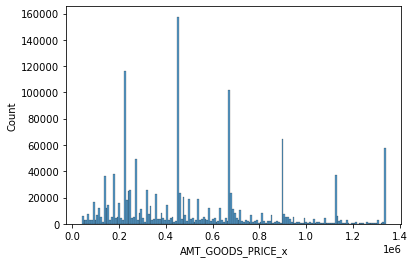

DAYS_EMPLOYED


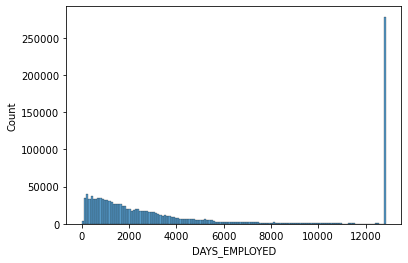

DAYS_BIRTH


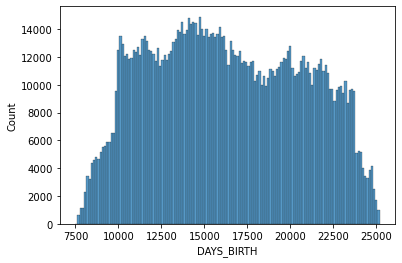

AGE_BIRTH


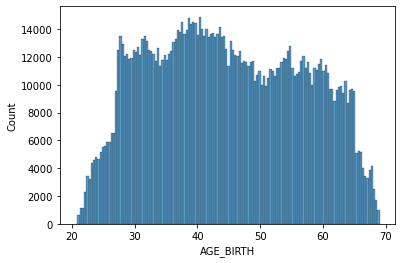

In [54]:
##Univariate Analysis for Merged Dataset #
for i in cont_mdcols:
    print(i)
    sns.histplot(mdata[i])
    plt.show()

TARGET AMT_ANNUITY_x


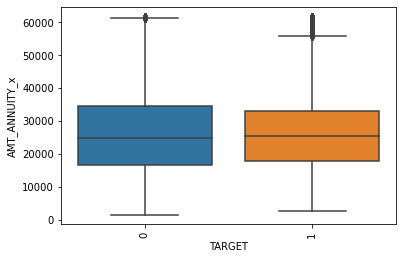

TARGET AMT_CREDIT_x


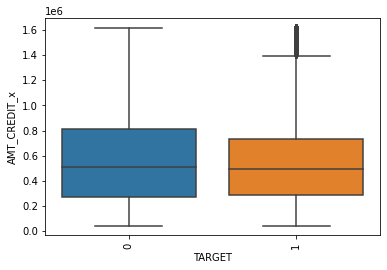

TARGET AMT_GOODS_PRICE_x


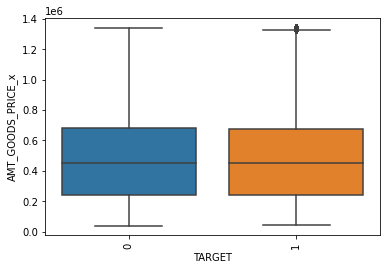

TARGET DAYS_EMPLOYED


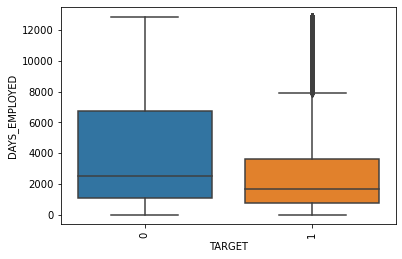

TARGET DAYS_BIRTH


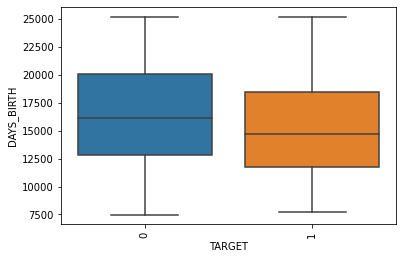

TARGET AGE_BIRTH


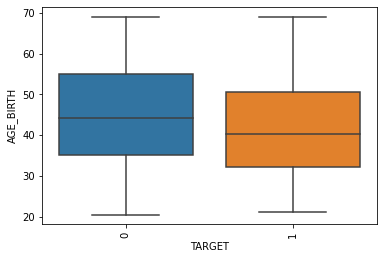

NAME_CONTRACT_STATUS AMT_ANNUITY_x


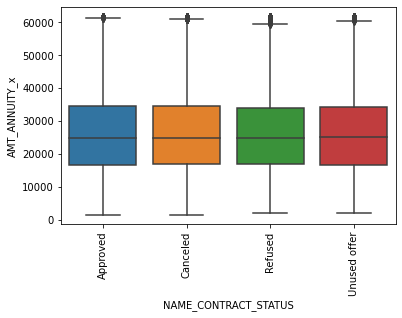

NAME_CONTRACT_STATUS AMT_CREDIT_x


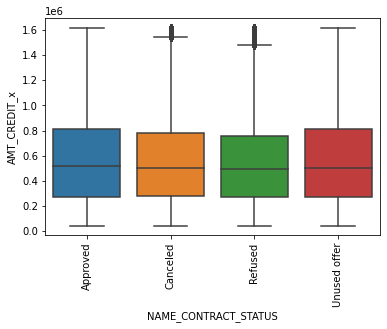

NAME_CONTRACT_STATUS AMT_GOODS_PRICE_x


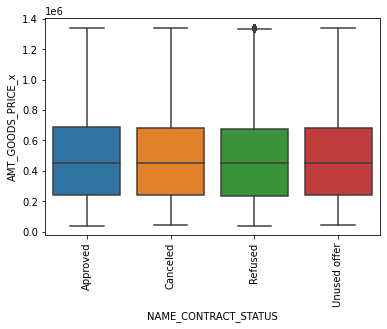

NAME_CONTRACT_STATUS DAYS_EMPLOYED


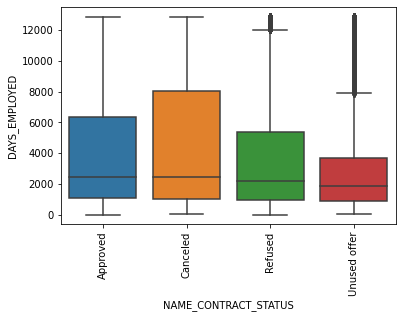

NAME_CONTRACT_STATUS DAYS_BIRTH


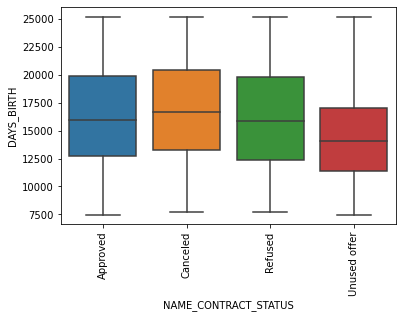

NAME_CONTRACT_STATUS AGE_BIRTH


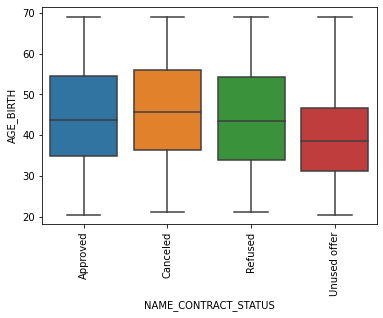

NAME_CLIENT_TYPE AMT_ANNUITY_x


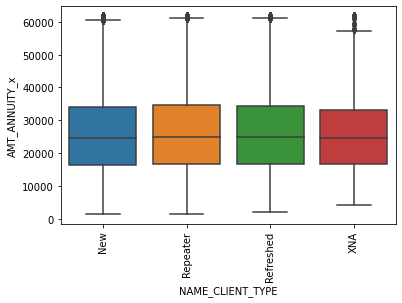

NAME_CLIENT_TYPE AMT_CREDIT_x


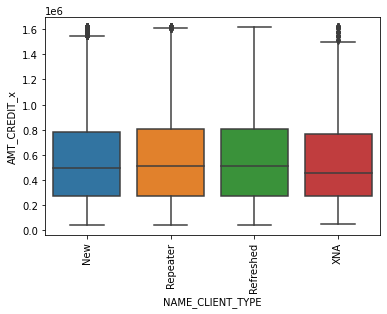

NAME_CLIENT_TYPE AMT_GOODS_PRICE_x


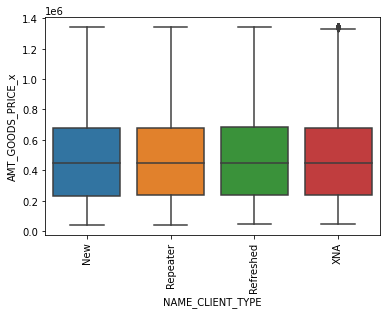

NAME_CLIENT_TYPE DAYS_EMPLOYED


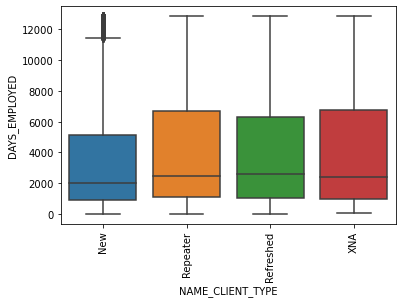

NAME_CLIENT_TYPE DAYS_BIRTH


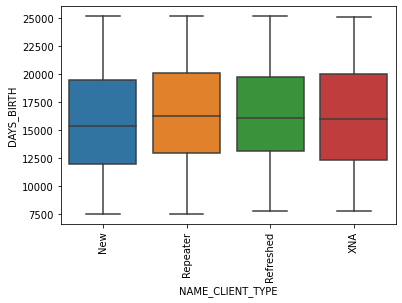

NAME_CLIENT_TYPE AGE_BIRTH


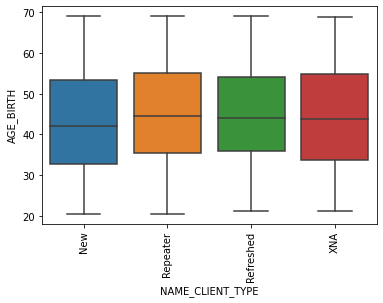

CODE_GENDER AMT_ANNUITY_x


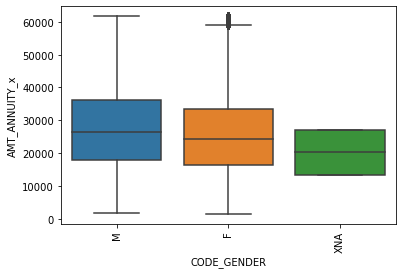

CODE_GENDER AMT_CREDIT_x


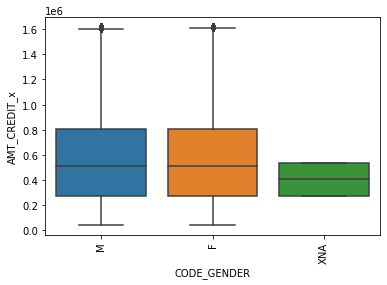

CODE_GENDER AMT_GOODS_PRICE_x


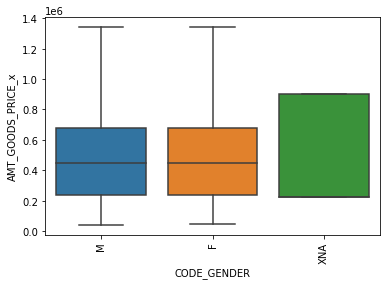

CODE_GENDER DAYS_EMPLOYED


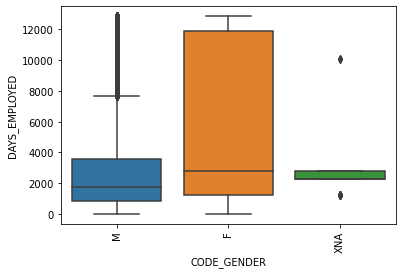

CODE_GENDER DAYS_BIRTH


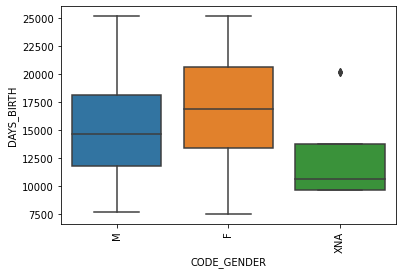

CODE_GENDER AGE_BIRTH


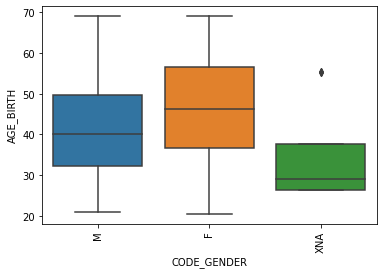

NAME_EDUCATION_TYPE AMT_ANNUITY_x


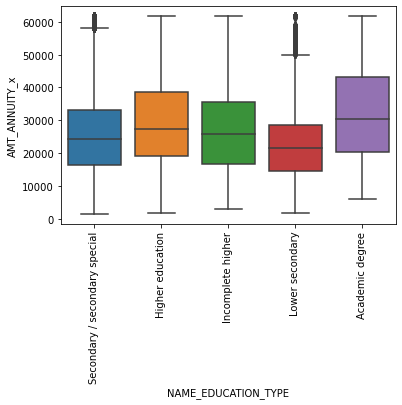

NAME_EDUCATION_TYPE AMT_CREDIT_x


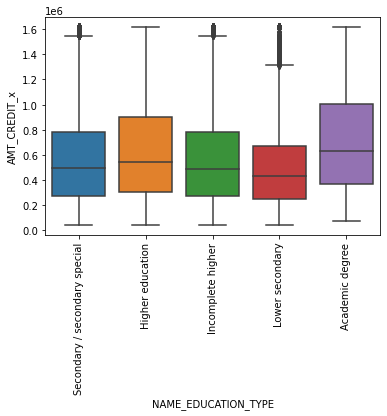

NAME_EDUCATION_TYPE AMT_GOODS_PRICE_x


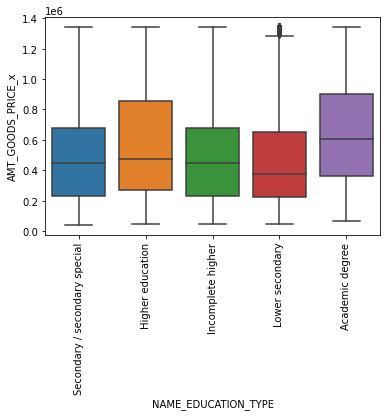

NAME_EDUCATION_TYPE DAYS_EMPLOYED


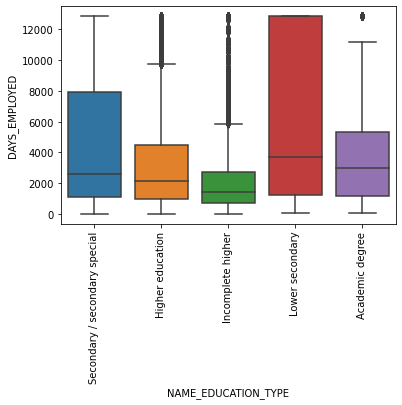

NAME_EDUCATION_TYPE DAYS_BIRTH


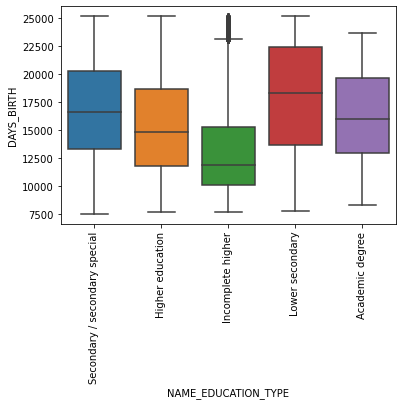

NAME_EDUCATION_TYPE AGE_BIRTH


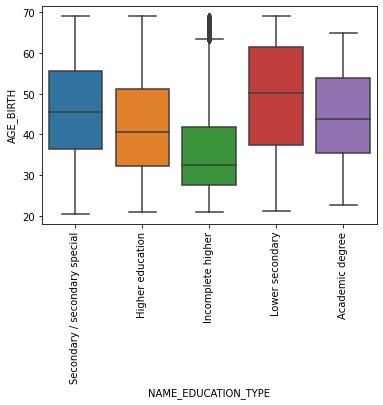

NAME_FAMILY_STATUS AMT_ANNUITY_x


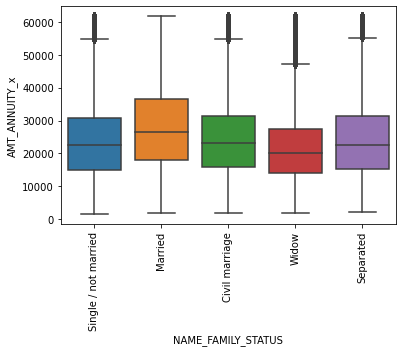

NAME_FAMILY_STATUS AMT_CREDIT_x


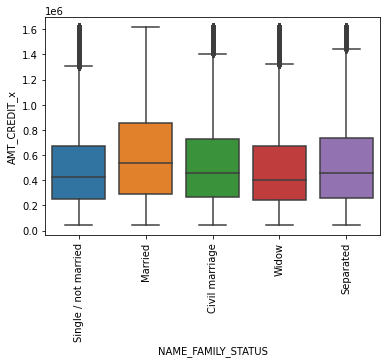

NAME_FAMILY_STATUS AMT_GOODS_PRICE_x


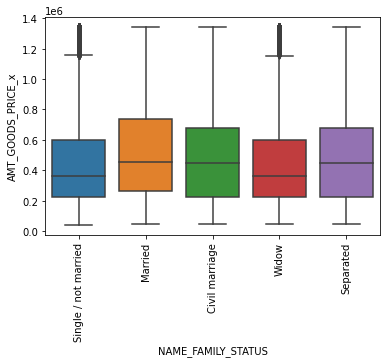

NAME_FAMILY_STATUS DAYS_EMPLOYED


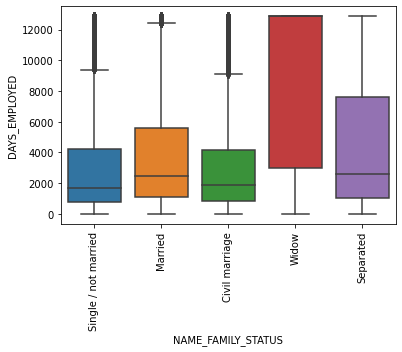

NAME_FAMILY_STATUS DAYS_BIRTH


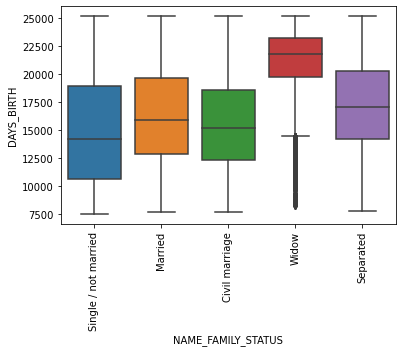

NAME_FAMILY_STATUS AGE_BIRTH


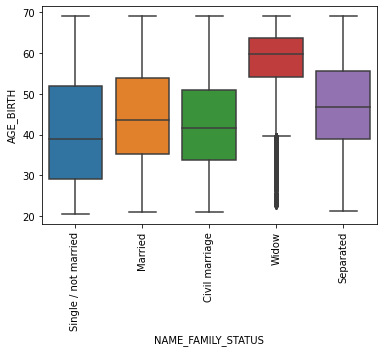

CHANNEL_TYPE AMT_ANNUITY_x


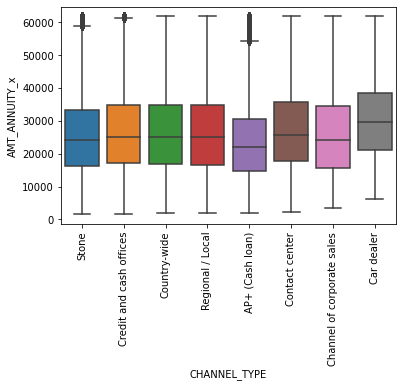

CHANNEL_TYPE AMT_CREDIT_x


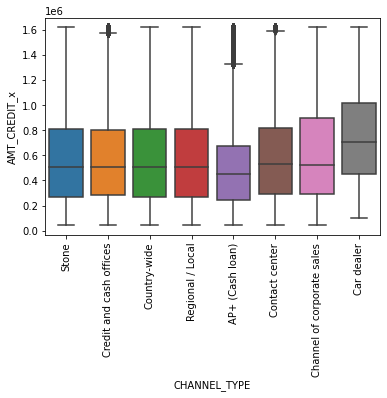

CHANNEL_TYPE AMT_GOODS_PRICE_x


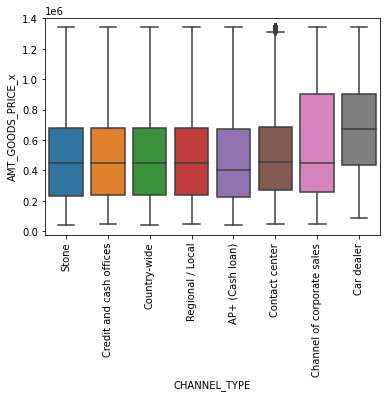

CHANNEL_TYPE DAYS_EMPLOYED


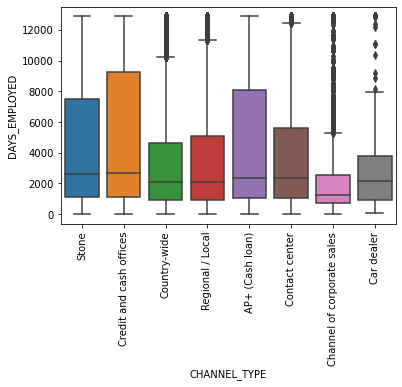

CHANNEL_TYPE DAYS_BIRTH


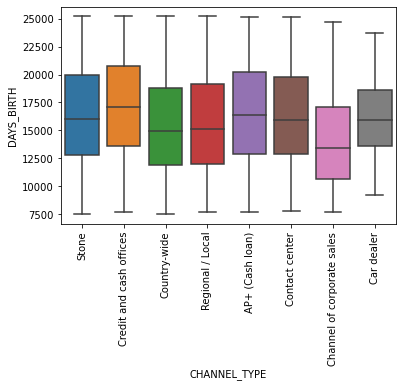

CHANNEL_TYPE AGE_BIRTH


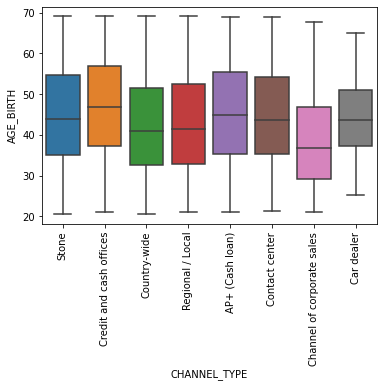

NAME_CONTRACT_TYPE_x AMT_ANNUITY_x


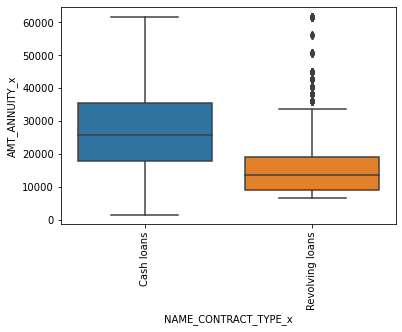

NAME_CONTRACT_TYPE_x AMT_CREDIT_x


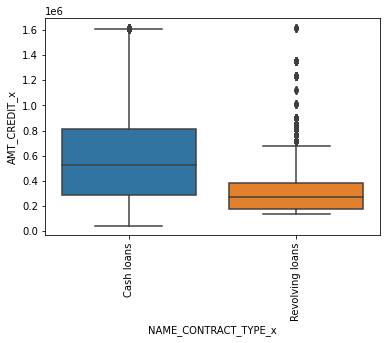

NAME_CONTRACT_TYPE_x AMT_GOODS_PRICE_x


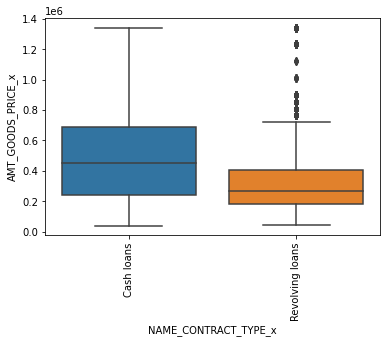

NAME_CONTRACT_TYPE_x DAYS_EMPLOYED


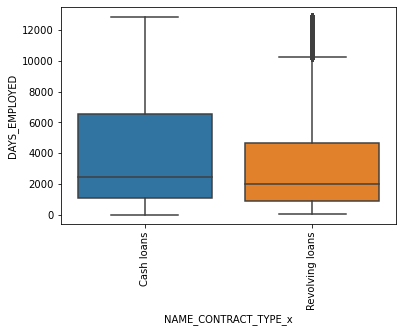

NAME_CONTRACT_TYPE_x DAYS_BIRTH


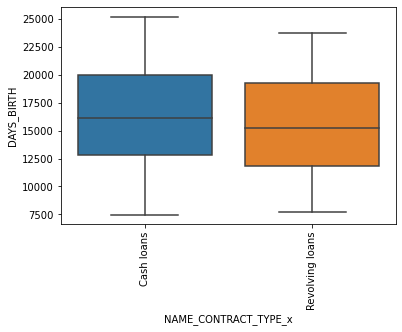

NAME_CONTRACT_TYPE_x AGE_BIRTH


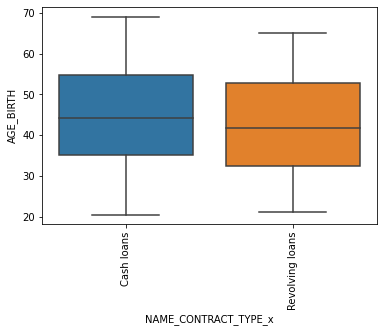

In [55]:
## Bivariate Analysis ####
for i in cat_mdcols:
    for j in cont_mdcols:
        print(i,j)
        plt.xticks(rotation=90)
        sns.boxplot(x=mdata[i],y=mdata[j])
        plt.show()

<AxesSubplot:xlabel='NAME_CLIENT_TYPE', ylabel='TARGET'>

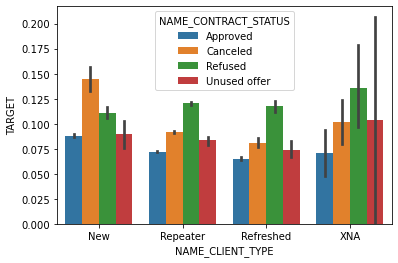

In [48]:
sns.barplot(y=mdata.TARGET,x=mdata.NAME_CLIENT_TYPE,hue=mdata.NAME_CONTRACT_STATUS)

<AxesSubplot:xlabel='NAME_FAMILY_STATUS', ylabel='AMT_CREDIT_x'>

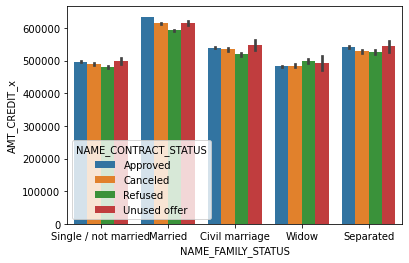

In [65]:
sns.barplot(y=mdata.AMT_CREDIT_x,x=mdata.NAME_FAMILY_STATUS,hue=mdata.NAME_CONTRACT_STATUS)

<AxesSubplot:xlabel='AMT_INCOME_TOTAL', ylabel='AMT_GOODS_PRICE_x'>

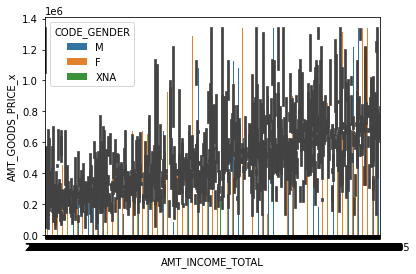

In [49]:
sns.barplot(y=mdata.AMT_GOODS_PRICE_x,x=mdata.AMT_INCOME_TOTAL,hue=mdata.CODE_GENDER)

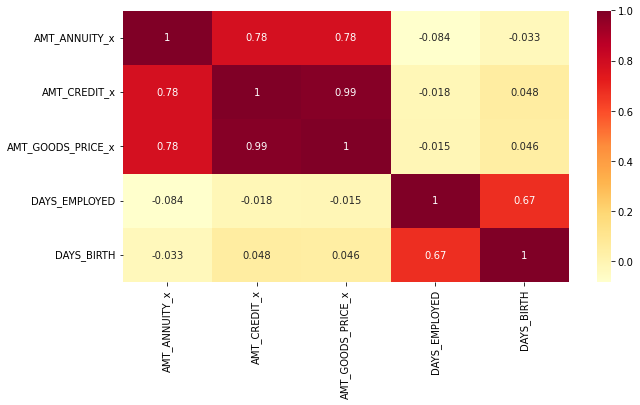

In [45]:
### Multivariate Analysis -- Heatmaps for Continous ####
fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(mdata[cont_mdcols].corr(),annot=True, cmap='YlOrRd')
plt.show()